In [1]:
#Group 3

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns 
from matplotlib import cm
%matplotlib inline




C:\Users\felix\AppData\Roaming\Python\Python310\site-packages\pandas\core\arrays\masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


In [3]:
#df = pd.read_csv(r"ProductImportance_data.csv") #Loading the data set
df = pd.read_csv(r"C:\Users\felix\Downloads\Machine Learning\ProductImportance_data.csv")
df.info() #Display the data set

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9533 entries, 0 to 9532
Data columns (total 12 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   ID                   9533 non-null   int64 
 1   Warehouse_block      9533 non-null   object
 2   Mode_of_Shipment     9533 non-null   object
 3   Customer_care_calls  9533 non-null   int64 
 4   Customer_rating      9533 non-null   int64 
 5   Cost_of_the_Product  9533 non-null   int64 
 6   Prior_purchases      9533 non-null   int64 
 7   Product_importance   9533 non-null   object
 8   Gender               9533 non-null   object
 9   Discount_offered     9533 non-null   int64 
 10  Weight_in_gms        9533 non-null   int64 
 11  Reached.on.Time_Y.N  9533 non-null   int64 
dtypes: int64(8), object(4)
memory usage: 893.8+ KB


In [4]:
df.describe()#Gain a statistical overview of the data set

,ID,Customer_care_calls,Customer_rating,Cost_of_the_Product,Prior_purchases,Discount_offered,Weight_in_gms,Reached.on.Time_Y.N
count,9533.000000,9533.000000,9533.000000,9533.000000,9533.000000,9533.000000,9533.000000,9533.000000
mean,5866.000000,4.096926,2.996853,211.627609,3.575580,11.425574,3804.273156,0.557012
std,2752.084392,1.154569,1.415619,48.200288,1.526133,14.567367,1618.791881,0.496765
min,1100.000000,2.000000,1.000000,96.000000,2.000000,1.000000,1001.000000,0.000000
25%,3483.000000,3.000000,2.000000,171.000000,3.000000,4.000000,1924.000000,0.000000
50%,5866.000000,4.000000,3.000000,217.000000,3.000000,7.000000,4343.000000,1.000000
75%,8249.000000,5.000000,4.000000,252.000000,4.000000,10.000000,5156.000000,1.000000
max,10632.000000,7.000000,5.000000,310.000000,10.000000,65.000000,6000.000000,1.000000


In [5]:
df.head(10) #display first 10 lines

,ID,Warehouse_block,Mode_of_Shipment,Customer_care_calls,Customer_rating,Cost_of_the_Product,Prior_purchases,Product_importance,Gender,Discount_offered,Weight_in_gms,Reached.on.Time_Y.N
0,1100,F,Flight,4,3,163,2,low,F,12,1092,1
1,1101,A,Flight,5,2,260,2,medium,M,23,3962,1
2,1102,B,Flight,6,2,159,5,medium,F,22,1247,1
3,1103,C,Flight,4,1,227,3,medium,M,54,3043,1
4,1104,F,Flight,3,3,104,5,medium,F,41,1936,1
5,1105,D,Flight,3,4,188,4,low,F,49,3067,1
6,1106,F,Flight,5,3,202,3,high,M,41,3536,1
7,1107,A,Flight,3,3,213,6,low,F,17,2424,1
8,1108,B,Flight,3,1,211,2,low,F,45,3332,1
9,1109,C,Flight,4,4,232,3,medium,F,61,2484,1


array([[<Axes: title={'center': 'Customer_care_calls'}>,
        <Axes: title={'center': 'Customer_rating'}>,
        <Axes: title={'center': 'Cost_of_the_Product'}>],
       [<Axes: title={'center': 'Prior_purchases'}>,
        <Axes: title={'center': 'Discount_offered'}>,
        <Axes: title={'center': 'Weight_in_gms'}>],
       [<Axes: title={'center': 'Reached.on.Time_Y.N'}>, <Axes: >,
        <Axes: >]], dtype=object)

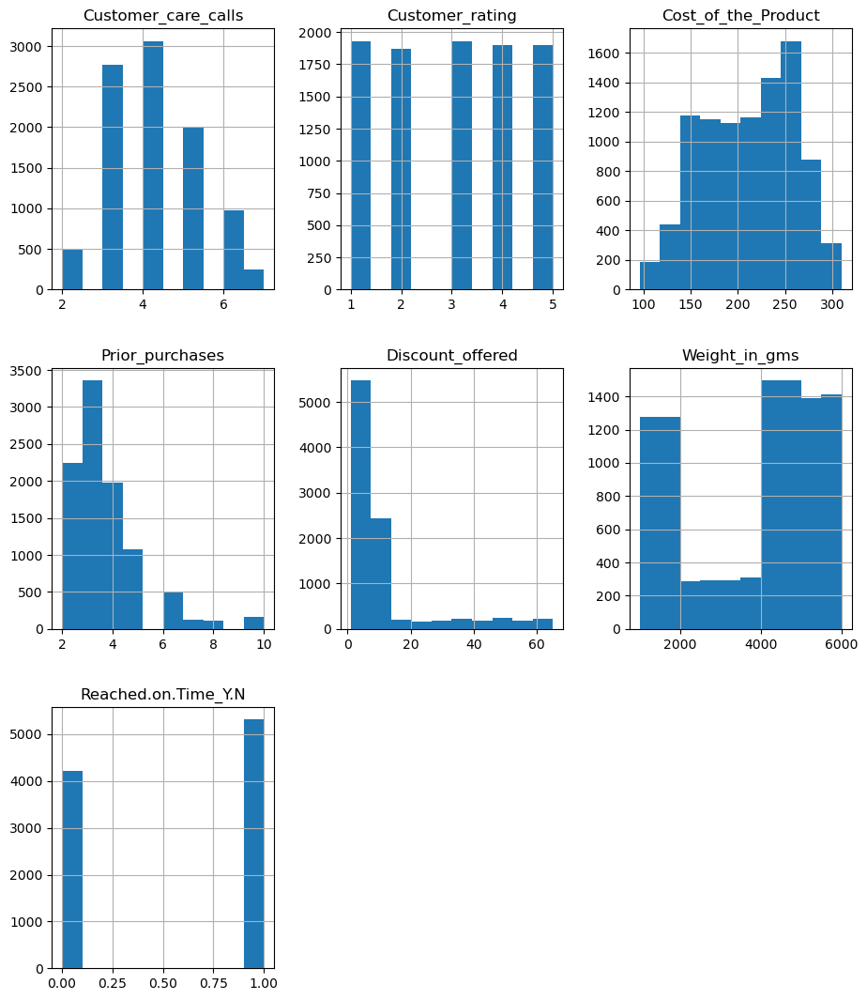

In [6]:
#Overview of the various attribute distributions
df_num = df [["Customer_care_calls", "Customer_rating", "Cost_of_the_Product", "Prior_purchases","Discount_offered","Weight_in_gms","Reached.on.Time_Y.N"]]
df_num.hist(figsize=[11,13])

Text(0.5, 1.0, 'Product_importance')

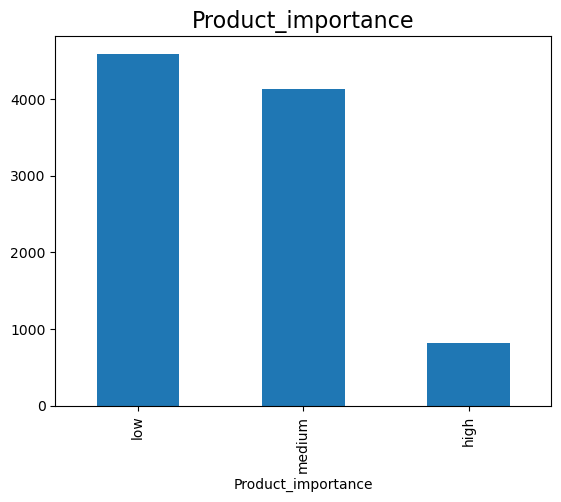

In [7]:
#Display the distribution of our target variable, only medium and high relevant for us
df_cat =df[["Warehouse_block","Mode_of_Shipment","Product_importance"]]
df_cat["Product_importance"].value_counts().plot.bar()
plt.title("Product_importance",fontsize=16)

Text(0.5, 1.0, 'Warehouse Blocks')

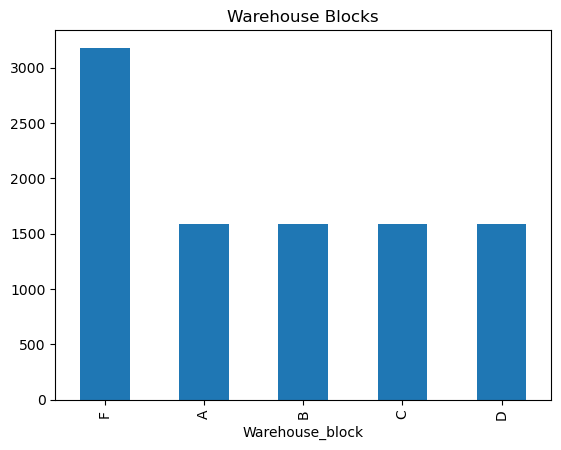

In [8]:
#Display the distribution of the Warehouse variable
df_cat["Warehouse_block"].value_counts().plot.bar() 
plt.title('Warehouse Blocks')

Text(0.5, 1.0, 'Mode_of_Shipment')

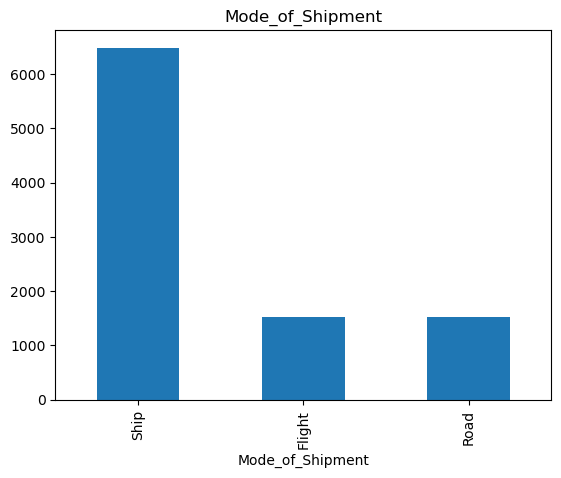

In [9]:
#Display the distribution of the selected shipping route
df_cat["Mode_of_Shipment"].value_counts().plot.bar() 
plt.title('Mode_of_Shipment')

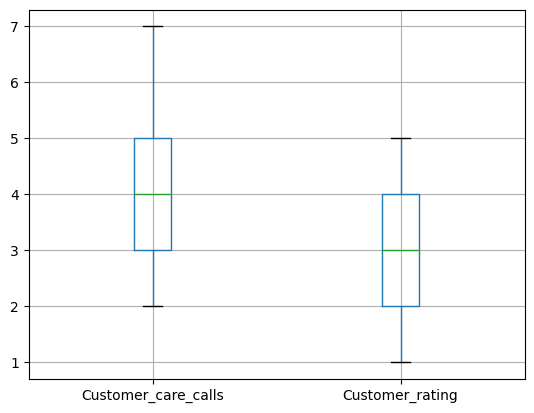

In [10]:
#Search for potential outsiders
boxplot1 = df.boxplot(column=["Customer_care_calls", "Customer_rating"],grid = True)

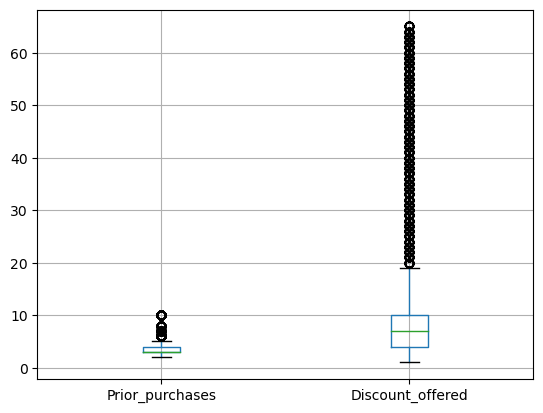

In [11]:
#Search for potential outsiders
boxplot2 = df.boxplot(column=["Prior_purchases","Discount_offered"],grid = True)

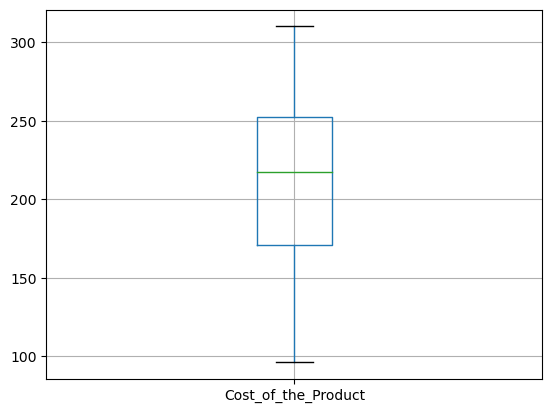

In [12]:
#Search for potential outsiders
boxplot3 = df.boxplot(column=["Cost_of_the_Product"],grid = True)

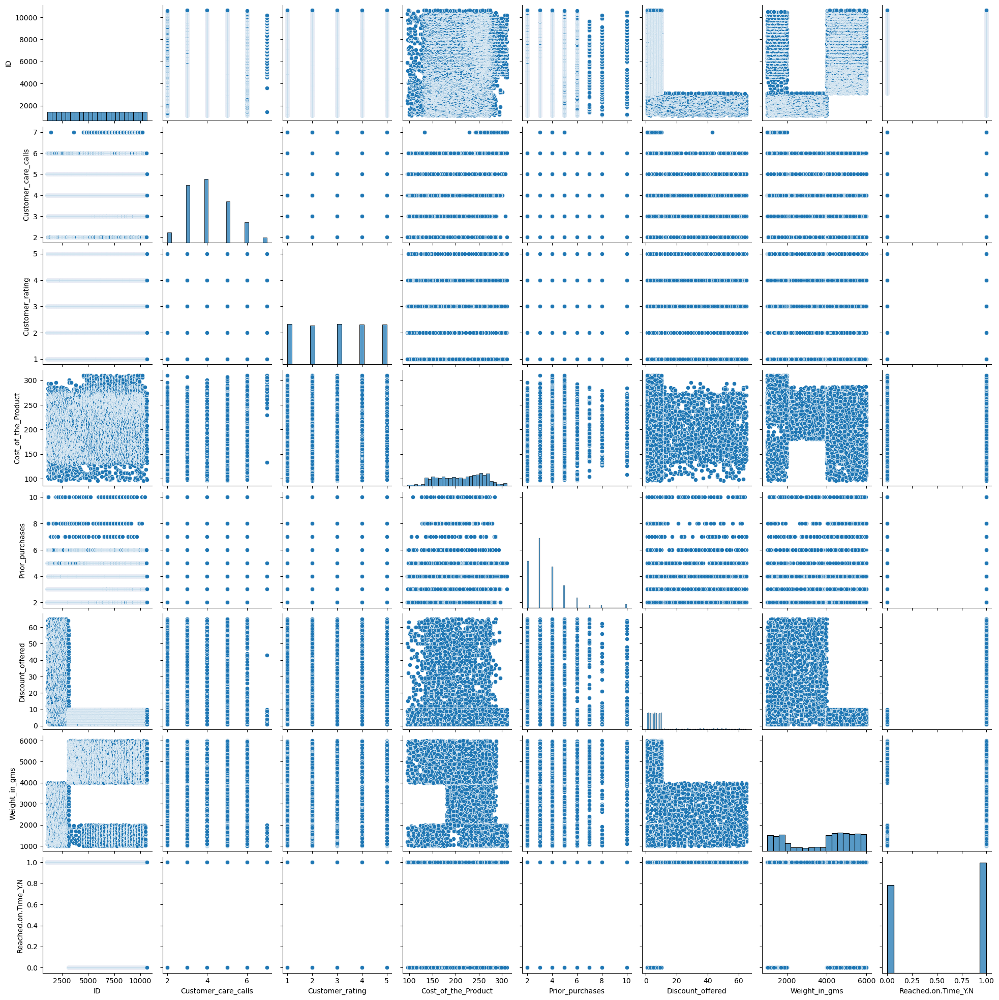

In [13]:
#Pairplot to see the relationship between the variables 
sns.pairplot(df) 

In [14]:
#Data Cleansing

In [15]:
#check for duplicates
print(df.duplicated()) 

0       False
1       False
2       False
3       False
4       False
        ...  
9528    False
9529    False
9530    False
9531    False
9532    False
Length: 9533, dtype: bool


In [16]:
#Display whether any variable has no entry
df.isnull().sum() 

ID                     0
Warehouse_block        0
Mode_of_Shipment       0
Customer_care_calls    0
Customer_rating        0
Cost_of_the_Product    0
Prior_purchases        0
Product_importance     0
Gender                 0
Discount_offered       0
Weight_in_gms          0
Reached.on.Time_Y.N    0
dtype: int64

In [17]:
#Deleting attributes Gender and ID
df_new=df
df_new =df_new.drop(columns=["Gender","ID"])
df_new.head(10)

,Warehouse_block,Mode_of_Shipment,Customer_care_calls,Customer_rating,Cost_of_the_Product,Prior_purchases,Product_importance,Discount_offered,Weight_in_gms,Reached.on.Time_Y.N
0,F,Flight,4,3,163,2,low,12,1092,1
1,A,Flight,5,2,260,2,medium,23,3962,1
2,B,Flight,6,2,159,5,medium,22,1247,1
3,C,Flight,4,1,227,3,medium,54,3043,1
4,F,Flight,3,3,104,5,medium,41,1936,1
5,D,Flight,3,4,188,4,low,49,3067,1
6,F,Flight,5,3,202,3,high,41,3536,1
7,A,Flight,3,3,213,6,low,17,2424,1
8,B,Flight,3,1,211,2,low,45,3332,1
9,C,Flight,4,4,232,3,medium,61,2484,1


In [18]:
#Deleting the "low" variables, as their are not considered
df_new_ohne_low = df_new[df.Product_importance != "low"]  

Text(0.5, 1.0, 'Product_importance')

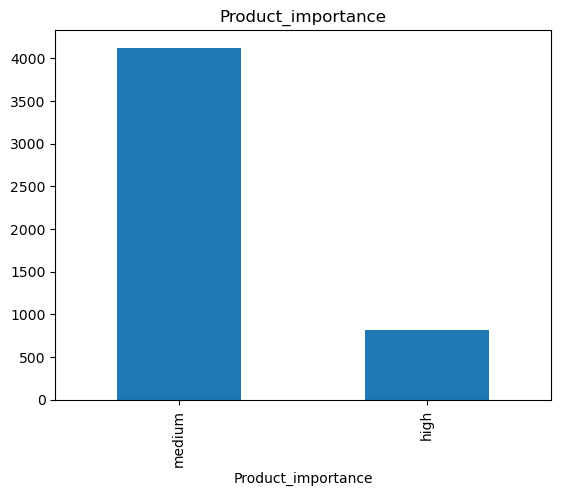

In [19]:
#Check: Did the deletion of the "Lows" work
df_new_ohne_low["Product_importance"].value_counts().plot.bar() 
plt.title("Product_importance")

In [20]:
#Display the info of the new data frame
df_new_ohne_low.info() 

<class 'pandas.core.frame.DataFrame'>
Index: 4942 entries, 1 to 9532
Data columns (total 10 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   Warehouse_block      4942 non-null   object
 1   Mode_of_Shipment     4942 non-null   object
 2   Customer_care_calls  4942 non-null   int64 
 3   Customer_rating      4942 non-null   int64 
 4   Cost_of_the_Product  4942 non-null   int64 
 5   Prior_purchases      4942 non-null   int64 
 6   Product_importance   4942 non-null   object
 7   Discount_offered     4942 non-null   int64 
 8   Weight_in_gms        4942 non-null   int64 
 9   Reached.on.Time_Y.N  4942 non-null   int64 
dtypes: int64(7), object(3)
memory usage: 424.7+ KB


In [21]:
#Data Transformation

In [22]:
#In the following steps, we created and stored several different DataFrames with various variations.
#This is because we conducted extensive testing, especially in the clustering section.
#This approach allows us to use the most optimally adjusted DataFrame to achieve the best possible results.

In [23]:
#Convert all variables to numerical values
from sklearn.preprocessing import LabelEncoder

df_clean = df_new_ohne_low.copy()
df_clean[["Warehouse_block","Mode_of_Shipment","Product_importance"]] =df_clean[["Warehouse_block","Mode_of_Shipment","Product_importance"]].apply(LabelEncoder().fit_transform)
df_clean.head(10)

,Warehouse_block,Mode_of_Shipment,Customer_care_calls,Customer_rating,Cost_of_the_Product,Prior_purchases,Product_importance,Discount_offered,Weight_in_gms,Reached.on.Time_Y.N
1,0,0,5,2,260,2,1,23,3962,1
2,1,0,6,2,159,5,1,22,1247,1
3,2,0,4,1,227,3,1,54,3043,1
4,4,0,3,3,104,5,1,41,1936,1
6,4,0,5,3,202,3,0,41,3536,1
9,2,0,4,4,232,3,1,61,2484,1
10,4,0,4,3,143,2,0,39,1727,1
11,3,0,5,1,196,3,1,24,2957,1
12,4,0,4,1,150,6,1,42,1070,1
13,0,0,5,1,222,3,0,21,2351,1


In [24]:
#Displaying information about the new dataframe
df_clean.info() 

<class 'pandas.core.frame.DataFrame'>
Index: 4942 entries, 1 to 9532
Data columns (total 10 columns):
 #   Column               Non-Null Count  Dtype
---  ------               --------------  -----
 0   Warehouse_block      4942 non-null   int32
 1   Mode_of_Shipment     4942 non-null   int32
 2   Customer_care_calls  4942 non-null   int64
 3   Customer_rating      4942 non-null   int64
 4   Cost_of_the_Product  4942 non-null   int64
 5   Prior_purchases      4942 non-null   int64
 6   Product_importance   4942 non-null   int32
 7   Discount_offered     4942 non-null   int64
 8   Weight_in_gms        4942 non-null   int64
 9   Reached.on.Time_Y.N  4942 non-null   int64
dtypes: int32(3), int64(7)
memory usage: 366.8 KB


In [25]:
#Display the correlation between the different attributes
print(df_clean.corr() ) 

                     Warehouse_block  Mode_of_Shipment  Customer_care_calls  \
Warehouse_block             1.000000          0.008998             0.002863   
Mode_of_Shipment            0.008998          1.000000            -0.035048   
Customer_care_calls         0.002863         -0.035048             1.000000   
Customer_rating             0.009750          0.013963             0.002865   
Cost_of_the_Product        -0.001178         -0.002028             0.291393   
Prior_purchases            -0.007702          0.000829             0.145814   
Product_importance          0.003477          0.015674             0.068770   
Discount_offered            0.011864          0.002070            -0.069044   
Weight_in_gms               0.011702          0.018252            -0.308170   
Reached.on.Time_Y.N        -0.001546         -0.001764            -0.027878   

                     Customer_rating  Cost_of_the_Product  Prior_purchases  \
Warehouse_block             0.009750            -0.0

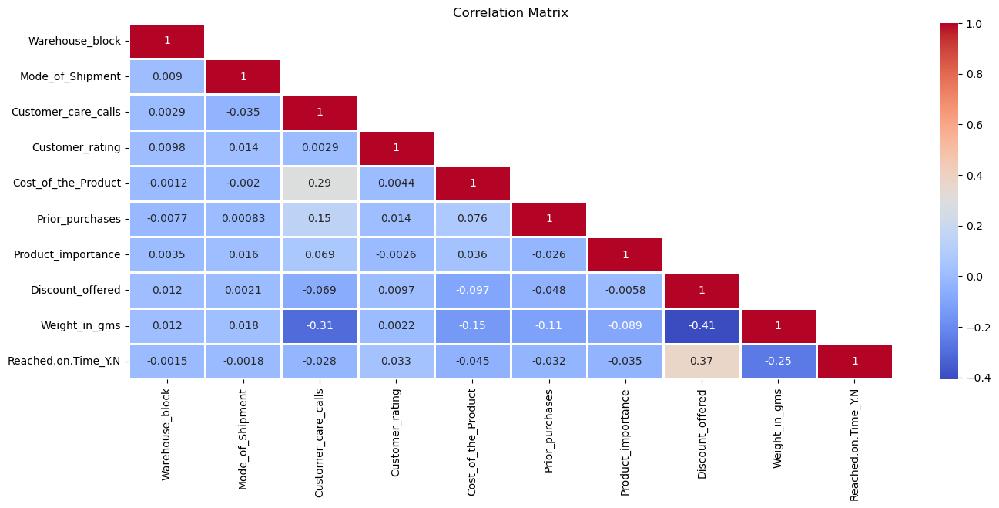

In [26]:
# Display the heatmap -># Helps in understanding the relationships and dependencies between different features
df_heatmap = df_clean.copy()
df_heatmap = df.select_dtypes(include=["int64"])
plt.figure(figsize=(16,6))
mask=np.triu(df_clean.corr(),k=1)
sns.heatmap(df_clean.corr(), annot=True,linewidths=1, mask=mask, cmap="coolwarm")

plt.title("Correlation Matrix")
plt.show()

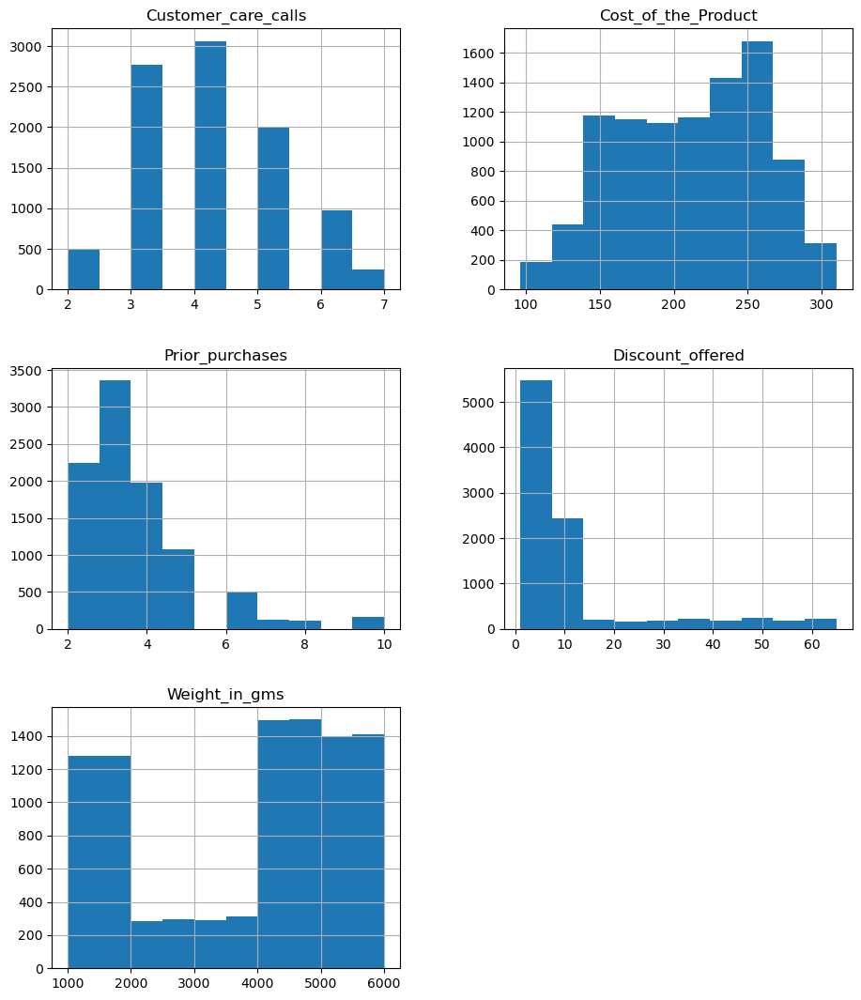

In [27]:
# Plotting histograms to visualize data distribution of numerical features
# Using bins to handle skewed distributions, reduce noise, and improve clustering performance
df_num = df[["Customer_care_calls", "Cost_of_the_Product", "Prior_purchases", "Discount_offered", "Weight_in_gms"]]
df_num.hist(figsize=[11, 13])
plt.show()

In [28]:
#Create new dataframe for testing
df_bins = df_clean.copy()

# Discretize 'Customer_care_calls' into 4 quantile-based bins
df_bins['Customer_care_calls_disc'] = pd.qcut(df_bins['Customer_care_calls'], q=4, labels=[0, 1, 2, 3])
df_bins['Customer_care_calls_disc'] = df_bins['Customer_care_calls_disc'].astype(int)
print("Customer_care_calls_disc:")
print(df_bins['Customer_care_calls_disc'].value_counts())
print(df_bins[['Customer_care_calls_disc']].dtypes)

# Explanation: 
# 'Customer_care_calls' was divided into 4 bins using quantiles to ensure each bin contains an approximately equal number of observations.
# This method was chosen because the distribution of calls shows clear peaks and valleys, making quantile-based binning a good fit.

# Discretize 'Cost_of_the_Product' into 4 quantile-based bins
df_bins['Cost_of_the_Product_disc'] = pd.qcut(df_bins['Cost_of_the_Product'], q=4, labels=[0, 1, 2, 3])
df_bins['Cost_of_the_Product_disc'] = df_bins['Cost_of_the_Product_disc'].astype(int)
print("Cost_of_the_Product_disc:")
print(df_bins['Cost_of_the_Product_disc'].value_counts())

# Explanation: 
# Similar to 'Customer_care_calls', 'Cost_of_the_Product' was divided into 4 quantile-based bins.
# This approach ensures a balanced distribution across the bins, which is important due to the broad range of product costs.

# Manually define bins for 'Prior_purchases'
bins_prior_purchases = [0, 2, 3, 5, 10]
labels_prior_purchases = [0, 1, 2, 3]
df_bins['Prior_purchases_disc'] = pd.cut(df_bins['Prior_purchases'], bins=bins_prior_purchases, labels=labels_prior_purchases, include_lowest=True)
df_bins['Prior_purchases_disc'] = df_bins['Prior_purchases_disc'].astype(int)
print("Prior_purchases_disc:")
print(df_bins['Prior_purchases_disc'].value_counts())

# Explanation:
# 'Prior_purchases' was binned manually to manage the skewed distribution and handle outliers.
# Bins were chosen to balance between capturing the distribution patterns and reducing the impact of outliers.

# Manually define bins for 'Discount_offered'
bins_discount_offered = [1, 6, 12, 44, 65]
labels_discount_offered = [0, 1, 2, 3]
df_bins['Discount_offered_disc'] = pd.cut(df_bins['Discount_offered'], bins=bins_discount_offered, labels=labels_discount_offered, include_lowest=True)
df_bins['Discount_offered_disc'] = df_bins['Discount_offered_disc'].astype(int)
print("Discount_offered_disc:")
print(df_bins['Discount_offered_disc'].value_counts())

# Explanation:
# For 'Discount_offered', manual binning was used to ensure that both common and rare discount ranges are effectively captured.
# The chosen bins help in mitigating outliers while preserving the overall distribution pattern.

# Manually define bins for 'Weight_in_gms'
bins_weight = [0, 2000, 4000, 6000]
labels_weight = [0, 1, 2]
df_bins['Weight_disc'] = pd.cut(df_bins['Weight_in_gms'], bins=bins_weight, labels=labels_weight)
df_bins['Weight_disc'] = df_bins['Weight_disc'].astype(int)
print("Weight_disc:")
print(df_bins['Weight_disc'].value_counts())

# Explanation:
# 'Weight_in_gms' was divided into three bins, reflecting its three main distribution groups.
# This straightforward approach simplifies the variable into main categories, aiding the clustering process.

# General Explanation:
# The combination of automatic (quantile-based) and manual binning was chosen based on the distribution characteristics of each feature.
# Automatic binning using quantiles ensures balanced bins, useful for features with a broad or irregular distribution.
# Manual binning was carefully defined to handle outliers and preserve the original distribution patterns.
# This balance was achieved through extensive experimentation and the application of mathematical formulas to optimize the bin edges.
# Binning improves clustering by reducing noise and focusing on significant patterns in the data.
# Check the data types of the updated columns

Customer_care_calls_disc:
Customer_care_calls_disc
0    1797
1    1574
2    1033
3     538
Name: count, dtype: int64
Customer_care_calls_disc    int32
dtype: object
Cost_of_the_Product_disc:
Cost_of_the_Product_disc
2    1251
0    1250
1    1242
3    1199
Name: count, dtype: int64
Prior_purchases_disc:
Prior_purchases_disc
1    1777
2    1418
0    1202
3     545
Name: count, dtype: int64
Discount_offered_disc:
Discount_offered_disc
0    2416
1    1647
2     505
3     374
Name: count, dtype: int64
Weight_disc:
Weight_disc
2    3181
0    1119
1     642
Name: count, dtype: int64


In [29]:
# Display the first 10 rows of the cleaned and binned DataFrame
df_bins.head(10)

,Warehouse_block,Mode_of_Shipment,Customer_care_calls,Customer_rating,Cost_of_the_Product,Prior_purchases,Product_importance,Discount_offered,Weight_in_gms,Reached.on.Time_Y.N,Customer_care_calls_disc,Cost_of_the_Product_disc,Prior_purchases_disc,Discount_offered_disc,Weight_disc
1,0,0,5,2,260,2,1,23,3962,1,2,3,0,2,1
2,1,0,6,2,159,5,1,22,1247,1,3,0,2,2,0
3,2,0,4,1,227,3,1,54,3043,1,1,2,1,3,1
4,4,0,3,3,104,5,1,41,1936,1,0,0,2,2,0
6,4,0,5,3,202,3,0,41,3536,1,2,1,1,2,1
9,2,0,4,4,232,3,1,61,2484,1,1,2,1,3,1
10,4,0,4,3,143,2,0,39,1727,1,1,0,0,2,0
11,3,0,5,1,196,3,1,24,2957,1,2,1,1,2,1
12,4,0,4,1,150,6,1,42,1070,1,1,0,3,2,0
13,0,0,5,1,222,3,0,21,2351,1,2,2,1,2,1


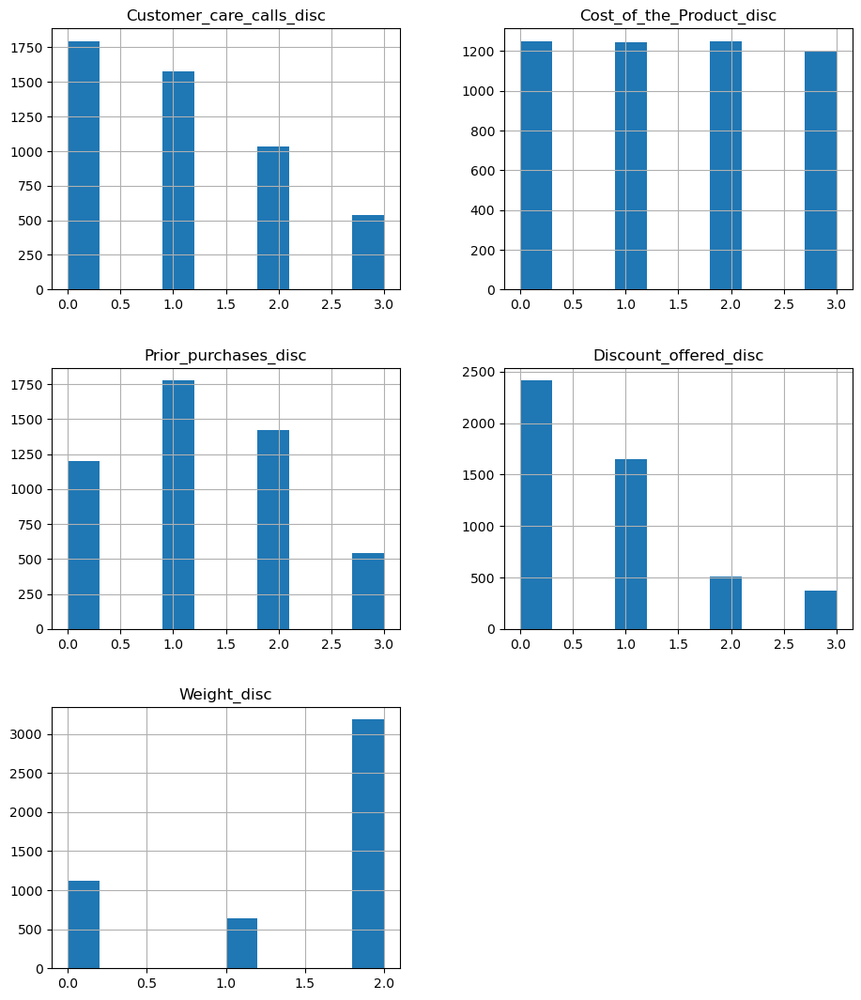

In [30]:
# Visualization of the discretized data
df_num_disc = df_bins[['Customer_care_calls_disc', 'Cost_of_the_Product_disc', 'Prior_purchases_disc', 'Discount_offered_disc', 'Weight_disc']]
df_num_disc.hist(figsize=[11, 13])
plt.show()

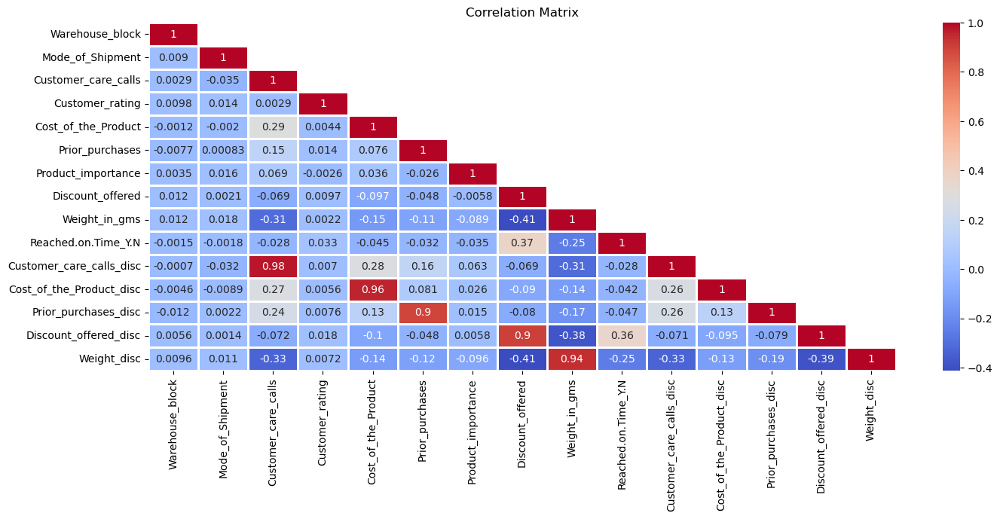

In [31]:
# Create a copy of the cleaned DataFrame for heatmap visualization

# Convert all integer columns to int64
for col in df_bins.select_dtypes(include=["int32", "int"]).columns:
    df_bins[col] = df_bins[col].astype('int64')

# Select all integer columns (int64)
df_heatmap = df_bins.select_dtypes(include=["int64"])

# Plot the heatmap
plt.figure(figsize=(16, 6))
mask = np.triu(df_heatmap.corr(), k=1)
sns.heatmap(df_heatmap.corr(), annot=True, linewidths=1, mask=mask, cmap="coolwarm")

plt.title("Correlation Matrix")
plt.show()

# Explanation:
# Checking correlations between original features and new bins.
# Ensures binning maintains logical relationships and supports clustering.

In [32]:
# Replace original values with discretized values
df_bins['Customer_care_calls'] = df_bins['Customer_care_calls_disc']
df_bins['Cost_of_the_Product'] = df_bins['Cost_of_the_Product_disc']
df_bins['Prior_purchases'] = df_bins['Prior_purchases_disc']
df_bins['Discount_offered'] = df_bins['Discount_offered_disc']
df_bins['Weight_in_gms'] = df_bins['Weight_disc']

# Remove temporary discretized columns
df_bins.drop(columns=['Customer_care_calls_disc', 'Cost_of_the_Product_disc', 'Prior_purchases_disc', 'Discount_offered_disc', 'Weight_disc'], inplace=True)

In [33]:
# Display the first 10 rows of the cleaned and binned DataFrame
df_bins.head(10)

,Warehouse_block,Mode_of_Shipment,Customer_care_calls,Customer_rating,Cost_of_the_Product,Prior_purchases,Product_importance,Discount_offered,Weight_in_gms,Reached.on.Time_Y.N
1,0,0,2,2,3,0,1,2,1,1
2,1,0,3,2,0,2,1,2,0,1
3,2,0,1,1,2,1,1,3,1,1
4,4,0,0,3,0,2,1,2,0,1
6,4,0,2,3,1,1,0,2,1,1
9,2,0,1,4,2,1,1,3,1,1
10,4,0,1,3,0,0,0,2,0,1
11,3,0,2,1,1,1,1,2,1,1
12,4,0,1,1,0,3,1,2,0,1
13,0,0,2,1,2,1,0,2,1,1


In [34]:
# Scale the data to improve algorithm efficiency, prevent model manipulation, and ease interpretability
# Using StandardScaler for additional testing
# We only Scale attributes, that were numerical at the beginning
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

In [35]:
#Scale der df_clean with Standardscaler
df_standard =df_clean.copy() 
df_standard[["Customer_rating", 'Customer_care_calls', 'Prior_purchases', 'Cost_of_the_Product', 'Discount_offered', 'Weight_in_gms']] = scaler.fit_transform(df_standard[["Customer_rating", 'Customer_care_calls', 'Prior_purchases', 'Cost_of_the_Product', 'Discount_offered', 'Weight_in_gms']])
df_standard.head(10)

,Warehouse_block,Mode_of_Shipment,Customer_care_calls,Customer_rating,Cost_of_the_Product,Prior_purchases,Product_importance,Discount_offered,Weight_in_gms,Reached.on.Time_Y.N
1,0,0,0.860059,-0.715568,1.061463,-0.968719,1,0.758529,0.016280,1
2,1,0,1.749452,-0.715568,-1.055830,0.826335,1,0.691534,-1.726882,1
3,2,0,-0.029335,-1.428251,0.369674,-0.370368,1,2.835380,-0.573763,1
4,4,0,-0.918728,-0.002884,-2.208812,0.826335,1,1.964442,-1.284510,1
6,4,0,0.860059,-0.002884,-0.154408,-0.370368,0,1.964442,-0.257233,1
9,2,0,-0.029335,0.709799,0.474491,-0.370368,1,3.304346,-0.932668,1
10,4,0,-0.029335,-0.002884,-1.391243,-0.968719,0,1.830452,-1.418698,1
11,3,0,0.860059,-1.428251,-0.280188,-0.370368,1,0.825524,-0.628979,1
12,4,0,-0.029335,-1.428251,-1.244500,1.424686,1,2.031438,-1.840524,1
13,0,0,0.860059,-1.428251,0.264858,-0.370368,0,0.624538,-1.018060,1


In [36]:
#Scale der df_bins with Standardscaler
df_bins_standard =df_bins.copy() 
df_bins_standard[["Customer_rating", 'Customer_care_calls', 'Prior_purchases', 'Cost_of_the_Product', 'Discount_offered', 'Weight_in_gms']] = scaler.fit_transform(df_bins_standard[["Customer_rating", 'Customer_care_calls', 'Prior_purchases', 'Cost_of_the_Product', 'Discount_offered', 'Weight_in_gms']])
df_bins_standard.head(10)

,Warehouse_block,Mode_of_Shipment,Customer_care_calls,Customer_rating,Cost_of_the_Product,Prior_purchases,Product_importance,Discount_offered,Weight_in_gms,Reached.on.Time_Y.N
1,0,0,0.934949,-0.715568,1.359638,-1.331595,1,1.349151,-0.500127,1
2,1,0,1.932901,-0.715568,-1.333481,0.774917,1,1.349151,-1.698782,1
3,2,0,-0.063003,-1.428251,0.461932,-0.278339,1,2.441289,-0.500127,1
4,4,0,-1.060955,-0.002884,-1.333481,0.774917,1,1.349151,-1.698782,1
6,4,0,0.934949,-0.002884,-0.435775,-0.278339,0,1.349151,-0.500127,1
9,2,0,-0.063003,0.709799,0.461932,-0.278339,1,2.441289,-0.500127,1
10,4,0,-0.063003,-0.002884,-1.333481,-1.331595,0,1.349151,-1.698782,1
11,3,0,0.934949,-1.428251,-0.435775,-0.278339,1,1.349151,-0.500127,1
12,4,0,-0.063003,-1.428251,-1.333481,1.828173,1,1.349151,-1.698782,1
13,0,0,0.934949,-1.428251,0.461932,-0.278339,0,1.349151,-0.500127,1


In [37]:
# Scale the data to improve algorithm efficiency, prevent model manipulation, and ease interpretability
# Using MixMaxScaler
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

In [38]:
#Scale der df_clean with MixMaxScaler
df_min_max =df_clean.copy() 
df_min_max[['Customer_care_calls', 'Prior_purchases', 'Cost_of_the_Product', 'Discount_offered', 'Weight_in_gms']] = scaler.fit_transform(df_min_max[['Customer_care_calls', 'Prior_purchases', 'Cost_of_the_Product', 'Discount_offered', 'Weight_in_gms']])
df_min_max.head(10)

,Warehouse_block,Mode_of_Shipment,Customer_care_calls,Customer_rating,Cost_of_the_Product,Prior_purchases,Product_importance,Discount_offered,Weight_in_gms,Reached.on.Time_Y.N
1,0,0,0.6,2,0.766355,0.000,1,0.343750,0.592318,1
2,1,0,0.8,2,0.294393,0.375,1,0.328125,0.049210,1
3,2,0,0.4,1,0.612150,0.125,1,0.828125,0.408482,1
4,4,0,0.2,3,0.037383,0.375,1,0.625000,0.187037,1
6,4,0,0.6,3,0.495327,0.125,0,0.625000,0.507101,1
9,2,0,0.4,4,0.635514,0.125,1,0.937500,0.296659,1
10,4,0,0.4,3,0.219626,0.000,0,0.593750,0.145229,1
11,3,0,0.6,1,0.467290,0.125,1,0.359375,0.391278,1
12,4,0,0.4,1,0.252336,0.500,1,0.640625,0.013803,1
13,0,0,0.6,1,0.588785,0.125,0,0.312500,0.270054,1


In [39]:
#Scale der df_bins with MixMaxScaler
df_bins_min_max =df_bins.copy() 
df_bins_min_max[['Customer_care_calls', 'Prior_purchases', 'Cost_of_the_Product', 'Discount_offered', 'Weight_in_gms']] = scaler.fit_transform(df_bins_min_max[['Customer_care_calls', 'Prior_purchases', 'Cost_of_the_Product', 'Discount_offered', 'Weight_in_gms']])
df_bins_min_max.head(10)

,Warehouse_block,Mode_of_Shipment,Customer_care_calls,Customer_rating,Cost_of_the_Product,Prior_purchases,Product_importance,Discount_offered,Weight_in_gms,Reached.on.Time_Y.N
1,0,0,0.666667,2,1.000000,0.000000,1,0.666667,0.5,1
2,1,0,1.000000,2,0.000000,0.666667,1,0.666667,0.0,1
3,2,0,0.333333,1,0.666667,0.333333,1,1.000000,0.5,1
4,4,0,0.000000,3,0.000000,0.666667,1,0.666667,0.0,1
6,4,0,0.666667,3,0.333333,0.333333,0,0.666667,0.5,1
9,2,0,0.333333,4,0.666667,0.333333,1,1.000000,0.5,1
10,4,0,0.333333,3,0.000000,0.000000,0,0.666667,0.0,1
11,3,0,0.666667,1,0.333333,0.333333,1,0.666667,0.5,1
12,4,0,0.333333,1,0.000000,1.000000,1,0.666667,0.0,1
13,0,0,0.666667,1,0.666667,0.333333,0,0.666667,0.5,1


In [40]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder, StandardScaler

# One-Hot Encoding with df_clean
df_categorical = df_clean.copy()

# One-Hot Encoding for other categorical columns
categorical_columns = ['Warehouse_block', 'Mode_of_Shipment']
df_categorical = pd.get_dummies(df_categorical, columns=categorical_columns)

# Convert True/False to 0/1
df_categorical = df_categorical.astype(int)

df_categorical.head(10)

# Comments:
# Applying One-Hot Encoding to 'Warehouse_block' and 'Mode_of_Shipment' to create binary columns for each category.
# One-Hot Encoding is used to handle categorical data without imposing an ordinal relationship.
# Converting boolean values to integers (0/1).

,Customer_care_calls,Customer_rating,Cost_of_the_Product,Prior_purchases,Product_importance,Discount_offered,Weight_in_gms,Reached.on.Time_Y.N,Warehouse_block_0,Warehouse_block_1,Warehouse_block_2,Warehouse_block_3,Warehouse_block_4,Mode_of_Shipment_0,Mode_of_Shipment_1,Mode_of_Shipment_2
1,5,2,260,2,1,23,3962,1,1,0,0,0,0,1,0,0
2,6,2,159,5,1,22,1247,1,0,1,0,0,0,1,0,0
3,4,1,227,3,1,54,3043,1,0,0,1,0,0,1,0,0
4,3,3,104,5,1,41,1936,1,0,0,0,0,1,1,0,0
6,5,3,202,3,0,41,3536,1,0,0,0,0,1,1,0,0
9,4,4,232,3,1,61,2484,1,0,0,1,0,0,1,0,0
10,4,3,143,2,0,39,1727,1,0,0,0,0,1,1,0,0
11,5,1,196,3,1,24,2957,1,0,0,0,1,0,1,0,0
12,4,1,150,6,1,42,1070,1,0,0,0,0,1,1,0,0
13,5,1,222,3,0,21,2351,1,1,0,0,0,0,1,0,0


In [41]:
# One-Hot Encoding with df_bins
df_categorical_bins = df_bins.copy()

# One-Hot Encoding for other categorical columns
categorical_columns = ['Warehouse_block', 'Mode_of_Shipment']
df_categorical_bins = pd.get_dummies(df_categorical_bins, columns=categorical_columns)

# Convert True/False to 0/1
df_categorical_bins = df_categorical_bins.astype(int)

df_categorical_bins.head(10)

,Customer_care_calls,Customer_rating,Cost_of_the_Product,Prior_purchases,Product_importance,Discount_offered,Weight_in_gms,Reached.on.Time_Y.N,Warehouse_block_0,Warehouse_block_1,Warehouse_block_2,Warehouse_block_3,Warehouse_block_4,Mode_of_Shipment_0,Mode_of_Shipment_1,Mode_of_Shipment_2
1,2,2,3,0,1,2,1,1,1,0,0,0,0,1,0,0
2,3,2,0,2,1,2,0,1,0,1,0,0,0,1,0,0
3,1,1,2,1,1,3,1,1,0,0,1,0,0,1,0,0
4,0,3,0,2,1,2,0,1,0,0,0,0,1,1,0,0
6,2,3,1,1,0,2,1,1,0,0,0,0,1,1,0,0
9,1,4,2,1,1,3,1,1,0,0,1,0,0,1,0,0
10,1,3,0,0,0,2,0,1,0,0,0,0,1,1,0,0
11,2,1,1,1,1,2,1,1,0,0,0,1,0,1,0,0
12,1,1,0,3,1,2,0,1,0,0,0,0,1,1,0,0
13,2,1,2,1,0,2,1,1,1,0,0,0,0,1,0,0


In [42]:
# df_categorical_standard and df_categorical_bins_standard getting scaled
# We only Scale attributes, that were numerical at the beginning

attributes = [
    'Customer_care_calls', 'Customer_rating', 'Cost_of_the_Product',
    'Prior_purchases', 'Discount_offered', 'Weight_in_gms'
]

# Initialize the scalers
standard_scaler = StandardScaler()
minmax_scaler = MinMaxScaler()

# Scale the specified attributes with StandardScaler
df_categorical_standard = df_categorical.copy()
df_categorical_standard[attributes] = standard_scaler.fit_transform(df_categorical_standard[attributes])

df_categorical_bins_standard = df_categorical_bins.copy()
df_categorical_bins_standard[attributes] = standard_scaler.fit_transform(df_categorical_bins_standard[attributes])

# Scale the specified attributes with MinMaxScaler
df_categorical_min_max = df_categorical.copy()
df_categorical_min_max[attributes] = minmax_scaler.fit_transform(df_categorical_min_max[attributes])

df_categorical_bins_min_max = df_categorical_bins.copy()
df_categorical_bins_min_max[attributes] = minmax_scaler.fit_transform(df_categorical_bins_min_max[attributes])

In [43]:
# Checking dataframe df_categorical_standard
df_categorical_standard.head(10)

,Customer_care_calls,Customer_rating,Cost_of_the_Product,Prior_purchases,Product_importance,Discount_offered,Weight_in_gms,Reached.on.Time_Y.N,Warehouse_block_0,Warehouse_block_1,Warehouse_block_2,Warehouse_block_3,Warehouse_block_4,Mode_of_Shipment_0,Mode_of_Shipment_1,Mode_of_Shipment_2
1,0.860059,-0.715568,1.061463,-0.968719,1,0.758529,0.016280,1,1,0,0,0,0,1,0,0
2,1.749452,-0.715568,-1.055830,0.826335,1,0.691534,-1.726882,1,0,1,0,0,0,1,0,0
3,-0.029335,-1.428251,0.369674,-0.370368,1,2.835380,-0.573763,1,0,0,1,0,0,1,0,0
4,-0.918728,-0.002884,-2.208812,0.826335,1,1.964442,-1.284510,1,0,0,0,0,1,1,0,0
6,0.860059,-0.002884,-0.154408,-0.370368,0,1.964442,-0.257233,1,0,0,0,0,1,1,0,0
9,-0.029335,0.709799,0.474491,-0.370368,1,3.304346,-0.932668,1,0,0,1,0,0,1,0,0
10,-0.029335,-0.002884,-1.391243,-0.968719,0,1.830452,-1.418698,1,0,0,0,0,1,1,0,0
11,0.860059,-1.428251,-0.280188,-0.370368,1,0.825524,-0.628979,1,0,0,0,1,0,1,0,0
12,-0.029335,-1.428251,-1.244500,1.424686,1,2.031438,-1.840524,1,0,0,0,0,1,1,0,0
13,0.860059,-1.428251,0.264858,-0.370368,0,0.624538,-1.018060,1,1,0,0,0,0,1,0,0


In [44]:
# Checking datafame
df_categorical_bins_standard.head(10)

,Customer_care_calls,Customer_rating,Cost_of_the_Product,Prior_purchases,Product_importance,Discount_offered,Weight_in_gms,Reached.on.Time_Y.N,Warehouse_block_0,Warehouse_block_1,Warehouse_block_2,Warehouse_block_3,Warehouse_block_4,Mode_of_Shipment_0,Mode_of_Shipment_1,Mode_of_Shipment_2
1,0.934949,-0.715568,1.359638,-1.331595,1,1.349151,-0.500127,1,1,0,0,0,0,1,0,0
2,1.932901,-0.715568,-1.333481,0.774917,1,1.349151,-1.698782,1,0,1,0,0,0,1,0,0
3,-0.063003,-1.428251,0.461932,-0.278339,1,2.441289,-0.500127,1,0,0,1,0,0,1,0,0
4,-1.060955,-0.002884,-1.333481,0.774917,1,1.349151,-1.698782,1,0,0,0,0,1,1,0,0
6,0.934949,-0.002884,-0.435775,-0.278339,0,1.349151,-0.500127,1,0,0,0,0,1,1,0,0
9,-0.063003,0.709799,0.461932,-0.278339,1,2.441289,-0.500127,1,0,0,1,0,0,1,0,0
10,-0.063003,-0.002884,-1.333481,-1.331595,0,1.349151,-1.698782,1,0,0,0,0,1,1,0,0
11,0.934949,-1.428251,-0.435775,-0.278339,1,1.349151,-0.500127,1,0,0,0,1,0,1,0,0
12,-0.063003,-1.428251,-1.333481,1.828173,1,1.349151,-1.698782,1,0,0,0,0,1,1,0,0
13,0.934949,-1.428251,0.461932,-0.278339,0,1.349151,-0.500127,1,1,0,0,0,0,1,0,0


In [45]:
# Checking dataframe
df_categorical_min_max.head(10)

,Customer_care_calls,Customer_rating,Cost_of_the_Product,Prior_purchases,Product_importance,Discount_offered,Weight_in_gms,Reached.on.Time_Y.N,Warehouse_block_0,Warehouse_block_1,Warehouse_block_2,Warehouse_block_3,Warehouse_block_4,Mode_of_Shipment_0,Mode_of_Shipment_1,Mode_of_Shipment_2
1,0.6,0.25,0.766355,0.000,1,0.343750,0.592318,1,1,0,0,0,0,1,0,0
2,0.8,0.25,0.294393,0.375,1,0.328125,0.049210,1,0,1,0,0,0,1,0,0
3,0.4,0.00,0.612150,0.125,1,0.828125,0.408482,1,0,0,1,0,0,1,0,0
4,0.2,0.50,0.037383,0.375,1,0.625000,0.187037,1,0,0,0,0,1,1,0,0
6,0.6,0.50,0.495327,0.125,0,0.625000,0.507101,1,0,0,0,0,1,1,0,0
9,0.4,0.75,0.635514,0.125,1,0.937500,0.296659,1,0,0,1,0,0,1,0,0
10,0.4,0.50,0.219626,0.000,0,0.593750,0.145229,1,0,0,0,0,1,1,0,0
11,0.6,0.00,0.467290,0.125,1,0.359375,0.391278,1,0,0,0,1,0,1,0,0
12,0.4,0.00,0.252336,0.500,1,0.640625,0.013803,1,0,0,0,0,1,1,0,0
13,0.6,0.00,0.588785,0.125,0,0.312500,0.270054,1,1,0,0,0,0,1,0,0


In [46]:
# Checking dataframe
df_categorical_bins_min_max.head(10)

,Customer_care_calls,Customer_rating,Cost_of_the_Product,Prior_purchases,Product_importance,Discount_offered,Weight_in_gms,Reached.on.Time_Y.N,Warehouse_block_0,Warehouse_block_1,Warehouse_block_2,Warehouse_block_3,Warehouse_block_4,Mode_of_Shipment_0,Mode_of_Shipment_1,Mode_of_Shipment_2
1,0.666667,0.25,1.000000,0.000000,1,0.666667,0.5,1,1,0,0,0,0,1,0,0
2,1.000000,0.25,0.000000,0.666667,1,0.666667,0.0,1,0,1,0,0,0,1,0,0
3,0.333333,0.00,0.666667,0.333333,1,1.000000,0.5,1,0,0,1,0,0,1,0,0
4,0.000000,0.50,0.000000,0.666667,1,0.666667,0.0,1,0,0,0,0,1,1,0,0
6,0.666667,0.50,0.333333,0.333333,0,0.666667,0.5,1,0,0,0,0,1,1,0,0
9,0.333333,0.75,0.666667,0.333333,1,1.000000,0.5,1,0,0,1,0,0,1,0,0
10,0.333333,0.50,0.000000,0.000000,0,0.666667,0.0,1,0,0,0,0,1,1,0,0
11,0.666667,0.00,0.333333,0.333333,1,0.666667,0.5,1,0,0,0,1,0,1,0,0
12,0.333333,0.00,0.000000,1.000000,1,0.666667,0.0,1,0,0,0,0,1,1,0,0
13,0.666667,0.00,0.666667,0.333333,0,0.666667,0.5,1,1,0,0,0,0,1,0,0


In [47]:
# Overview of all DataFrames

df_clean # Cleaned DataFrame with relevant attributes and numerical values
df_bins # df_clean with binned values
df_standard # StandardScaled version of df_clean
df_min_max # MinMaxScaled version of df_clean
df_bins_standard # StandardScaled version of df_bins
df_bins_min_max # MinMaxScaled version of df_bins
df_categorical # Unscaled DataFrame with label encoding of categorical values
df_categorical_standard # StandardScaled version of df_categorical
df_categorical_min_max # MinMaxScaled version of df_categorical
df_categorical_bins_standard # StandardScaled version of df_categorical_bins
df_categorical_bins_min_max # MinMaxScaled version of df_categorical_bins

,Customer_care_calls,Customer_rating,Cost_of_the_Product,Prior_purchases,Product_importance,Discount_offered,Weight_in_gms,Reached.on.Time_Y.N,Warehouse_block_0,Warehouse_block_1,Warehouse_block_2,Warehouse_block_3,Warehouse_block_4,Mode_of_Shipment_0,Mode_of_Shipment_1,Mode_of_Shipment_2
1,0.666667,0.25,1.000000,0.000000,1,0.666667,0.5,1,1,0,0,0,0,1,0,0
2,1.000000,0.25,0.000000,0.666667,1,0.666667,0.0,1,0,1,0,0,0,1,0,0
3,0.333333,0.00,0.666667,0.333333,1,1.000000,0.5,1,0,0,1,0,0,1,0,0
4,0.000000,0.50,0.000000,0.666667,1,0.666667,0.0,1,0,0,0,0,1,1,0,0
6,0.666667,0.50,0.333333,0.333333,0,0.666667,0.5,1,0,0,0,0,1,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9524,0.666667,1.00,0.000000,0.333333,0,0.333333,1.0,1,0,1,0,0,0,0,0,1
9525,0.333333,0.00,1.000000,0.333333,1,0.333333,1.0,0,0,0,1,0,0,0,0,1
9526,0.000000,0.25,0.666667,0.000000,1,0.000000,1.0,0,0,0,0,0,1,0,0,1
9528,0.000000,1.00,0.000000,0.333333,1,0.333333,1.0,0,0,0,0,0,1,0,0,1


In [48]:
#Cluster 

In [49]:
#Import packages
from sklearn.metrics import silhouette_score
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import numpy as np

import warnings
warnings.filterwarnings("ignore")

In [50]:
# Function to determine the optimal number of PCA components
def optimal_pca_components(data, variance_threshold=0.85):
    # Fit PCA to the data
    pca = PCA().fit(data)
    
    # Calculate the cumulative explained variance
    cumulative_variance = np.cumsum(pca.explained_variance_ratio_)
    
    # Plot the cumulative explained variance
    plt.figure(figsize=(10, 6))
    plt.plot(cumulative_variance, marker='o', linestyle='-')
    plt.xlabel('Number of Components')
    plt.ylabel('Cumulative Explained Variance')
    plt.title('Optimal Number of PCA Components')
    plt.grid(True)
    plt.show()
    
    # Find the optimal number of components that meet the variance threshold
    optimal_components = np.argmax(cumulative_variance >= variance_threshold) + 1
    
    # Return the optimal number of components and the cumulative variance explained by these components
    return optimal_components, cumulative_variance[optimal_components - 1]

In [51]:
# Function to determine the optimal number of clusters based on the silhouette score
def find_optimal_clusters(data, max_k):
    iters = range(2, max_k + 1, 1)  # Range of cluster numbers to evaluate
    s = []  # List to store silhouette scores for each k
    
    for k in iters:
        kmeans = KMeans(n_clusters=k, random_state=42)  # Initialize KMeans with k clusters
        kmeans.fit(data)  # Fit the model to the data
        s.append(silhouette_score(data, kmeans.labels_))  # Calculate and store the silhouette score
        print(f'For n_clusters = {k}, the silhouette score is {s[-1]}')  # Print the silhouette score for each k
        
    # Plot the silhouette scores for each k
    plt.figure(figsize=(10, 6))
    plt.plot(iters, s, 'bx-')
    plt.xlabel('Number of clusters')
    plt.ylabel('Silhouette Score')
    plt.title('Silhouette Score for Optimal Clusters')
    plt.grid(True)
    plt.show()
    
    # Determine the optimal number of clusters based on the highest silhouette score
    optimal_k = iters[np.argmax(s)]
    return optimal_k, s


In [52]:
# In the following steps, we determine the optimal PCA for all the DataFrames listed above.
# We also calculate the Silhouette Score for the optimal PCA and for a PCA with 2 components.
# This provides us with a broad overview of all DataFrames and gives us direction on which DataFrame we should perform a more detailed clustering analysis.

In [53]:
#Checking Shilhouette Scores for df_clean
df_k_means = df_clean

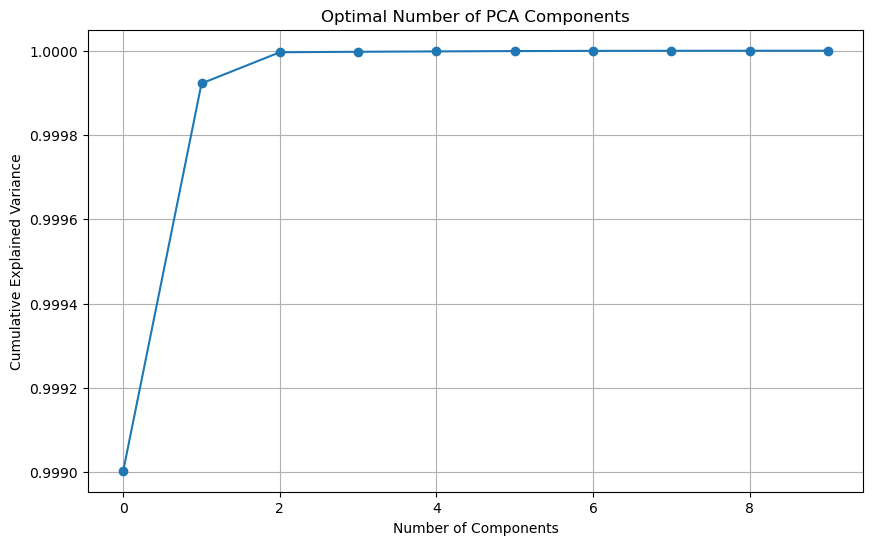

Optimal number of PCA components: 1 (explains 1.00 of variance)


In [54]:
# Determine optimal number of PCA components with 85% variance explained
optimal_components, optimal_variance = optimal_pca_components(df_k_means, variance_threshold=0.85)
print(f"Optimal number of PCA components: {optimal_components} (explains {optimal_variance:.2f} of variance)")

# Perform PCA with the optimal number of components
pca_X = PCA(n_components=optimal_components)
X = pca_X.fit_transform(df_k_means)

# Perform PCA with 2 components for visualization
pca_Y = PCA(n_components=2)
Y = pca_Y.fit_transform(df_k_means)

For n_clusters = 2, the silhouette score is 0.7408718928378305
For n_clusters = 3, the silhouette score is 0.6354498466353468
For n_clusters = 4, the silhouette score is 0.6252277890424481
For n_clusters = 5, the silhouette score is 0.5970494035371291
For n_clusters = 6, the silhouette score is 0.5695662469753154
For n_clusters = 7, the silhouette score is 0.5523640357344748
For n_clusters = 8, the silhouette score is 0.5739294063804017
For n_clusters = 9, the silhouette score is 0.5707753374215617
For n_clusters = 10, the silhouette score is 0.5612609016191654


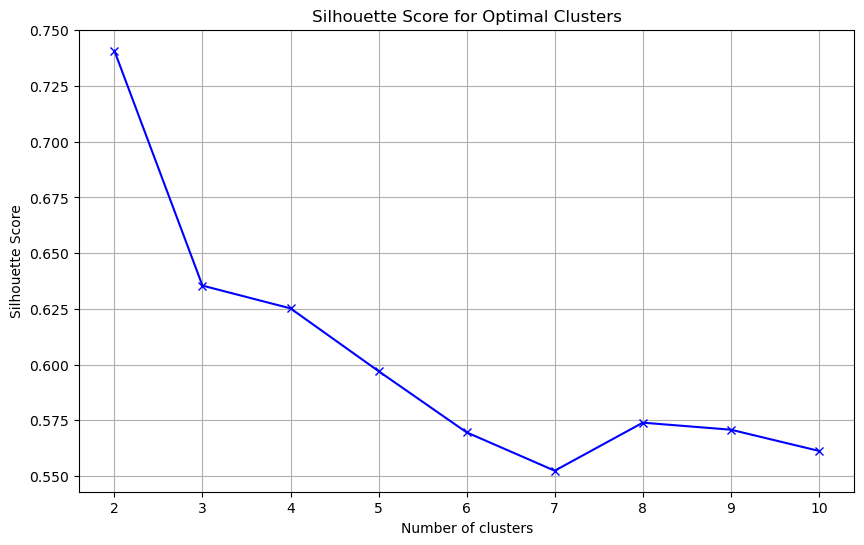

Optimal number of clusters for X based on silhouette score: 2
For n_clusters = 2, the silhouette score is 0.7385522748986248
For n_clusters = 3, the silhouette score is 0.6282777052003548
For n_clusters = 4, the silhouette score is 0.6162301654758281
For n_clusters = 5, the silhouette score is 0.5822508582688131
For n_clusters = 6, the silhouette score is 0.5495957344163606
For n_clusters = 7, the silhouette score is 0.5260458508216064
For n_clusters = 8, the silhouette score is 0.5193224151400513
For n_clusters = 9, the silhouette score is 0.5332505796135172
For n_clusters = 10, the silhouette score is 0.5181837030312804


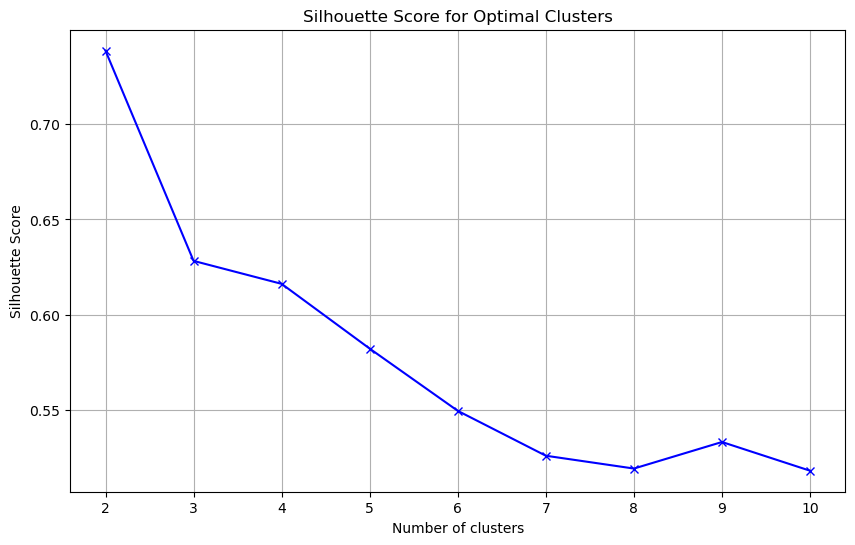

Optimal number of clusters for Y based on silhouette score: 2
Silhouette Score for X with 2 clusters: 0.7408718928378305
Silhouette Score for Y with 2 clusters: 0.7385522748986248


In [55]:
# Determine the optimal number of clusters for X
optimal_clusters_X, silhouette_scores_X = find_optimal_clusters(X, 10)
print(f"Optimal number of clusters for X based on silhouette score: {optimal_clusters_X}")

# Determine the optimal number of clusters for Y
optimal_clusters_Y, silhouette_scores_Y = find_optimal_clusters(Y, 10)
print(f"Optimal number of clusters for Y based on silhouette score: {optimal_clusters_Y}")

# Calculate the silhouette score for the optimal number of clusters for X and Y
silhouette_avg_X = silhouette_scores_X[np.argmax(silhouette_scores_X)]
silhouette_avg_Y = silhouette_scores_Y[np.argmax(silhouette_scores_Y)]

print(f"Silhouette Score for X with {optimal_clusters_X} clusters: {silhouette_avg_X}")
print(f"Silhouette Score for Y with {optimal_clusters_Y} clusters: {silhouette_avg_Y}")

In [56]:
#Checking Shilhouette Scores for df_standard
df_k_means = df_standard

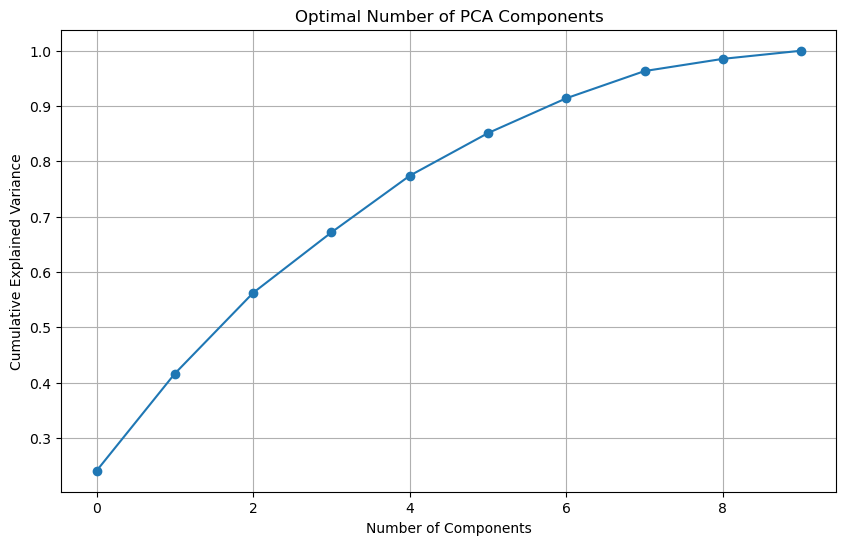

Optimal number of PCA components: 6 (explains 0.85 of variance)


In [57]:
# Determine optimal number of PCA components with 85% variance explained
optimal_components, optimal_variance = optimal_pca_components(df_k_means, variance_threshold=0.85)
print(f"Optimal number of PCA components: {optimal_components} (explains {optimal_variance:.2f} of variance)")

# Perform PCA with the optimal number of components
pca_X = PCA(n_components=optimal_components)
X = pca_X.fit_transform(df_k_means)

# Perform PCA with 2 components for visualization
pca_Y = PCA(n_components=2)
Y = pca_Y.fit_transform(df_k_means)

For n_clusters = 2, the silhouette score is 0.2197142738511574
For n_clusters = 3, the silhouette score is 0.21758170845435507
For n_clusters = 4, the silhouette score is 0.23307624698990576
For n_clusters = 5, the silhouette score is 0.2466300101690507
For n_clusters = 6, the silhouette score is 0.22481023822259144
For n_clusters = 7, the silhouette score is 0.19953202296635328
For n_clusters = 8, the silhouette score is 0.1961002972503909
For n_clusters = 9, the silhouette score is 0.2011493440002455
For n_clusters = 10, the silhouette score is 0.1863778312550948


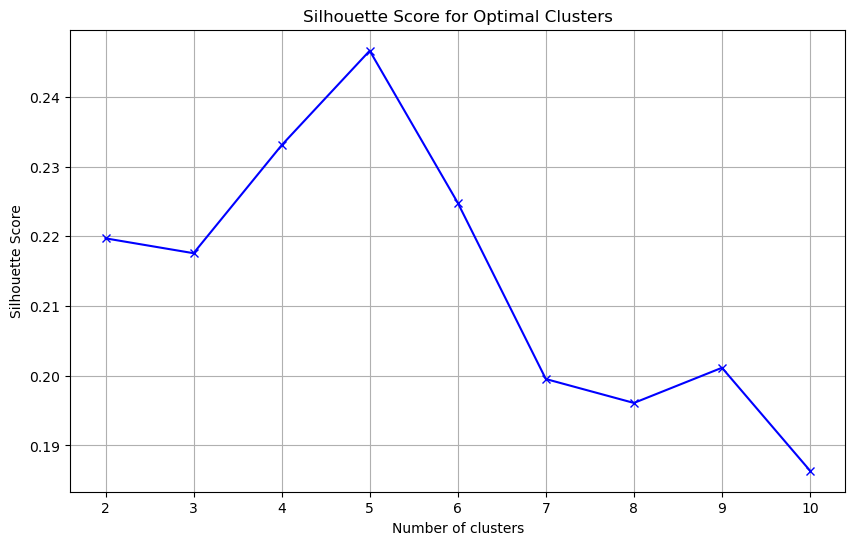

Optimal number of clusters for X based on silhouette score: 5
For n_clusters = 2, the silhouette score is 0.4345419681589494
For n_clusters = 3, the silhouette score is 0.4504075644331546
For n_clusters = 4, the silhouette score is 0.37152320363313623
For n_clusters = 5, the silhouette score is 0.4187225193486763
For n_clusters = 6, the silhouette score is 0.4015075982733986
For n_clusters = 7, the silhouette score is 0.40130779083050583
For n_clusters = 8, the silhouette score is 0.40705245531574114
For n_clusters = 9, the silhouette score is 0.40326811602884943
For n_clusters = 10, the silhouette score is 0.43706766437856853


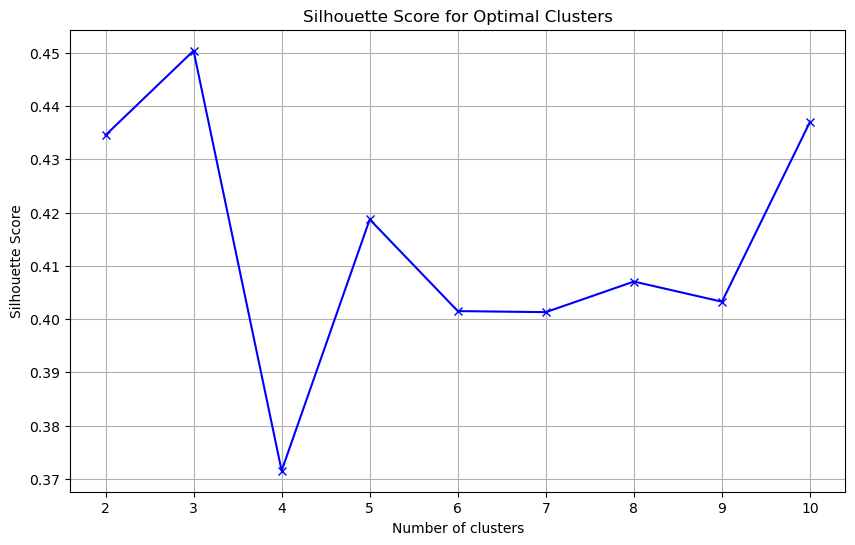

Optimal number of clusters for Y based on silhouette score: 3
Silhouette Score for X with 5 clusters: 0.2466300101690507
Silhouette Score for Y with 3 clusters: 0.4504075644331546


In [58]:
# Determine the optimal number of clusters for X
optimal_clusters_X, silhouette_scores_X = find_optimal_clusters(X, 10)
print(f"Optimal number of clusters for X based on silhouette score: {optimal_clusters_X}")

# Determine the optimal number of clusters for Y
optimal_clusters_Y, silhouette_scores_Y = find_optimal_clusters(Y, 10)
print(f"Optimal number of clusters for Y based on silhouette score: {optimal_clusters_Y}")

# Calculate the silhouette score for the optimal number of clusters for X and Y
silhouette_avg_X = silhouette_scores_X[np.argmax(silhouette_scores_X)]
silhouette_avg_Y = silhouette_scores_Y[np.argmax(silhouette_scores_Y)]

print(f"Silhouette Score for X with {optimal_clusters_X} clusters: {silhouette_avg_X}")
print(f"Silhouette Score for Y with {optimal_clusters_Y} clusters: {silhouette_avg_Y}")

In [59]:
#Checking Shilhouette Scores for df_min_max
df_k_means = df_min_max

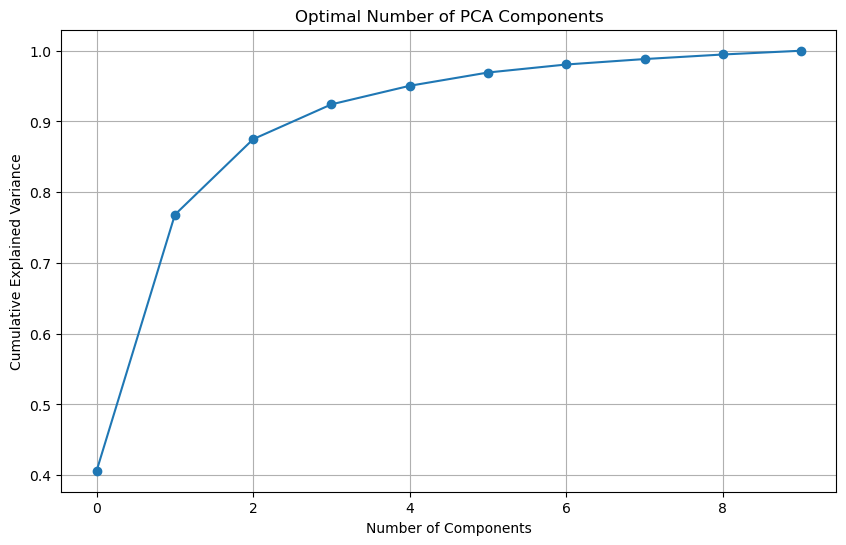

Optimal number of PCA components: 3 (explains 0.88 of variance)


In [60]:
# Determine optimal number of PCA components with 85% variance explained
optimal_components, optimal_variance = optimal_pca_components(df_k_means, variance_threshold=0.85)
print(f"Optimal number of PCA components: {optimal_components} (explains {optimal_variance:.2f} of variance)")

# Perform PCA with the optimal number of components
pca_X = PCA(n_components=optimal_components)
X = pca_X.fit_transform(df_k_means)

# Perform PCA with 2 components for visualization
pca_Y = PCA(n_components=2)
Y = pca_Y.fit_transform(df_k_means)

For n_clusters = 2, the silhouette score is 0.3038485866016568
For n_clusters = 3, the silhouette score is 0.35019358094362657
For n_clusters = 4, the silhouette score is 0.3105305307643389
For n_clusters = 5, the silhouette score is 0.2708674279684277
For n_clusters = 6, the silhouette score is 0.3166590494209406
For n_clusters = 7, the silhouette score is 0.33390707416782556
For n_clusters = 8, the silhouette score is 0.32236058707975895
For n_clusters = 9, the silhouette score is 0.3442117221368437
For n_clusters = 10, the silhouette score is 0.35591454800666433


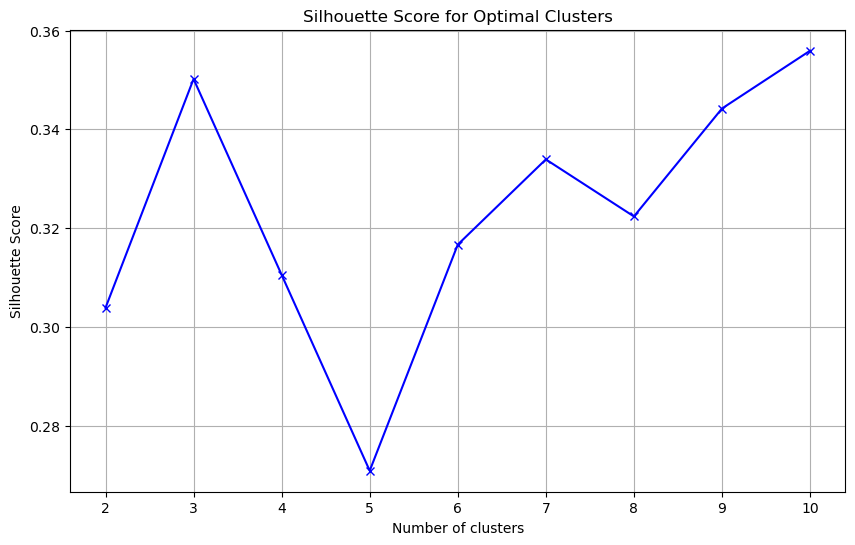

Optimal number of clusters for X based on silhouette score: 10
For n_clusters = 2, the silhouette score is 0.33979863114638476
For n_clusters = 3, the silhouette score is 0.40804511092095125
For n_clusters = 4, the silhouette score is 0.46584005902466424
For n_clusters = 5, the silhouette score is 0.45425726084331036
For n_clusters = 6, the silhouette score is 0.46223464039302875
For n_clusters = 7, the silhouette score is 0.48073281601589046
For n_clusters = 8, the silhouette score is 0.4524153998331883
For n_clusters = 9, the silhouette score is 0.47227364056228277
For n_clusters = 10, the silhouette score is 0.5115824237103889


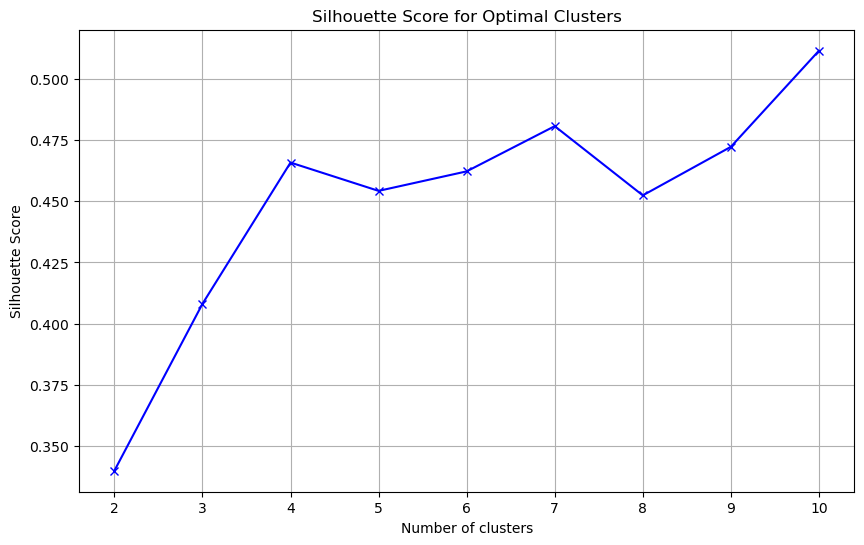

Optimal number of clusters for Y based on silhouette score: 10
Silhouette Score for X with 10 clusters: 0.35591454800666433
Silhouette Score for Y with 10 clusters: 0.5115824237103889


In [61]:
# Determine the optimal number of clusters for X
optimal_clusters_X, silhouette_scores_X = find_optimal_clusters(X, 10)
print(f"Optimal number of clusters for X based on silhouette score: {optimal_clusters_X}")

# Determine the optimal number of clusters for Y
optimal_clusters_Y, silhouette_scores_Y = find_optimal_clusters(Y, 10)
print(f"Optimal number of clusters for Y based on silhouette score: {optimal_clusters_Y}")

# Calculate the silhouette score for the optimal number of clusters for X and Y
silhouette_avg_X = silhouette_scores_X[np.argmax(silhouette_scores_X)]
silhouette_avg_Y = silhouette_scores_Y[np.argmax(silhouette_scores_Y)]

print(f"Silhouette Score for X with {optimal_clusters_X} clusters: {silhouette_avg_X}")
print(f"Silhouette Score for Y with {optimal_clusters_Y} clusters: {silhouette_avg_Y}")

In [62]:
#Checking Shilhouette Scores for df_bins_standard
df_k_means = df_bins_standard

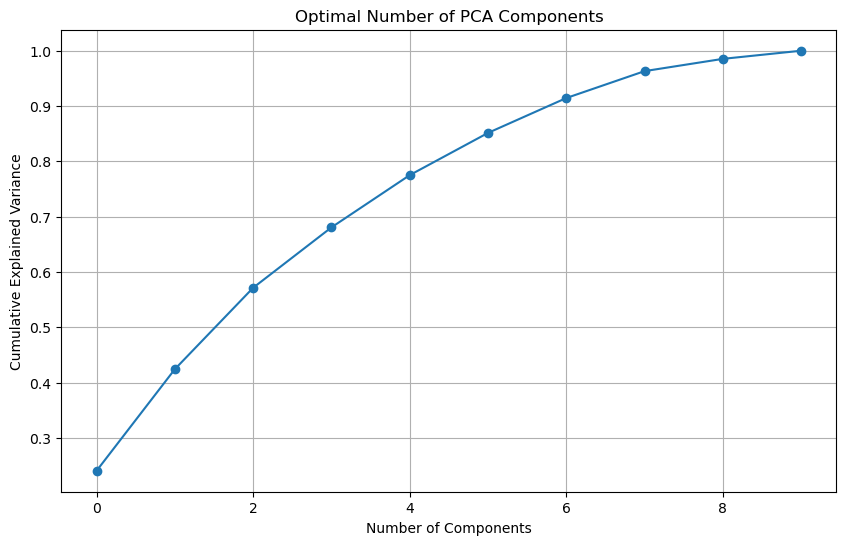

Optimal number of PCA components: 6 (explains 0.85 of variance)


In [63]:
# Determine optimal number of PCA components with 85% variance explained
optimal_components, optimal_variance = optimal_pca_components(df_k_means, variance_threshold=0.85)
print(f"Optimal number of PCA components: {optimal_components} (explains {optimal_variance:.2f} of variance)")

# Perform PCA with the optimal number of components
pca_X = PCA(n_components=optimal_components)
X = pca_X.fit_transform(df_k_means)

# Perform PCA with 2 components for visualization
pca_Y = PCA(n_components=2)
Y = pca_Y.fit_transform(df_k_means)

For n_clusters = 2, the silhouette score is 0.2125943632028026
For n_clusters = 3, the silhouette score is 0.2103046384401758
For n_clusters = 4, the silhouette score is 0.2298667023941495
For n_clusters = 5, the silhouette score is 0.17956513103905128
For n_clusters = 6, the silhouette score is 0.16137298070400347
For n_clusters = 7, the silhouette score is 0.1629244262914117
For n_clusters = 8, the silhouette score is 0.17591618876855475
For n_clusters = 9, the silhouette score is 0.18034552334664491
For n_clusters = 10, the silhouette score is 0.1792316934525964


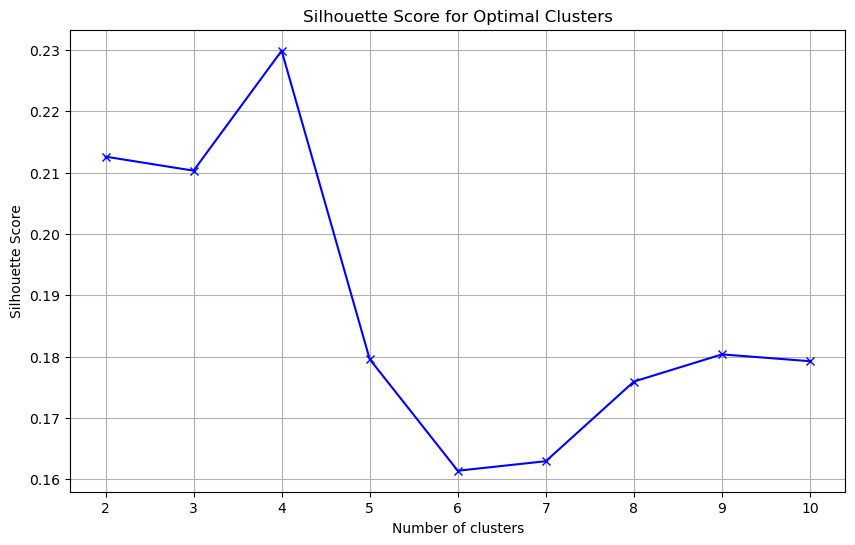

Optimal number of clusters for X based on silhouette score: 4
For n_clusters = 2, the silhouette score is 0.43224284232146754
For n_clusters = 3, the silhouette score is 0.46203330032281614
For n_clusters = 4, the silhouette score is 0.43958949118738666
For n_clusters = 5, the silhouette score is 0.4137488020385585
For n_clusters = 6, the silhouette score is 0.38794404991058973
For n_clusters = 7, the silhouette score is 0.42089107327711606
For n_clusters = 8, the silhouette score is 0.4252219158213529
For n_clusters = 9, the silhouette score is 0.4309852612468018
For n_clusters = 10, the silhouette score is 0.4343134031356241


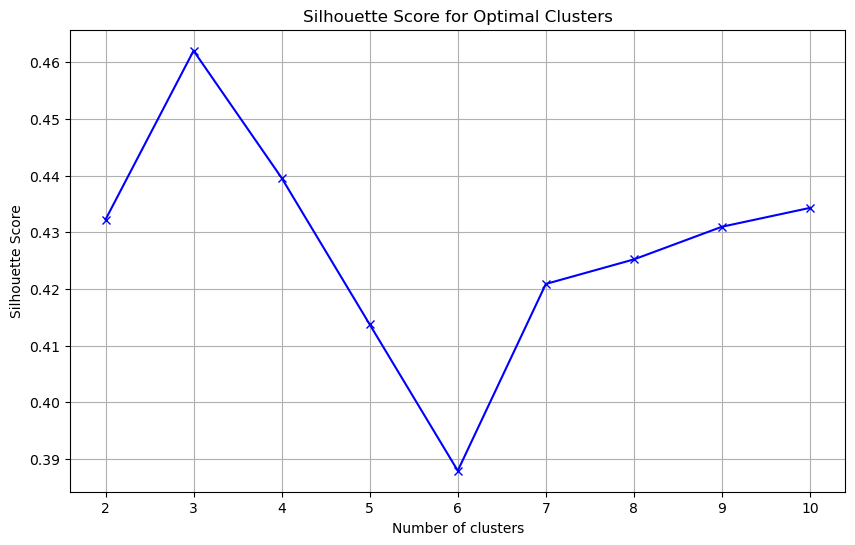

Optimal number of clusters for Y based on silhouette score: 3
Silhouette Score for X with 4 clusters: 0.2298667023941495
Silhouette Score for Y with 3 clusters: 0.46203330032281614


In [64]:
# Determine the optimal number of clusters for X
optimal_clusters_X, silhouette_scores_X = find_optimal_clusters(X, 10)
print(f"Optimal number of clusters for X based on silhouette score: {optimal_clusters_X}")

# Determine the optimal number of clusters for Y
optimal_clusters_Y, silhouette_scores_Y = find_optimal_clusters(Y, 10)
print(f"Optimal number of clusters for Y based on silhouette score: {optimal_clusters_Y}")

# Calculate the silhouette score for the optimal number of clusters for X and Y
silhouette_avg_X = silhouette_scores_X[np.argmax(silhouette_scores_X)]
silhouette_avg_Y = silhouette_scores_Y[np.argmax(silhouette_scores_Y)]

print(f"Silhouette Score for X with {optimal_clusters_X} clusters: {silhouette_avg_X}")
print(f"Silhouette Score for Y with {optimal_clusters_Y} clusters: {silhouette_avg_Y}")

In [65]:
#Checking Shilhouette Scores for df_bins_min_max
df_k_means = df_bins_min_max

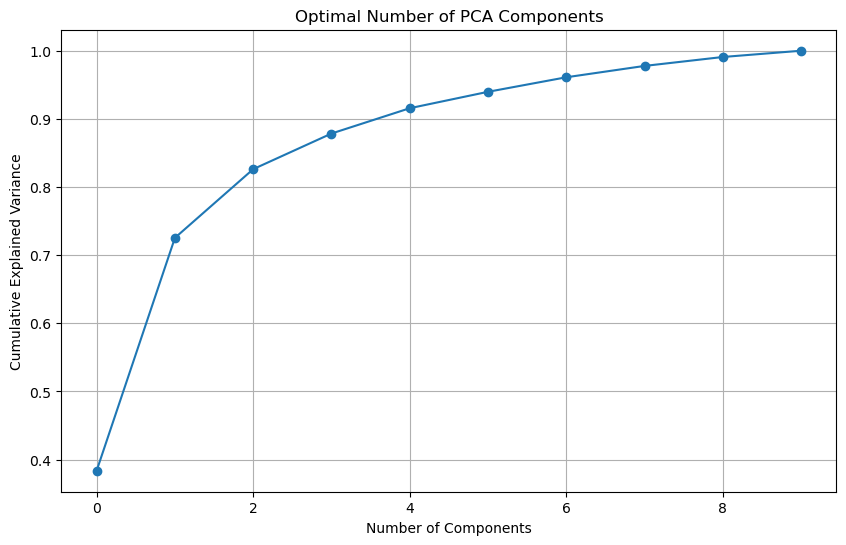

Optimal number of PCA components: 4 (explains 0.88 of variance)


In [66]:
# Determine optimal number of PCA components with 85% variance explained
optimal_components, optimal_variance = optimal_pca_components(df_k_means, variance_threshold=0.85)
print(f"Optimal number of PCA components: {optimal_components} (explains {optimal_variance:.2f} of variance)")

# Perform PCA with the optimal number of components
pca_X = PCA(n_components=optimal_components)
X = pca_X.fit_transform(df_k_means)

# Perform PCA with 2 components for visualization
pca_Y = PCA(n_components=2)
Y = pca_Y.fit_transform(df_k_means)

For n_clusters = 2, the silhouette score is 0.3217374034382992
For n_clusters = 3, the silhouette score is 0.3127561416791879
For n_clusters = 4, the silhouette score is 0.275112664389797
For n_clusters = 5, the silhouette score is 0.3021140295242633
For n_clusters = 6, the silhouette score is 0.2874268965366813
For n_clusters = 7, the silhouette score is 0.27421170637968967
For n_clusters = 8, the silhouette score is 0.2693317706985062
For n_clusters = 9, the silhouette score is 0.25965587380325716
For n_clusters = 10, the silhouette score is 0.2699230762705485


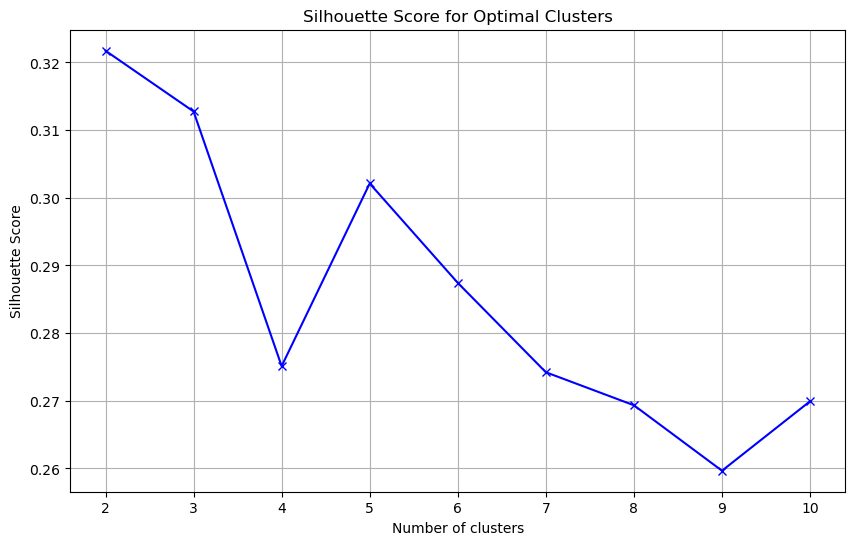

Optimal number of clusters for X based on silhouette score: 2
For n_clusters = 2, the silhouette score is 0.33978805882402296
For n_clusters = 3, the silhouette score is 0.42473857967855905
For n_clusters = 4, the silhouette score is 0.46188860539824883
For n_clusters = 5, the silhouette score is 0.4659816554996658
For n_clusters = 6, the silhouette score is 0.45694249671668874
For n_clusters = 7, the silhouette score is 0.448328279414325
For n_clusters = 8, the silhouette score is 0.48470371589983496
For n_clusters = 9, the silhouette score is 0.5147396773814155
For n_clusters = 10, the silhouette score is 0.5225004450837164


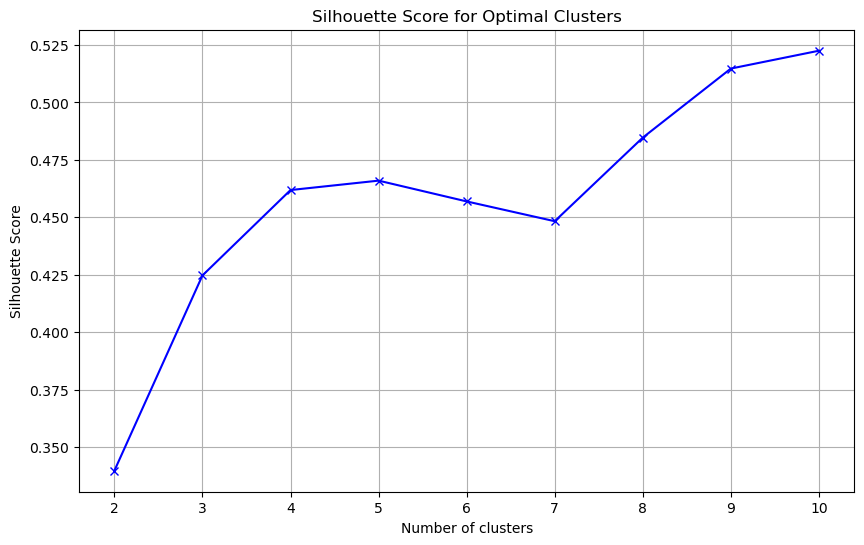

Optimal number of clusters for Y based on silhouette score: 10
Silhouette Score for X with 2 clusters: 0.3217374034382992
Silhouette Score for Y with 10 clusters: 0.5225004450837164


In [67]:
# Determine the optimal number of clusters for X
optimal_clusters_X, silhouette_scores_X = find_optimal_clusters(X, 10)
print(f"Optimal number of clusters for X based on silhouette score: {optimal_clusters_X}")

# Determine the optimal number of clusters for Y
optimal_clusters_Y, silhouette_scores_Y = find_optimal_clusters(Y, 10)
print(f"Optimal number of clusters for Y based on silhouette score: {optimal_clusters_Y}")

# Calculate the silhouette score for the optimal number of clusters for X and Y
silhouette_avg_X = silhouette_scores_X[np.argmax(silhouette_scores_X)]
silhouette_avg_Y = silhouette_scores_Y[np.argmax(silhouette_scores_Y)]

print(f"Silhouette Score for X with {optimal_clusters_X} clusters: {silhouette_avg_X}")
print(f"Silhouette Score for Y with {optimal_clusters_Y} clusters: {silhouette_avg_Y}")

In [68]:
#Checking Shilhouette Scores for df_categorical
df_k_means = df_categorical

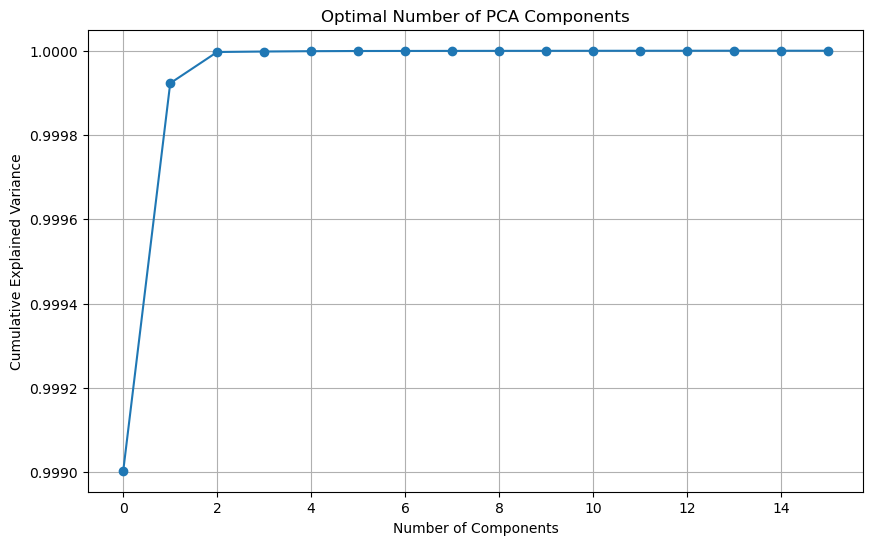

Optimal number of PCA components: 1 (explains 1.00 of variance)


In [69]:
# Determine optimal number of PCA components with 85% variance explained
optimal_components, optimal_variance = optimal_pca_components(df_k_means, variance_threshold=0.85)
print(f"Optimal number of PCA components: {optimal_components} (explains {optimal_variance:.2f} of variance)")

# Perform PCA with the optimal number of components
pca_X = PCA(n_components=optimal_components)
X = pca_X.fit_transform(df_k_means)

# Perform PCA with 2 components for visualization
pca_Y = PCA(n_components=2)
Y = pca_Y.fit_transform(df_k_means)

For n_clusters = 2, the silhouette score is 0.7408718930159796
For n_clusters = 3, the silhouette score is 0.6354498464265226
For n_clusters = 4, the silhouette score is 0.6252277889718019
For n_clusters = 5, the silhouette score is 0.5970494042816561
For n_clusters = 6, the silhouette score is 0.5695662467549334
For n_clusters = 7, the silhouette score is 0.5523640353021049
For n_clusters = 8, the silhouette score is 0.5739294065923141
For n_clusters = 9, the silhouette score is 0.5707753367662151
For n_clusters = 10, the silhouette score is 0.5612609009920468


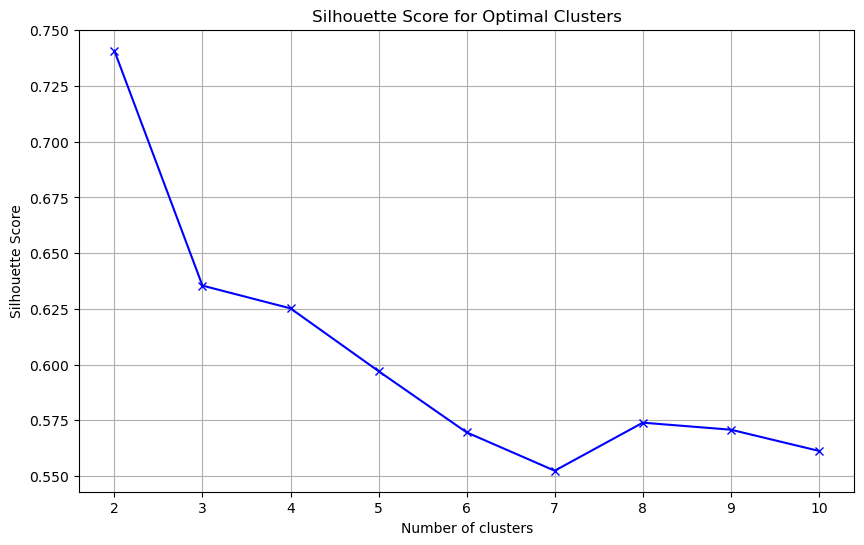

Optimal number of clusters for X based on silhouette score: 2
For n_clusters = 2, the silhouette score is 0.7385522750215572
For n_clusters = 3, the silhouette score is 0.628277704982814
For n_clusters = 4, the silhouette score is 0.6162301651466792
For n_clusters = 5, the silhouette score is 0.5822508586822139
For n_clusters = 6, the silhouette score is 0.5495957339350783
For n_clusters = 7, the silhouette score is 0.526045850908871
For n_clusters = 8, the silhouette score is 0.519322412773163
For n_clusters = 9, the silhouette score is 0.5332505779258531
For n_clusters = 10, the silhouette score is 0.5181837016253502


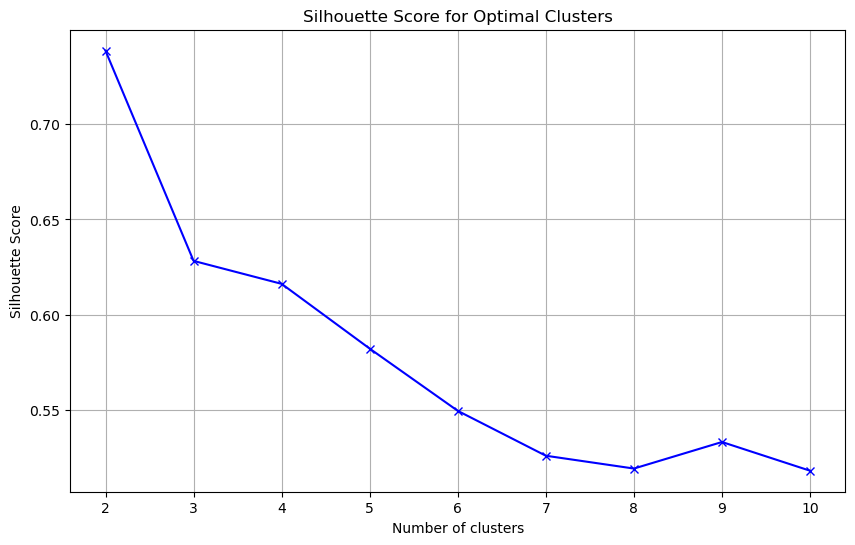

Optimal number of clusters for Y based on silhouette score: 2
Silhouette Score for X with 2 clusters: 0.7408718930159796
Silhouette Score for Y with 2 clusters: 0.7385522750215572


In [70]:
# Determine the optimal number of clusters for X
optimal_clusters_X, silhouette_scores_X = find_optimal_clusters(X, 10)
print(f"Optimal number of clusters for X based on silhouette score: {optimal_clusters_X}")

# Determine the optimal number of clusters for Y
optimal_clusters_Y, silhouette_scores_Y = find_optimal_clusters(Y, 10)
print(f"Optimal number of clusters for Y based on silhouette score: {optimal_clusters_Y}")

# Calculate the silhouette score for the optimal number of clusters for X and Y
silhouette_avg_X = silhouette_scores_X[np.argmax(silhouette_scores_X)]
silhouette_avg_Y = silhouette_scores_Y[np.argmax(silhouette_scores_Y)]

print(f"Silhouette Score for X with {optimal_clusters_X} clusters: {silhouette_avg_X}")
print(f"Silhouette Score for Y with {optimal_clusters_Y} clusters: {silhouette_avg_Y}")

In [71]:
#Checking Shilhouette Scores for df_categorical_standard
df_k_means = df_categorical_standard

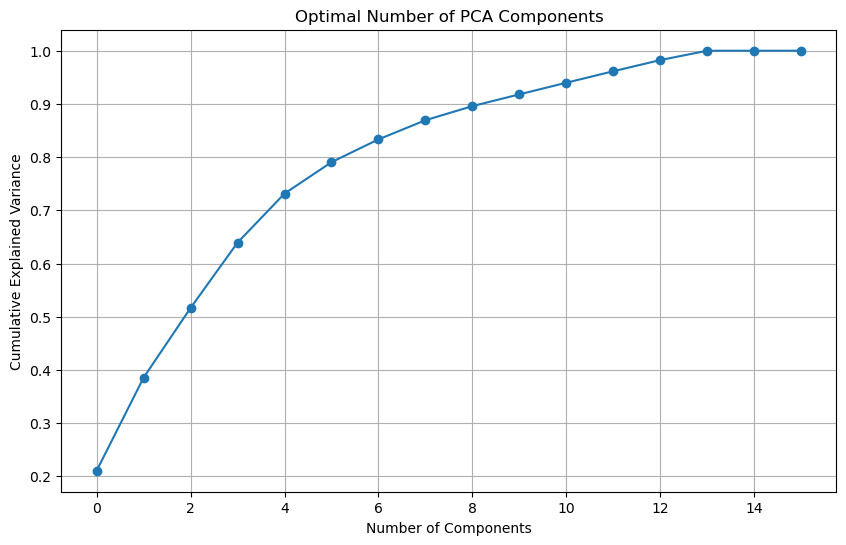

Optimal number of PCA components: 8 (explains 0.87 of variance)


In [72]:
# Determine optimal number of PCA components with 85% variance explained
optimal_components, optimal_variance = optimal_pca_components(df_k_means, variance_threshold=0.85)
print(f"Optimal number of PCA components: {optimal_components} (explains {optimal_variance:.2f} of variance)")

# Perform PCA with the optimal number of components
pca_X = PCA(n_components=optimal_components)
X = pca_X.fit_transform(df_k_means)

# Perform PCA with 2 components for visualization
pca_Y = PCA(n_components=2)
Y = pca_Y.fit_transform(df_k_means)

For n_clusters = 2, the silhouette score is 0.17752664074388871
For n_clusters = 3, the silhouette score is 0.22549486506602276
For n_clusters = 4, the silhouette score is 0.26821842930410245
For n_clusters = 5, the silhouette score is 0.20575114386037313
For n_clusters = 6, the silhouette score is 0.2017845191879833
For n_clusters = 7, the silhouette score is 0.17807471857323298
For n_clusters = 8, the silhouette score is 0.17720389617066065
For n_clusters = 9, the silhouette score is 0.17512899189023223
For n_clusters = 10, the silhouette score is 0.1705791849304025


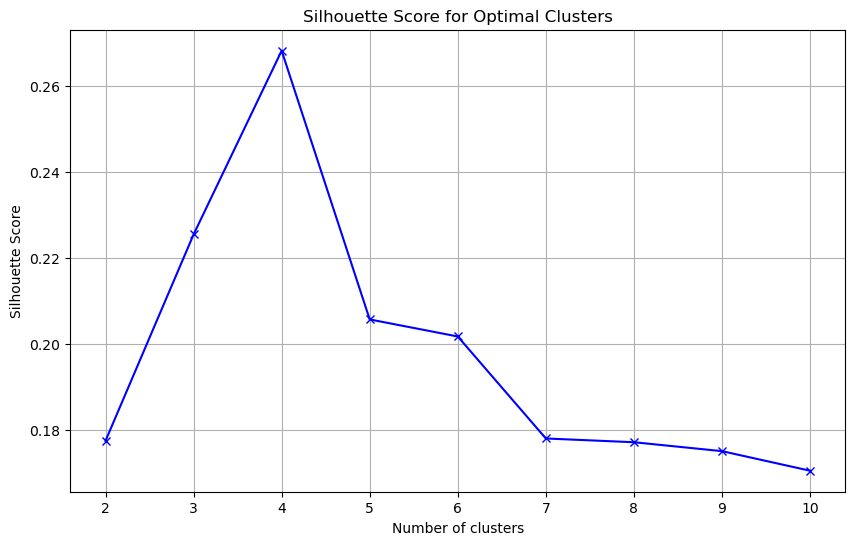

Optimal number of clusters for X based on silhouette score: 4
For n_clusters = 2, the silhouette score is 0.49169420114593565
For n_clusters = 3, the silhouette score is 0.5414756543991996
For n_clusters = 4, the silhouette score is 0.45670786501905714
For n_clusters = 5, the silhouette score is 0.4494165019469597
For n_clusters = 6, the silhouette score is 0.45072055827632007
For n_clusters = 7, the silhouette score is 0.40928778572848284
For n_clusters = 8, the silhouette score is 0.3949720898013452
For n_clusters = 9, the silhouette score is 0.3924712268682278
For n_clusters = 10, the silhouette score is 0.3684235524966011


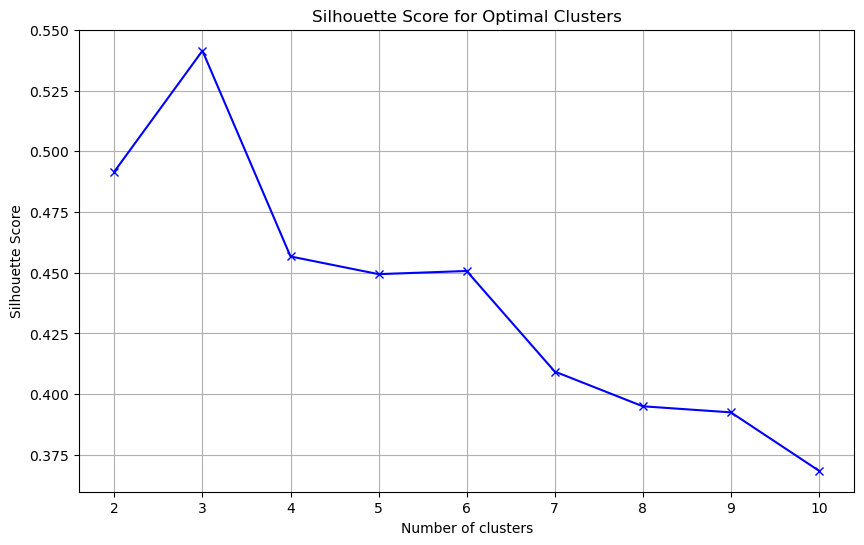

Optimal number of clusters for Y based on silhouette score: 3
Silhouette Score for X with 4 clusters: 0.26821842930410245
Silhouette Score for Y with 3 clusters: 0.5414756543991996


In [73]:
# Determine the optimal number of clusters for X
optimal_clusters_X, silhouette_scores_X = find_optimal_clusters(X, 10)
print(f"Optimal number of clusters for X based on silhouette score: {optimal_clusters_X}")

# Determine the optimal number of clusters for Y
optimal_clusters_Y, silhouette_scores_Y = find_optimal_clusters(Y, 10)
print(f"Optimal number of clusters for Y based on silhouette score: {optimal_clusters_Y}")

# Calculate the silhouette score for the optimal number of clusters for X and Y
silhouette_avg_X = silhouette_scores_X[np.argmax(silhouette_scores_X)]
silhouette_avg_Y = silhouette_scores_Y[np.argmax(silhouette_scores_Y)]

print(f"Silhouette Score for X with {optimal_clusters_X} clusters: {silhouette_avg_X}")
print(f"Silhouette Score for Y with {optimal_clusters_Y} clusters: {silhouette_avg_Y}")

In [74]:
#Checking Shilhouette Scores for df_categorical_min_max
df_k_means = df_categorical_min_max

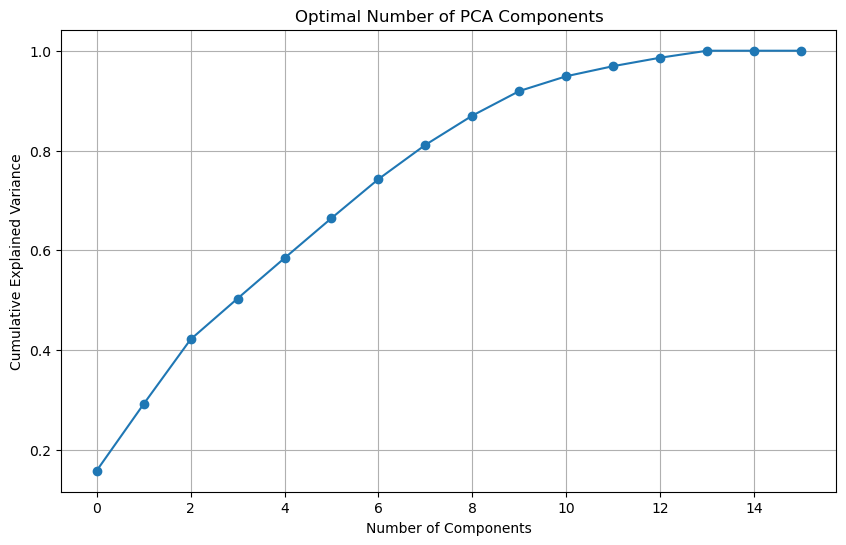

Optimal number of PCA components: 9 (explains 0.87 of variance)


In [75]:
# Determine optimal number of PCA components with 85% variance explained
optimal_components, optimal_variance = optimal_pca_components(df_k_means, variance_threshold=0.85)
print(f"Optimal number of PCA components: {optimal_components} (explains {optimal_variance:.2f} of variance)")

# Perform PCA with the optimal number of components
pca_X = PCA(n_components=optimal_components)
X = pca_X.fit_transform(df_k_means)

# Perform PCA with 2 components for visualization
pca_Y = PCA(n_components=2)
Y = pca_Y.fit_transform(df_k_means)

For n_clusters = 2, the silhouette score is 0.22580299509106525
For n_clusters = 3, the silhouette score is 0.15512687080431703
For n_clusters = 4, the silhouette score is 0.23351522723984075
For n_clusters = 5, the silhouette score is 0.27246142479828517
For n_clusters = 6, the silhouette score is 0.31135586210978644
For n_clusters = 7, the silhouette score is 0.3435338366610003
For n_clusters = 8, the silhouette score is 0.32017793832388086
For n_clusters = 9, the silhouette score is 0.31645663301081894
For n_clusters = 10, the silhouette score is 0.3461314122425567


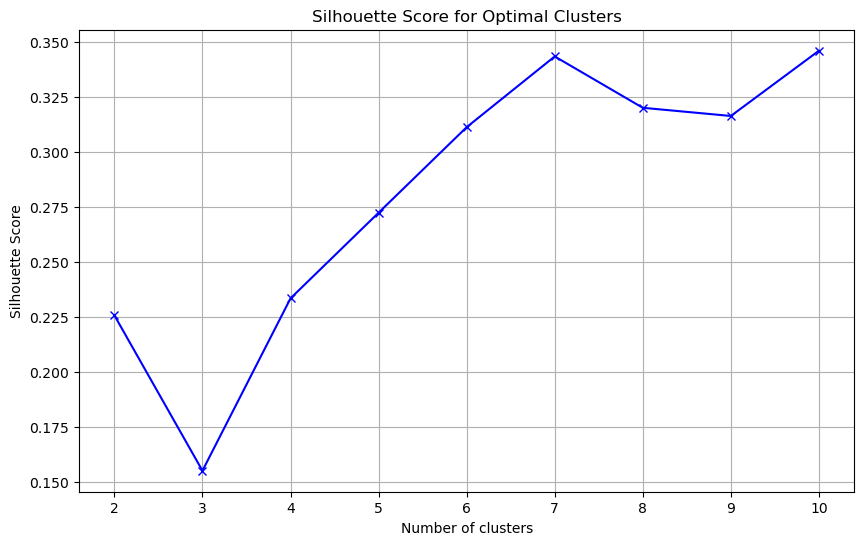

Optimal number of clusters for X based on silhouette score: 10
For n_clusters = 2, the silhouette score is 0.6394802980590434
For n_clusters = 3, the silhouette score is 0.7003387113251572
For n_clusters = 4, the silhouette score is 0.9624552222964524
For n_clusters = 5, the silhouette score is 0.8063278915519442
For n_clusters = 6, the silhouette score is 0.7544797956116907
For n_clusters = 7, the silhouette score is 0.6514556822837748
For n_clusters = 8, the silhouette score is 0.6086832529856303
For n_clusters = 9, the silhouette score is 0.60988900885033
For n_clusters = 10, the silhouette score is 0.6031454433234335


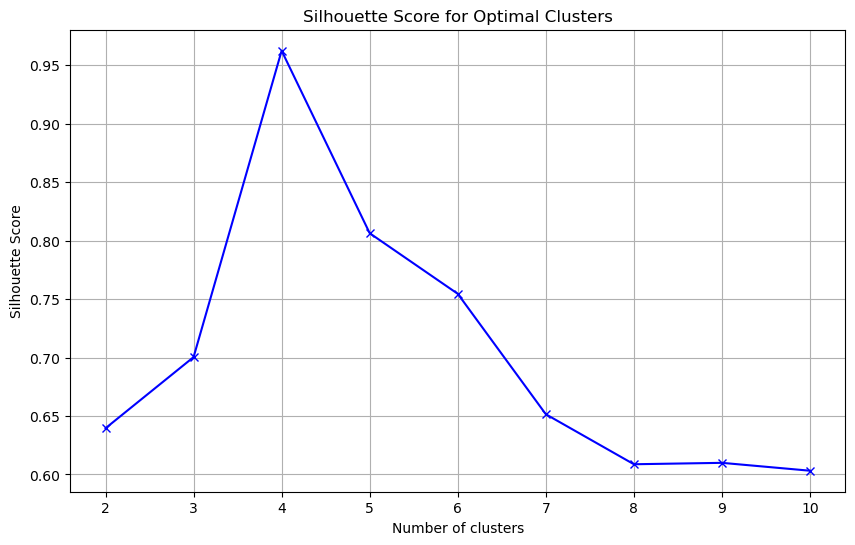

Optimal number of clusters for Y based on silhouette score: 4
Silhouette Score for X with 10 clusters: 0.3461314122425567
Silhouette Score for Y with 4 clusters: 0.9624552222964524


In [76]:
# Determine the optimal number of clusters for X
optimal_clusters_X, silhouette_scores_X = find_optimal_clusters(X, 10)
print(f"Optimal number of clusters for X based on silhouette score: {optimal_clusters_X}")

# Determine the optimal number of clusters for Y
optimal_clusters_Y, silhouette_scores_Y = find_optimal_clusters(Y, 10)
print(f"Optimal number of clusters for Y based on silhouette score: {optimal_clusters_Y}")

# Calculate the silhouette score for the optimal number of clusters for X and Y
silhouette_avg_X = silhouette_scores_X[np.argmax(silhouette_scores_X)]
silhouette_avg_Y = silhouette_scores_Y[np.argmax(silhouette_scores_Y)]

print(f"Silhouette Score for X with {optimal_clusters_X} clusters: {silhouette_avg_X}")
print(f"Silhouette Score for Y with {optimal_clusters_Y} clusters: {silhouette_avg_Y}")

In [77]:
#Checking Shilhouette Scores for df_categorical_bins_standard
df_k_means = df_categorical_bins_standard

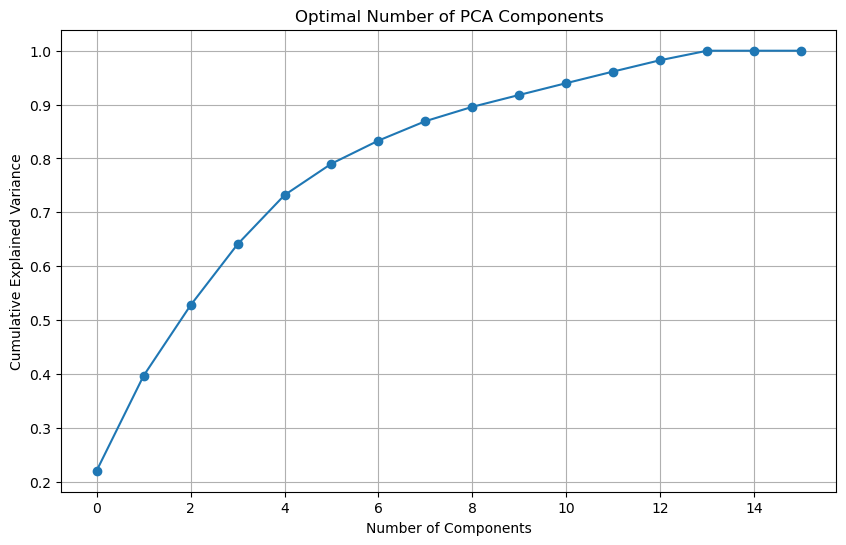

Optimal number of PCA components: 8 (explains 0.87 of variance)


In [78]:
# Determine optimal number of PCA components with 85% variance explained
optimal_components, optimal_variance = optimal_pca_components(df_k_means, variance_threshold=0.85)
print(f"Optimal number of PCA components: {optimal_components} (explains {optimal_variance:.2f} of variance)")

# Perform PCA with the optimal number of components
pca_X = PCA(n_components=optimal_components)
X = pca_X.fit_transform(df_k_means)

# Perform PCA with 2 components for visualization
pca_Y = PCA(n_components=2)
Y = pca_Y.fit_transform(df_k_means)

For n_clusters = 2, the silhouette score is 0.232198156764888
For n_clusters = 3, the silhouette score is 0.13147558976245874
For n_clusters = 4, the silhouette score is 0.13309037733157372
For n_clusters = 5, the silhouette score is 0.18657516588493486
For n_clusters = 6, the silhouette score is 0.1852634588967687
For n_clusters = 7, the silhouette score is 0.17695206360912616
For n_clusters = 8, the silhouette score is 0.1535057188901054
For n_clusters = 9, the silhouette score is 0.15199777202752907
For n_clusters = 10, the silhouette score is 0.1533062506842028


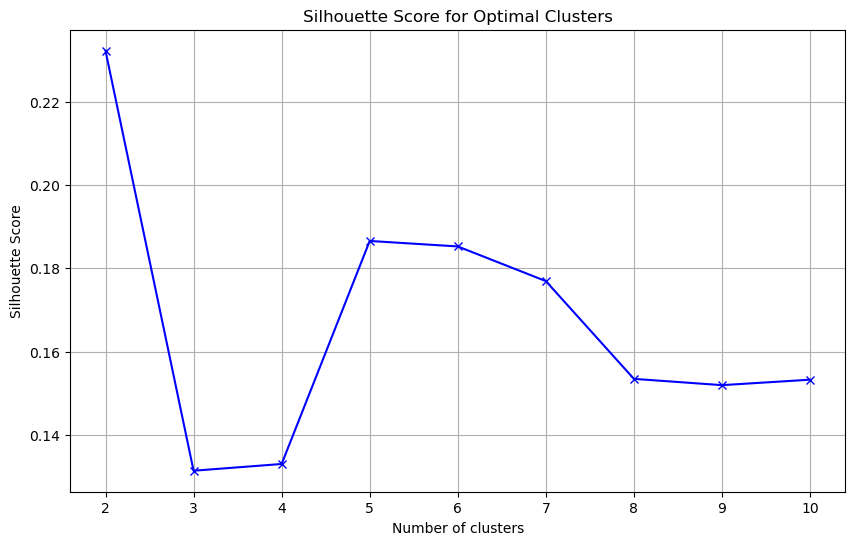

Optimal number of clusters for X based on silhouette score: 2
For n_clusters = 2, the silhouette score is 0.47808601305827614
For n_clusters = 3, the silhouette score is 0.5315122965421469
For n_clusters = 4, the silhouette score is 0.4590387358908076
For n_clusters = 5, the silhouette score is 0.4338468911007544
For n_clusters = 6, the silhouette score is 0.44089093163396026
For n_clusters = 7, the silhouette score is 0.39894330807415546
For n_clusters = 8, the silhouette score is 0.3704901522063035
For n_clusters = 9, the silhouette score is 0.35660477566360405
For n_clusters = 10, the silhouette score is 0.3919472065582385


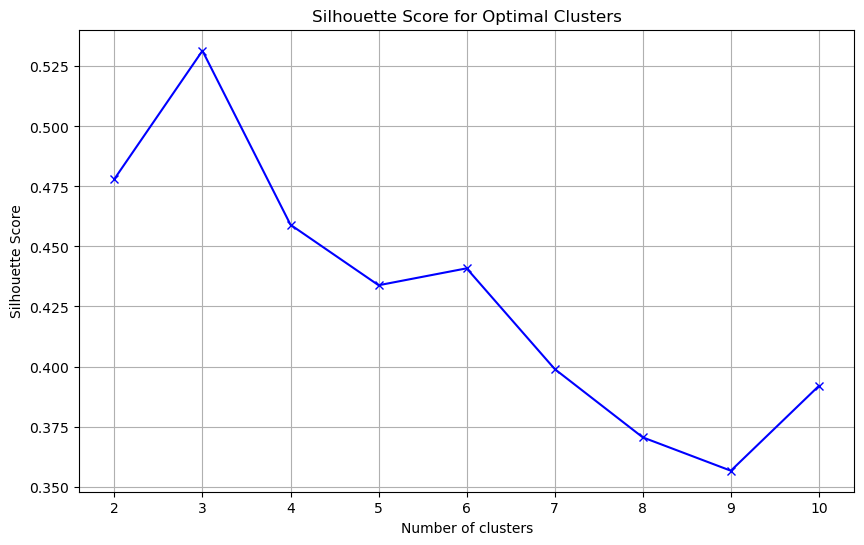

Optimal number of clusters for Y based on silhouette score: 3
Silhouette Score for X with 2 clusters: 0.232198156764888
Silhouette Score for Y with 3 clusters: 0.5315122965421469


In [79]:
# Determine the optimal number of clusters for X
optimal_clusters_X, silhouette_scores_X = find_optimal_clusters(X, 10)
print(f"Optimal number of clusters for X based on silhouette score: {optimal_clusters_X}")

# Determine the optimal number of clusters for Y
optimal_clusters_Y, silhouette_scores_Y = find_optimal_clusters(Y, 10)
print(f"Optimal number of clusters for Y based on silhouette score: {optimal_clusters_Y}")

# Calculate the silhouette score for the optimal number of clusters for X and Y
silhouette_avg_X = silhouette_scores_X[np.argmax(silhouette_scores_X)]
silhouette_avg_Y = silhouette_scores_Y[np.argmax(silhouette_scores_Y)]

print(f"Silhouette Score for X with {optimal_clusters_X} clusters: {silhouette_avg_X}")
print(f"Silhouette Score for Y with {optimal_clusters_Y} clusters: {silhouette_avg_Y}")

In [80]:
#Checking Shilhouette Scores for df_categorical_bins_min_max
df_k_means = df_categorical_bins_min_max

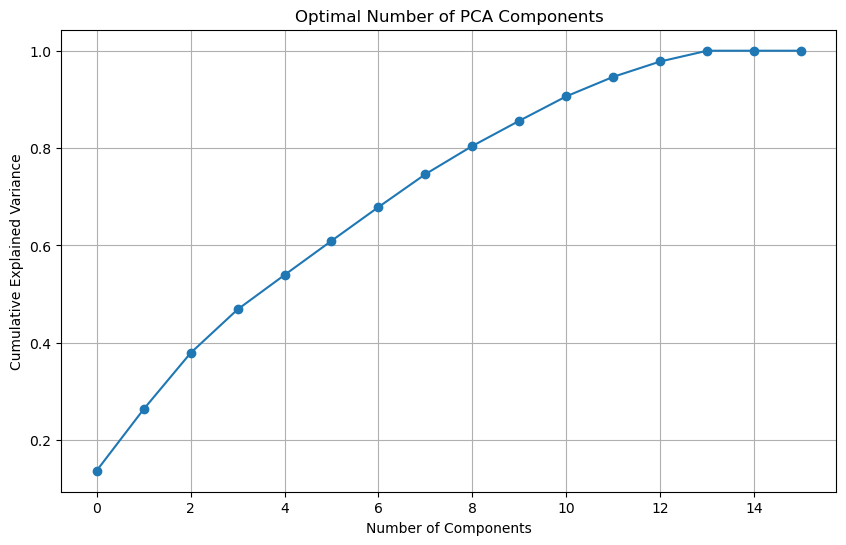

Optimal number of PCA components: 10 (explains 0.86 of variance)


In [81]:
# Determine optimal number of PCA components with 85% variance explained
optimal_components, optimal_variance = optimal_pca_components(df_k_means, variance_threshold=0.85)
print(f"Optimal number of PCA components: {optimal_components} (explains {optimal_variance:.2f} of variance)")

# Perform PCA with the optimal number of components
pca_X = PCA(n_components=optimal_components)
X = pca_X.fit_transform(df_k_means)

# Perform PCA with 2 components for visualization
pca_Y = PCA(n_components=2)
Y = pca_Y.fit_transform(df_k_means)

For n_clusters = 2, the silhouette score is 0.13668644041236724
For n_clusters = 3, the silhouette score is 0.23467766700488527
For n_clusters = 4, the silhouette score is 0.18193443147553892
For n_clusters = 5, the silhouette score is 0.16940051976481824
For n_clusters = 6, the silhouette score is 0.2117104066292405
For n_clusters = 7, the silhouette score is 0.22046012012185034
For n_clusters = 8, the silhouette score is 0.21476260255940388
For n_clusters = 9, the silhouette score is 0.2539272367950763
For n_clusters = 10, the silhouette score is 0.24444963640914236


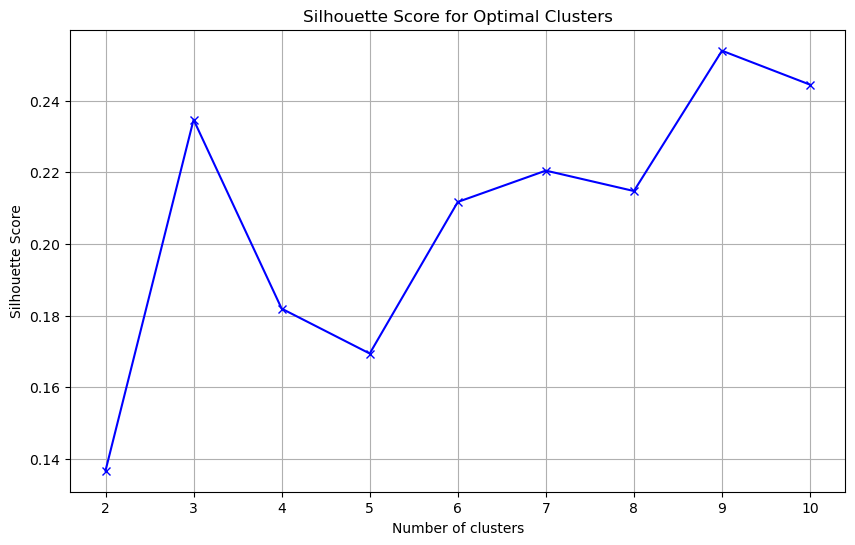

Optimal number of clusters for X based on silhouette score: 9
For n_clusters = 2, the silhouette score is 0.5636509876543068
For n_clusters = 3, the silhouette score is 0.6424987055624436
For n_clusters = 4, the silhouette score is 0.69851004546257
For n_clusters = 5, the silhouette score is 0.7507593142641674
For n_clusters = 6, the silhouette score is 0.7788792292736217
For n_clusters = 7, the silhouette score is 0.7168880972458656
For n_clusters = 8, the silhouette score is 0.627438388003851
For n_clusters = 9, the silhouette score is 0.5965285005870934
For n_clusters = 10, the silhouette score is 0.5637472148238496


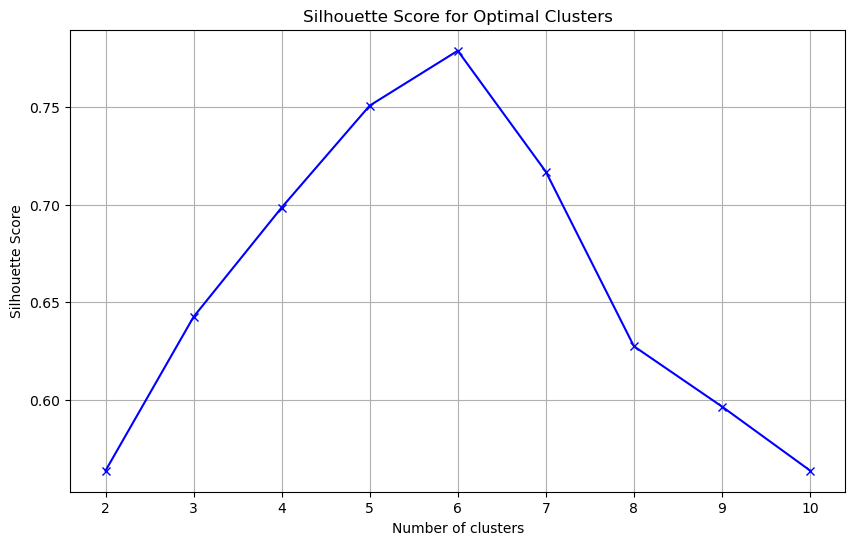

Optimal number of clusters for Y based on silhouette score: 6
Silhouette Score for X with 9 clusters: 0.2539272367950763
Silhouette Score for Y with 6 clusters: 0.7788792292736217


In [82]:
# Determine the optimal number of clusters for X
optimal_clusters_X, silhouette_scores_X = find_optimal_clusters(X, 10)
print(f"Optimal number of clusters for X based on silhouette score: {optimal_clusters_X}")

# Determine the optimal number of clusters for Y
optimal_clusters_Y, silhouette_scores_Y = find_optimal_clusters(Y, 10)
print(f"Optimal number of clusters for Y based on silhouette score: {optimal_clusters_Y}")

# Calculate the silhouette score for the optimal number of clusters for X and Y
silhouette_avg_X = silhouette_scores_X[np.argmax(silhouette_scores_X)]
silhouette_avg_Y = silhouette_scores_Y[np.argmax(silhouette_scores_Y)]

print(f"Silhouette Score for X with {optimal_clusters_X} clusters: {silhouette_avg_X}")
print(f"Silhouette Score for Y with {optimal_clusters_Y} clusters: {silhouette_avg_Y}")

In [83]:
# Silhouette scores for all dfs
"""
df_clean:
Silhouette Score for X with 2 clusters: 0.7409853786112788
Silhouette Score for Y with 2 clusters: 0.7386660158436195

df_standard:
Silhouette Score for X with 5 clusters: 0.24668390128111817
Silhouette Score for Y with 3 clusters: 0.45034728498468213

df_min_max:
Silhouette Score for X with 10 clusters: 0.3698600208043536
Silhouette Score for Y with 10 clusters: 0.5257632016105632

df_bins_standard:
Silhouette Score for X with 4 clusters: 0.22963715399236356
Silhouette Score for Y with 3 clusters: 0.461928308121833

df_bins_min_max:
Silhouette Score for X with 4 clusters: 0.3238081040536204
Silhouette Score for Y with 9 clusters: 0.5213262655469368

df_categorical:
Silhouette Score for X with 2 clusters: 0.7409853787684518
Silhouette Score for Y with 2 clusters: 0.7386660159456899

df_categorical_standard:
Silhouette Score for X with 4 clusters: 0.2679242643462191
Silhouette Score for Y with 3 clusters: 0.5436192244939131

df_categorical_min_max:
Silhouette Score for X with 10 clusters: 0.34618137903206175
Silhouette Score for Y with 4 clusters: 0.9624549204800664

df_categorical_bins_standard:
Silhouette Score for X with 3 clusters: 0.2463314743865261
Silhouette Score for Y with 3 clusters: 0.5314764015118163

df_categorical_bins_mix_max:
Silhouette Score for X with 7 clusters: 0.2801340024630042
Silhouette Score for Y with 6 clusters: 0.7793581435164751

"""

'\ndf_clean:\nSilhouette Score for X with 2 clusters: 0.7409853786112788\nSilhouette Score for Y with 2 clusters: 0.7386660158436195\n\ndf_standard:\nSilhouette Score for X with 5 clusters: 0.24668390128111817\nSilhouette Score for Y with 3 clusters: 0.45034728498468213\n\ndf_min_max:\nSilhouette Score for X with 10 clusters: 0.3698600208043536\nSilhouette Score for Y with 10 clusters: 0.5257632016105632\n\ndf_bins_standard:\nSilhouette Score for X with 4 clusters: 0.22963715399236356\nSilhouette Score for Y with 3 clusters: 0.461928308121833\n\ndf_bins_min_max:\nSilhouette Score for X with 4 clusters: 0.3238081040536204\nSilhouette Score for Y with 9 clusters: 0.5213262655469368\n\ndf_categorical:\nSilhouette Score for X with 2 clusters: 0.7409853787684518\nSilhouette Score for Y with 2 clusters: 0.7386660159456899\n\ndf_categorical_standard:\nSilhouette Score for X with 4 clusters: 0.2679242643462191\nSilhouette Score for Y with 3 clusters: 0.5436192244939131\n\ndf_categorical_min_ma

In [84]:
# We can see that the df_categorical_min_max DataFrame performed the best among all DataFrames, as indicated by the highest Silhouette Scores for both PCA analyses.
# Since it doesn't make sense to use unscaled DataFrames, they will be neglected.
# Generally, it can be said that the MinMaxScaler outperforms the StandardScaler.
# Additionally, the categorical DataFrames also performed the best.
# Therefore, we have decided to conduct a detailed analysis for both the Standard and MinMax scaled df_categorical DataFrames

In [85]:
#Cluster analysis with df_categorical_standard
df_k_means = df_categorical_standard

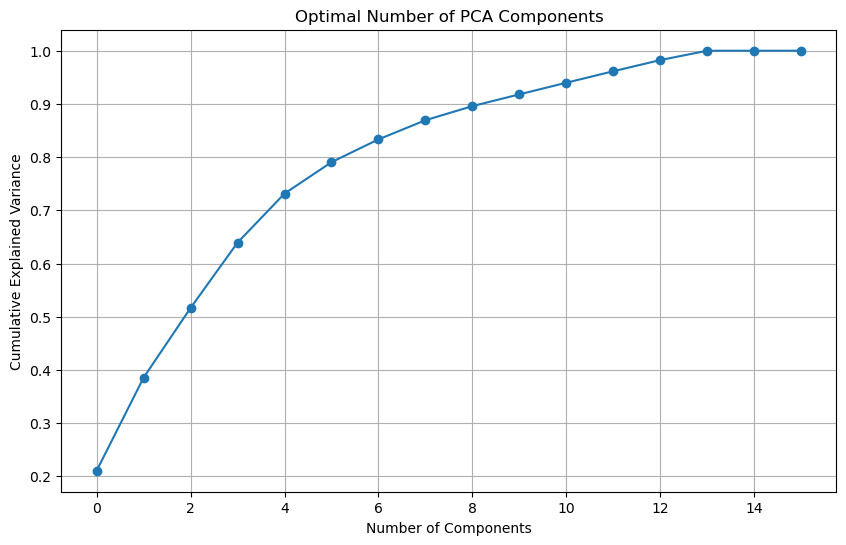

Optimal number of PCA components: 8 (explains 0.87 of variance)
PCA-transformed DataFrame for X:
        PC1       PC2       PC3       PC4       PC5       PC6       PC7  \
0 -0.874511  0.067204 -0.949504 -1.287549  0.163067  0.815318 -0.827778   
1 -2.084944  0.727045 -0.645426  1.014198 -1.673482 -0.091302 -0.823015   
2 -1.278689  2.176577 -1.485971 -0.227786  0.812264  1.232294 -0.860226   
3 -0.334003  2.934518  0.221820  1.744269 -0.495207 -0.160293 -0.821638   
4 -1.085570  1.396065 -0.091307 -0.362064 -0.313921  1.369719 -0.783510   

        PC8  
0 -0.378279  
1 -0.348931  
2 -0.409385  
3  0.803452  
4  0.696689  
PCA-transformed DataFrame for Y:
        PC1       PC2
0 -0.874511  0.067204
1 -2.084944  0.727045
2 -1.278689  2.176577
3 -0.334003  2.934518
4 -1.085570  1.396065


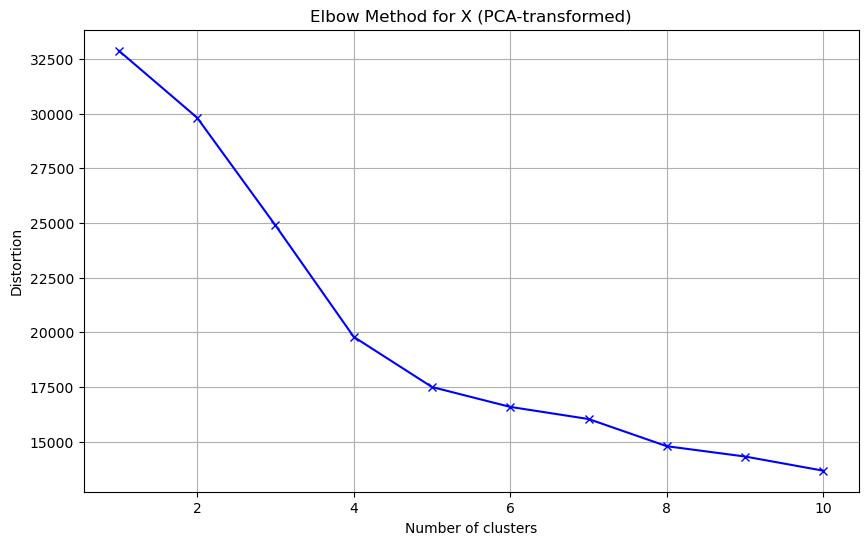

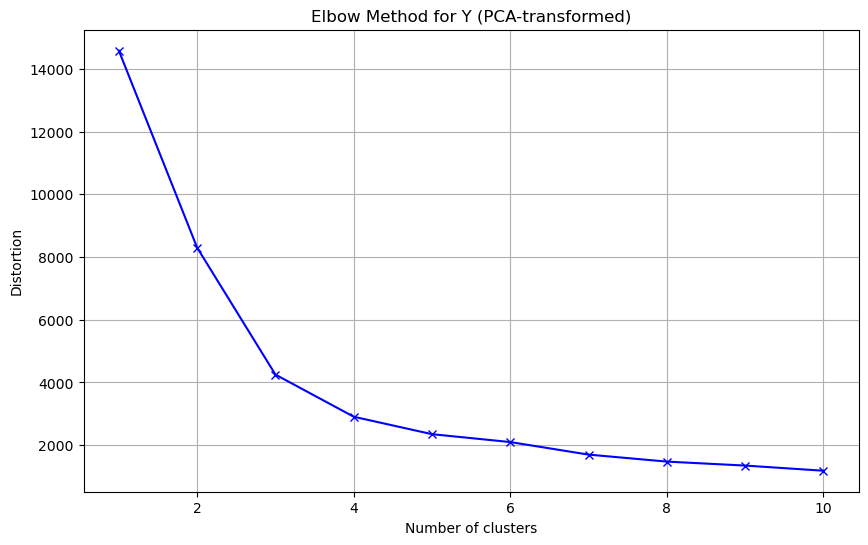

In [86]:
# Determine optimal number of PCA components with 85% variance explained
optimal_components, optimal_variance = optimal_pca_components(df_k_means, variance_threshold=0.85)
print(f"Optimal number of PCA components: {optimal_components} (explains {optimal_variance:.2f} of variance)")

# Perform PCA with the optimal number of components
pca_X = PCA(n_components=optimal_components)
X = pca_X.fit_transform(df_k_means)

# Convert PCA-transformed X to DataFrame and display
df_X_pca = pd.DataFrame(X, columns=[f'PC{i+1}' for i in range(optimal_components)])
print("PCA-transformed DataFrame for X:")
print(df_X_pca.head())

# Perform PCA with 2 components for visualization
pca_Y = PCA(n_components=2)
Y = pca_Y.fit_transform(df_k_means)

# Convert PCA-transformed Y to DataFrame and display
df_Y_pca = pd.DataFrame(Y, columns=['PC1', 'PC2'])
print("PCA-transformed DataFrame for Y:")
print(df_Y_pca.head())

# Function to plot the elbow method for determining the optimal number of clusters
def plot_elbow_method(data, title):
    distortions = []
    K = range(1, 11)
    for k in K:
        kmeanModel = KMeans(n_clusters=k, random_state=42)
        kmeanModel.fit(data)
        distortions.append(kmeanModel.inertia_)

    plt.figure(figsize=(10, 6))
    plt.plot(K, distortions, 'bx-')
    plt.xlabel('Number of clusters')
    plt.ylabel('Distortion')
    plt.title(title)
    plt.grid(True)
    plt.show()

# Plot the elbow method for X and Y
plot_elbow_method(X, 'Elbow Method for X (PCA-transformed)')
plot_elbow_method(Y, 'Elbow Method for Y (PCA-transformed)')

In [87]:
# From the elbow plot for X, it is not possible to determine a definitively clear number of clusters; one might most likely assume 5.
# However, we have chosen 4 clusters for X as this showed the best Silhouette Score in the previous analysis.
# The optimal number of clusters for Y, based on both the elbow method and the Silhouette Score, is 3, which is why we have selected this number.

Manual optimal number of clusters for X: 4
Manual optimal number of clusters for Y: 3
Silhouette Score for X: 0.26821842930410245
Silhouette Score for Y: 0.5414756543991996


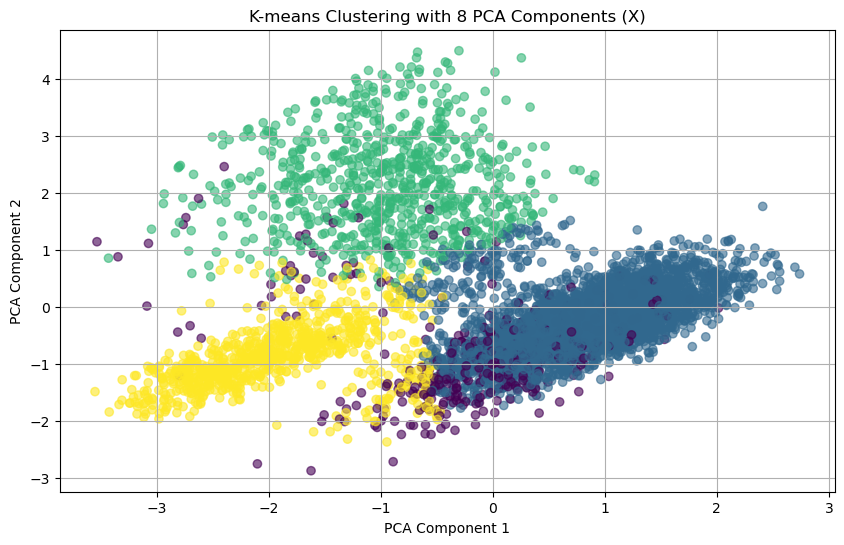

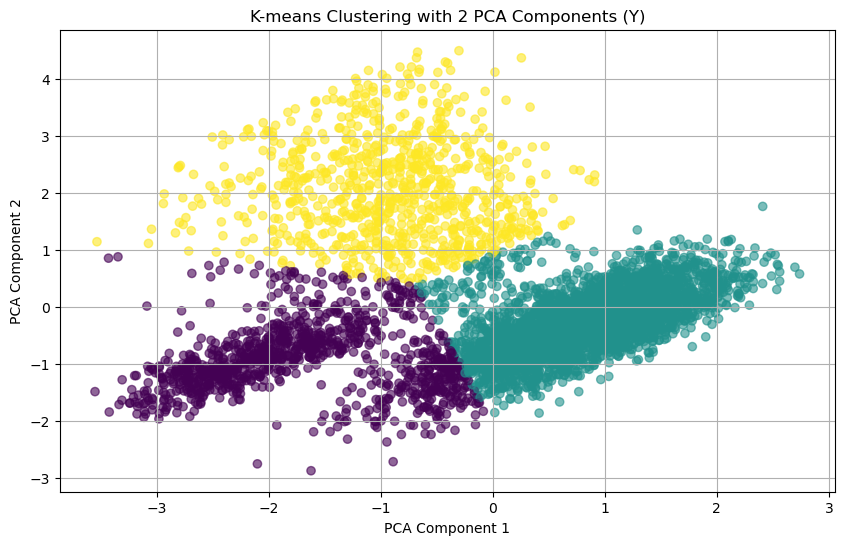

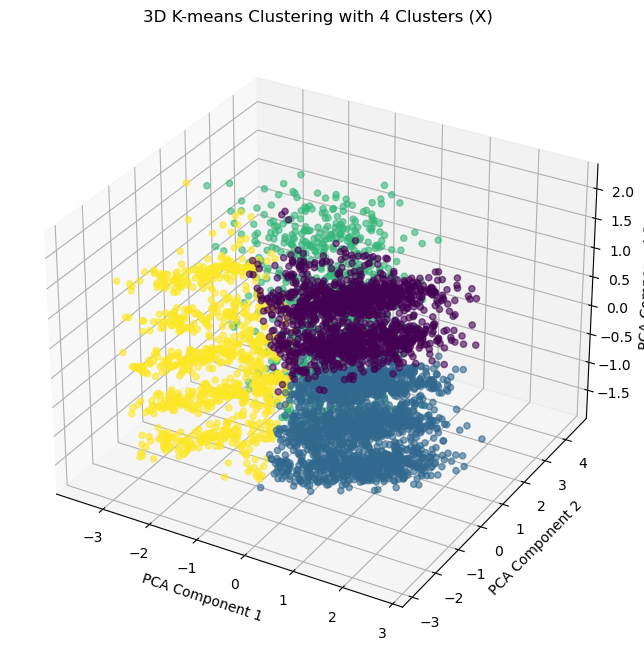

In [88]:
# Manual optimal number of clusters for X and Y
manual_optimal_clusters_X = 4
manual_optimal_clusters_Y = 3

print(f"Manual optimal number of clusters for X: {manual_optimal_clusters_X}")
print(f"Manual optimal number of clusters for Y: {manual_optimal_clusters_Y}")

# Perform k-means clustering with the optimal number of clusters
kmeans_X = KMeans(n_clusters=manual_optimal_clusters_X, random_state=42)
clusters_X = kmeans_X.fit_predict(X)
centers_X = kmeans_X.cluster_centers_

kmeans_Y = KMeans(n_clusters=manual_optimal_clusters_Y, random_state=42)
clusters_Y = kmeans_Y.fit_predict(Y)
centers_Y = kmeans_Y.cluster_centers_

# Calculate and print silhouette scores
silhouette_avg_X = silhouette_score(X, clusters_X)
silhouette_avg_Y = silhouette_score(Y, clusters_Y)
print(f'Silhouette Score for X: {silhouette_avg_X}')
print(f'Silhouette Score for Y: {silhouette_avg_Y}')

# We have visualized the clusters using both a higher number of PCA components and in 2D and 3D scatter plots 
# to provide a broad overview of the data.
# These visualizations are essential as they help us understand the clustering structure and the distribution 
# of data points within each cluster.
# By reducing the dimensions to 2D and 3D, we can plot the data points and visually inspect the separation 
# and cohesion of clusters. 
# However, it is important to note that while these plots provide valuable insights, they do not capture 
# the full complexity of the data.
# This is because PCA compresses the information from all original dimensions into the selected principal components, 
# and not all variance and relationships in the data are visible in these reduced dimensions.
# Therefore, while 2D and 3D visualizations are helpful for initial exploration and understanding, 
# they might not fully represent the clustering in the higher-dimensional space where the data originally resides.


# Visualize the clusters for X using the first two PCA components
plt.figure(figsize=(10, 6))
plt.scatter(X[:, 0], X[:, 1], c=clusters_X, cmap='viridis', alpha=0.6)
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.title(f'K-means Clustering with {optimal_components} PCA Components (X)')
plt.grid(True)
plt.show()

# Visualize the clusters for Y (2D)
plt.figure(figsize=(10, 6))
plt.scatter(Y[:, 0], Y[:, 1], c=clusters_Y, cmap='viridis', alpha=0.6)
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.title('K-means Clustering with 2 PCA Components (Y)')
plt.grid(True)
plt.show()

# Perform PCA with 3 components for 3D visualization
pca_3d = PCA(n_components=3)
X_3d = pca_3d.fit_transform(df_k_means)

# Perform k-means clustering with the optimal number of clusters
kmeans_3d = KMeans(n_clusters=manual_optimal_clusters_X, random_state=42)
clusters_3d = kmeans_3d.fit_predict(X_3d)
centers_3d = kmeans_3d.cluster_centers_

# Visualize the clusters for X using the first three PCA components
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(X_3d[:, 0], X_3d[:, 1], X_3d[:, 2], c=clusters_3d, cmap='viridis', alpha=0.6)
ax.set_xlabel('PCA Component 1')
ax.set_ylabel('PCA Component 2')
ax.set_zlabel('PCA Component 3')
ax.set_title(f'3D K-means Clustering with {manual_optimal_clusters_X} Clusters (X)')
plt.show()

For n_clusters = 2 The average silhouette_score is : 0.23563501511607157
For n_clusters = 3 The average silhouette_score is : 0.25993999599468054
For n_clusters = 4 The average silhouette_score is : 0.18800625911325278
For n_clusters = 5 The average silhouette_score is : 0.2047646607444577
For n_clusters = 6 The average silhouette_score is : 0.18925120077340268
For n_clusters = 7 The average silhouette_score is : 0.1742454594394379
For n_clusters = 8 The average silhouette_score is : 0.16873828692499607


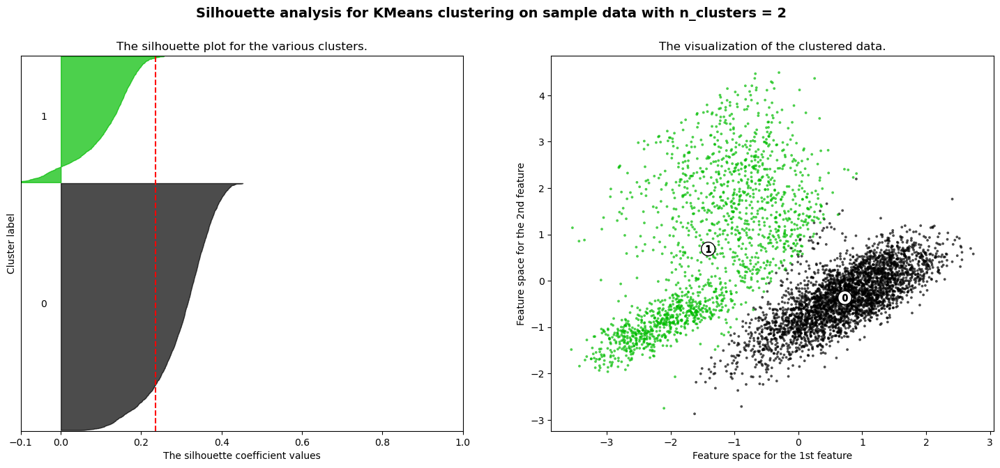

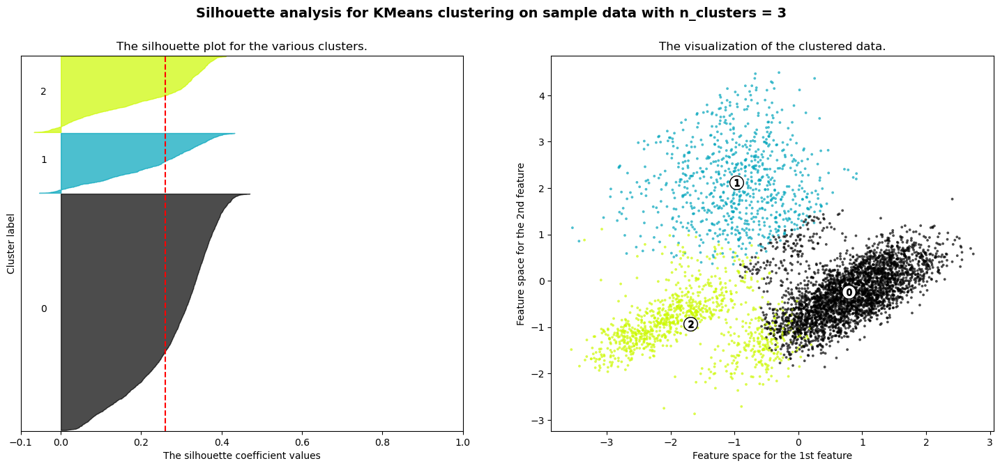

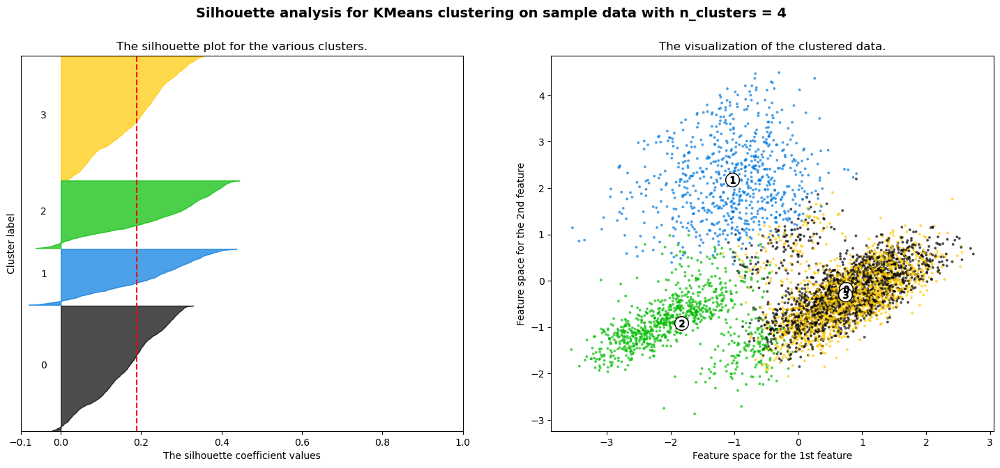

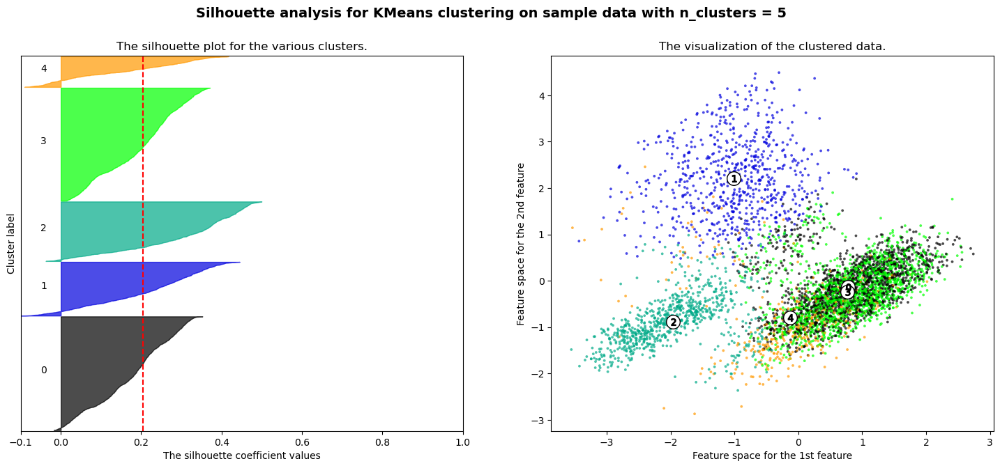

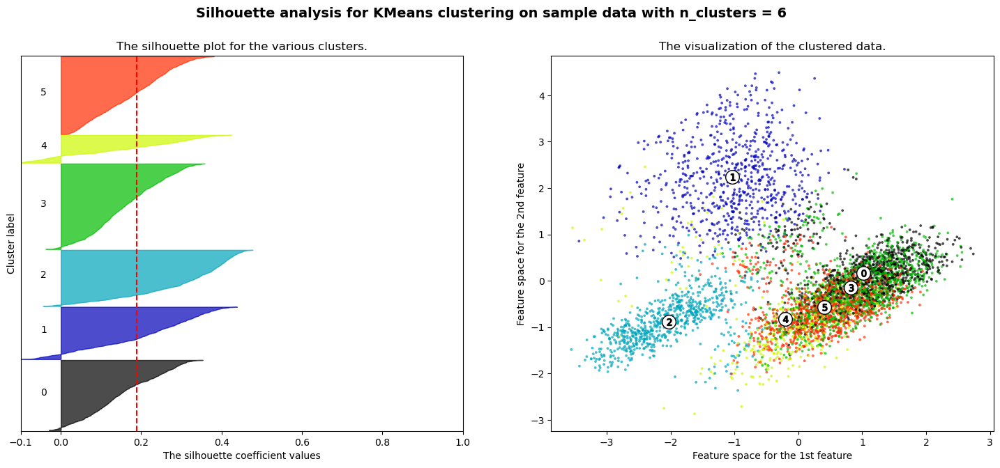

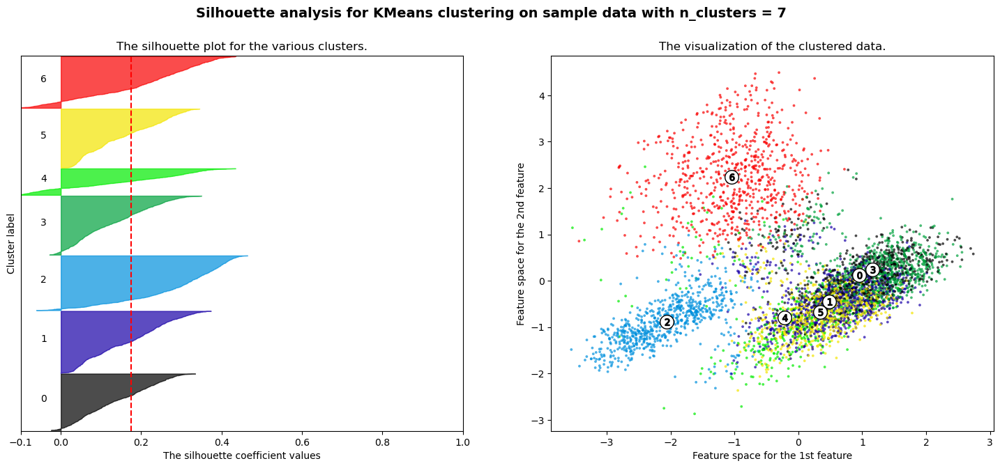

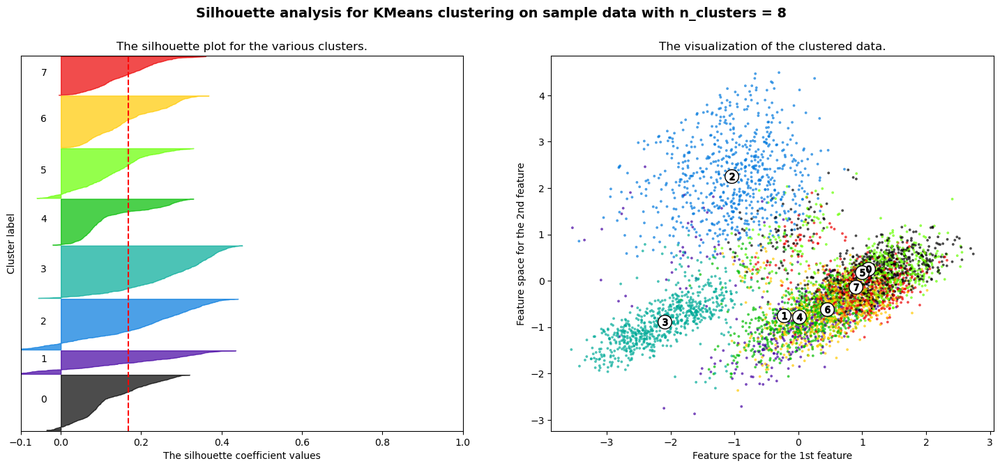

In [89]:
# Visualization of the Silhouette Scores and the respective clusters for cluster counts 2, 3, 4, 5, 6, 7, 8
# We begin with X
# The highest Silhouette Score is observed with 4 clusters

# Note: The visualization is performed in 2D, even though the PCA has higher dimensions

from sklearn.metrics import silhouette_samples

range_n_clusters = [2, 3, 4, 5, 6, 7,8]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    ax1.set_xlim([-0.1, 1])
    
  
    ax1.set_ylim([0, len(Y) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(Y[:, 0], Y[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()

For n_clusters = 2 The average silhouette_score is : 0.47105914181776193
For n_clusters = 3 The average silhouette_score is : 0.5439389367430686
For n_clusters = 4 The average silhouette_score is : 0.455167657379224
For n_clusters = 5 The average silhouette_score is : 0.4487942589983697
For n_clusters = 6 The average silhouette_score is : 0.4057816668184937
For n_clusters = 7 The average silhouette_score is : 0.36957163119343067
For n_clusters = 8 The average silhouette_score is : 0.3954319030294456


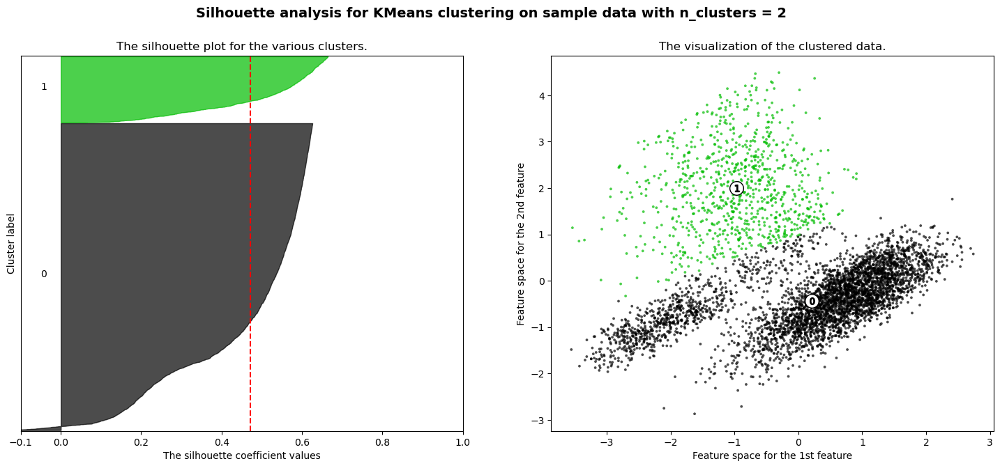

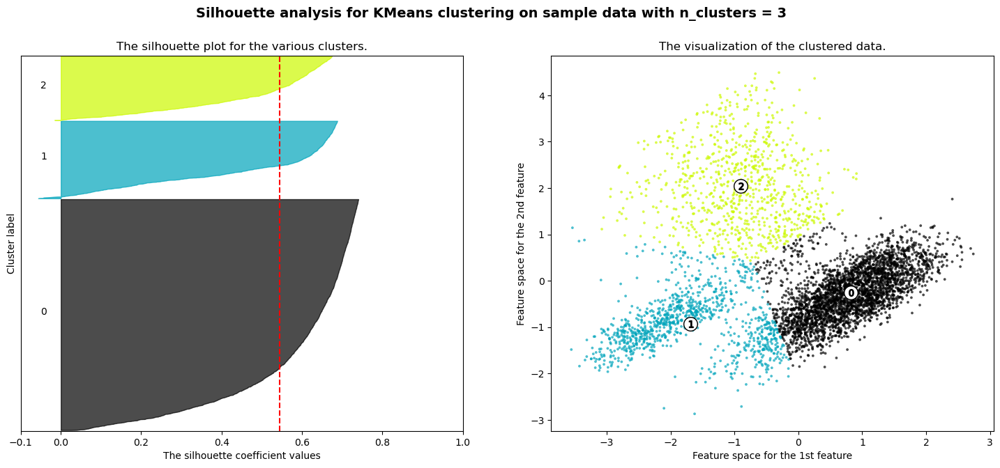

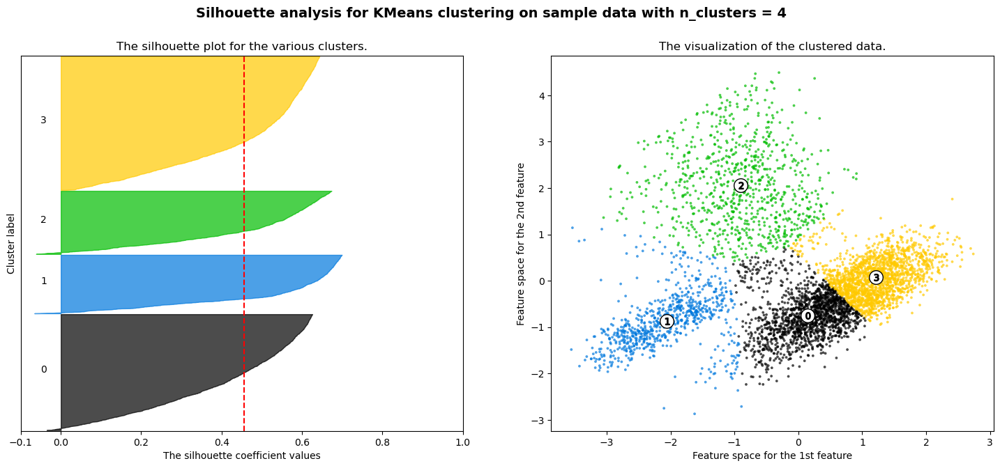

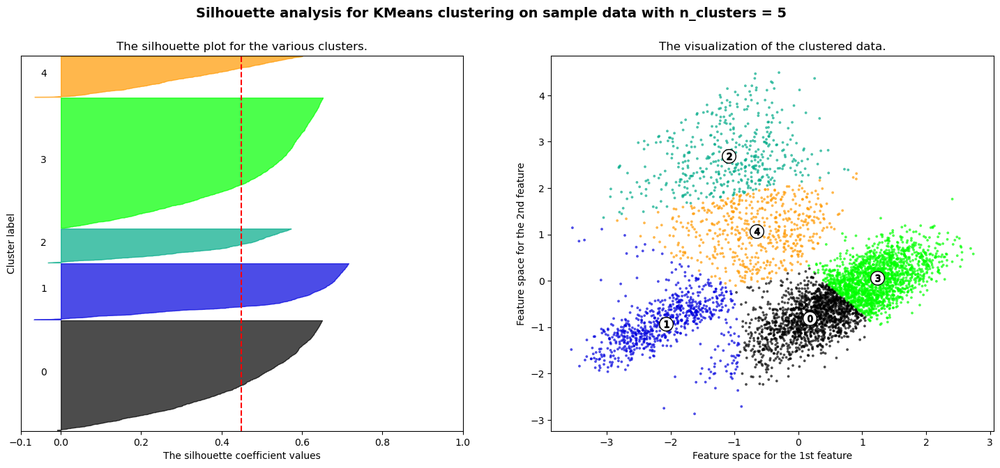

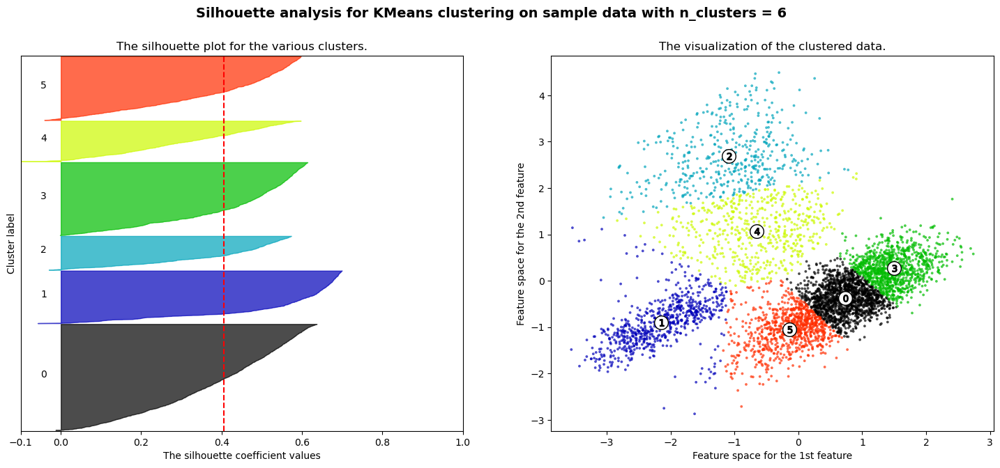

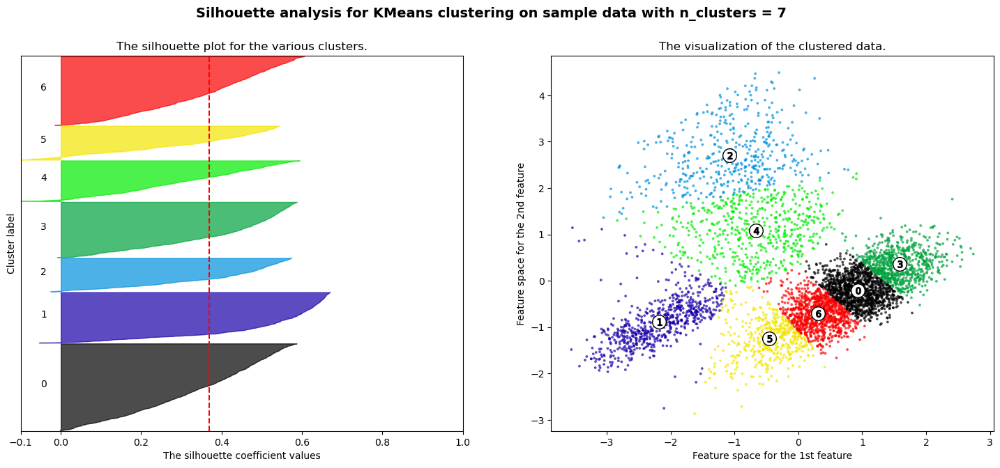

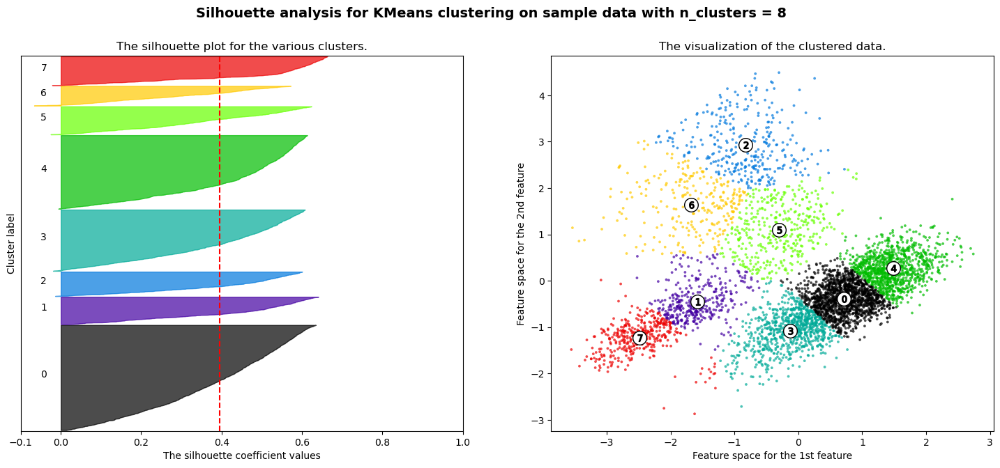

In [90]:
# Visualization of the Silhouette Scores and the respective clusters for cluster counts 2, 3, 4, 5, 6, 7, 8
# We analyse Y now
# The highest Silhouette Score is observed with 3 clusters

from sklearn.metrics import silhouette_samples

range_n_clusters = [2, 3, 4, 5, 6,7, 8,]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    ax1.set_xlim([-0.1, 1])
    
  
    ax1.set_ylim([0, len(Y) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(Y)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(Y, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(Y, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(Y[:, 0], Y[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()

In [91]:
#Cluster analysis with df_categorical_min_max
df_k_means = df_categorical_min_max

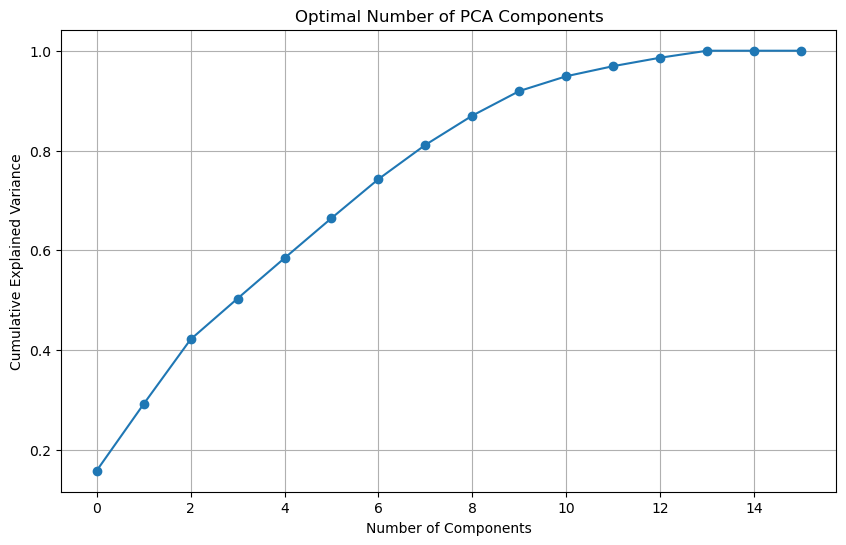

Optimal number of PCA components: 9 (explains 0.87 of variance)
PCA-transformed DataFrame for X:
        PC1       PC2       PC3       PC4       PC5       PC6       PC7  \
0 -0.855238 -0.332343  0.421594 -0.108466  0.161308  0.949951 -0.588271   
1 -0.882944 -0.361301  0.636437 -0.721811 -0.577164 -0.067720 -0.602001   
2 -0.850963 -0.353579  0.571461  0.682052 -0.552229  0.054285 -0.723072   
3 -0.798981  0.754759  0.687602 -0.014733 -0.094130  0.103221 -0.653764   
4 -0.821728  0.754752  0.630741  0.064203 -0.025962  0.134305 -0.635099   

        PC8       PC9  
0  0.208439 -0.084646  
1  0.216741 -0.178646  
2  0.251275 -0.448243  
3  0.176945  0.075789  
4 -0.757345  0.053496  
PCA-transformed DataFrame for Y:
        PC1       PC2
0 -0.855238 -0.332343
1 -0.882944 -0.361301
2 -0.850963 -0.353579
3 -0.798981  0.754759
4 -0.821728  0.754752


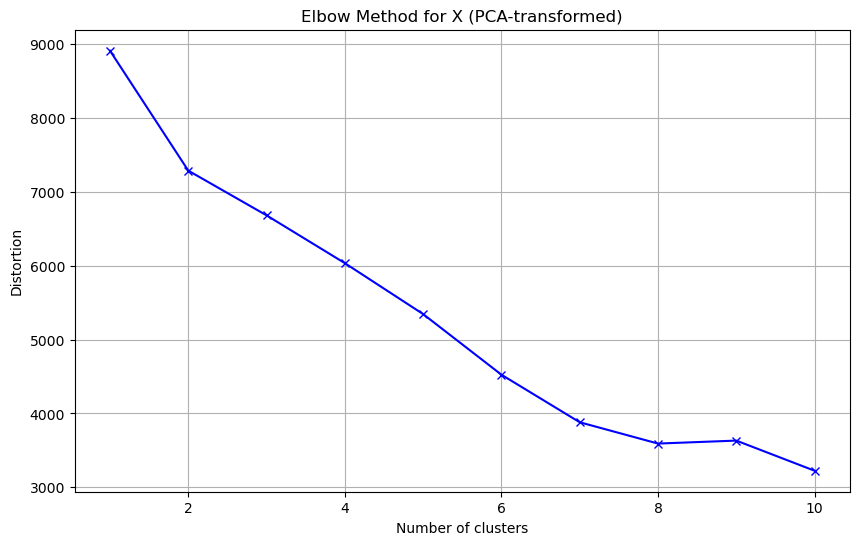

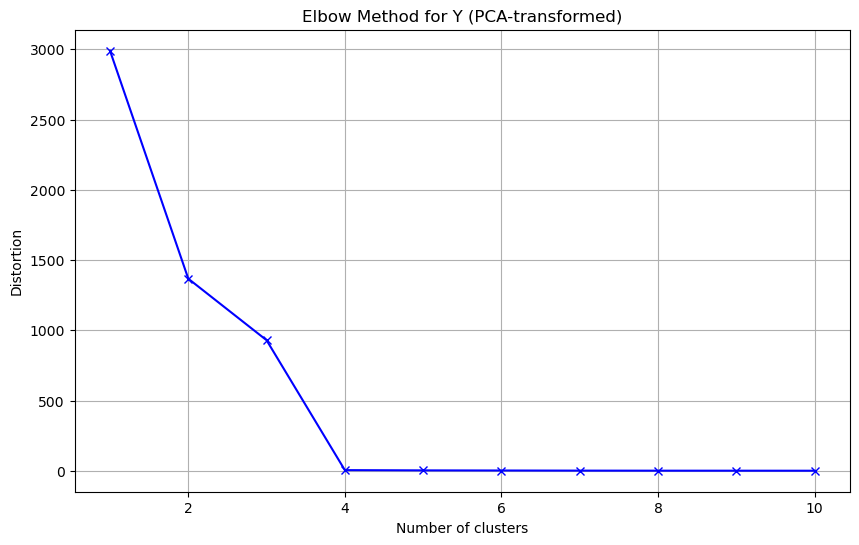

In [92]:
# Determine optimal number of PCA components with 85% variance explained
optimal_components, optimal_variance = optimal_pca_components(df_k_means, variance_threshold=0.85)
print(f"Optimal number of PCA components: {optimal_components} (explains {optimal_variance:.2f} of variance)")

# Perform PCA with the optimal number of components
pca_X = PCA(n_components=optimal_components)
X = pca_X.fit_transform(df_k_means)

# Convert PCA-transformed X to DataFrame and display
df_X_pca = pd.DataFrame(X, columns=[f'PC{i+1}' for i in range(optimal_components)])
print("PCA-transformed DataFrame for X:")
print(df_X_pca.head())

# Perform PCA with 2 components for visualization
pca_Y = PCA(n_components=2)
Y = pca_Y.fit_transform(df_k_means)

# Convert PCA-transformed Y to DataFrame and display
df_Y_pca = pd.DataFrame(Y, columns=['PC1', 'PC2'])
print("PCA-transformed DataFrame for Y:")
print(df_Y_pca.head())

# Function to plot the elbow method for determining the optimal number of clusters
def plot_elbow_method(data, title):
    distortions = []
    K = range(1, 11)
    for k in K:
        kmeanModel = KMeans(n_clusters=k, random_state=42)
        kmeanModel.fit(data)
        distortions.append(kmeanModel.inertia_)

    plt.figure(figsize=(10, 6))
    plt.plot(K, distortions, 'bx-')
    plt.xlabel('Number of clusters')
    plt.ylabel('Distortion')
    plt.title(title)
    plt.grid(True)
    plt.show()

# Plot the elbow method for X and Y
plot_elbow_method(X, 'Elbow Method for X (PCA-transformed)')
plot_elbow_method(Y, 'Elbow Method for Y (PCA-transformed)')

In [93]:
# For X, we were again unable to determine a clear result from the elbow method. The Silhouette Score indicated an optimal value of 10,
# which is not ideal since the limit was 10. This suggests that having too many clusters might lead to overfitting. 
# Therefore, we need to choose a lower number of clusters. We decided on 7 clusters, as this can be inferred from the elbow plot, 
# and further analysis also shows it to be a good choice.
# For Y, the optimal number of clusters is clearly 4.

Manual optimal number of clusters for X: 7
Manual optimal number of clusters for Y: 4
Silhouette Score for X: 0.3435338366610003
Silhouette Score for Y: 0.9624552222964524


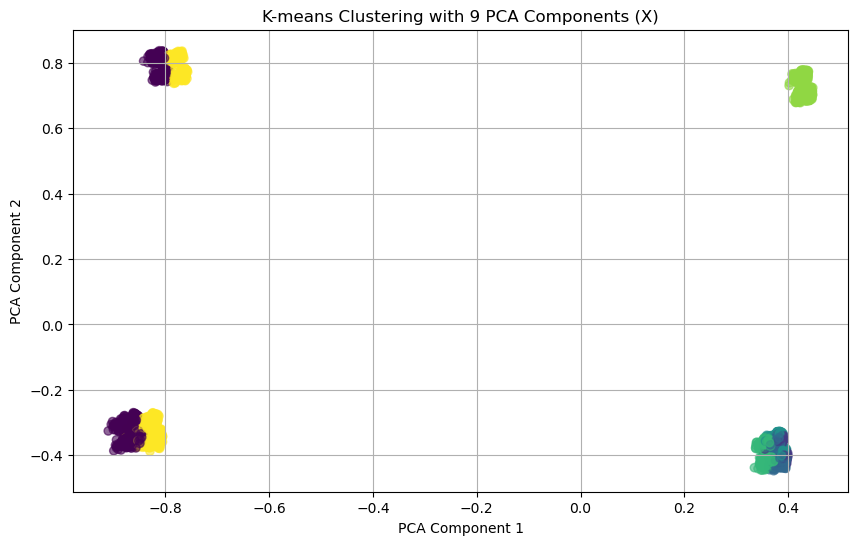

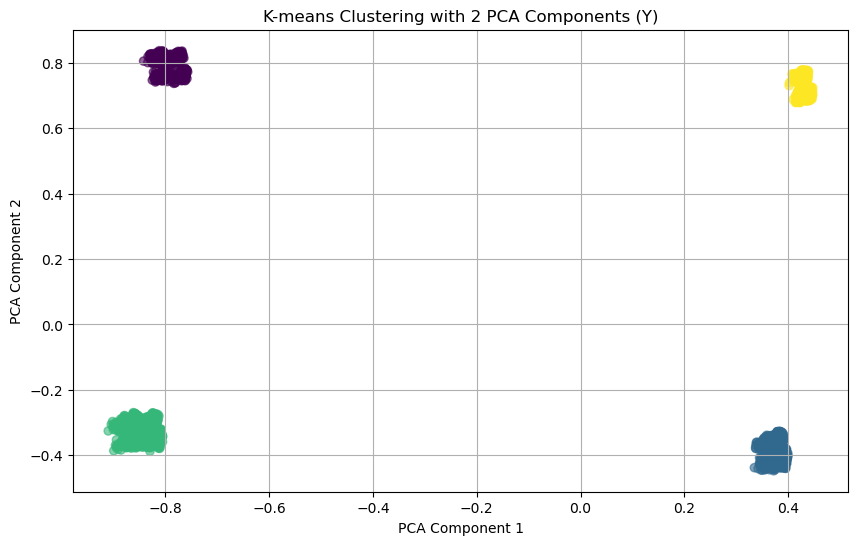

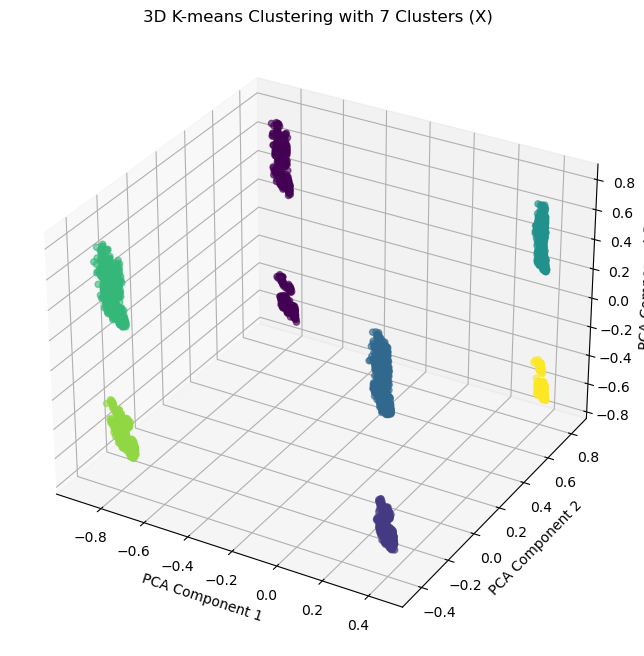

In [94]:
# Manual optimal number of clusters for X and Y
manual_optimal_clusters_X = 7
manual_optimal_clusters_Y = 4

print(f"Manual optimal number of clusters for X: {manual_optimal_clusters_X}")
print(f"Manual optimal number of clusters for Y: {manual_optimal_clusters_Y}")

# Perform k-means clustering with the optimal number of clusters
kmeans_X = KMeans(n_clusters=manual_optimal_clusters_X, random_state=42)
clusters_X = kmeans_X.fit_predict(X)
centers_X = kmeans_X.cluster_centers_

kmeans_Y = KMeans(n_clusters=manual_optimal_clusters_Y, random_state=42)
clusters_Y = kmeans_Y.fit_predict(Y)
centers_Y = kmeans_Y.cluster_centers_

# Calculate and print silhouette scores
silhouette_avg_X = silhouette_score(X, clusters_X)
silhouette_avg_Y = silhouette_score(Y, clusters_Y)
print(f'Silhouette Score for X: {silhouette_avg_X}')
print(f'Silhouette Score for Y: {silhouette_avg_Y}')

# We have visualized the clusters using both a higher number of PCA components and in 2D and 3D scatter plots 
# to provide a broad overview of the data.
# These visualizations are essential as they help us understand the clustering structure and the distribution 
# of data points within each cluster.
# By reducing the dimensions to 2D and 3D, we can plot the data points and visually inspect the separation 
# and cohesion of clusters. 
# However, it is important to note that while these plots provide valuable insights, they do not capture 
# the full complexity of the data.
# This is because PCA compresses the information from all original dimensions into the selected principal components, 
# and not all variance and relationships in the data are visible in these reduced dimensions.
# Therefore, while 2D and 3D visualizations are helpful for initial exploration and understanding, 
# they might not fully represent the clustering in the higher-dimensional space where the data originally resides.

# Visualize the clusters for X using the first two PCA components
plt.figure(figsize=(10, 6))
plt.scatter(X[:, 0], X[:, 1], c=clusters_X, cmap='viridis', alpha=0.6)
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.title(f'K-means Clustering with {optimal_components} PCA Components (X)')
plt.grid(True)
plt.show()

# Visualize the clusters for Y (2D)
plt.figure(figsize=(10, 6))
plt.scatter(Y[:, 0], Y[:, 1], c=clusters_Y, cmap='viridis', alpha=0.6)
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.title('K-means Clustering with 2 PCA Components (Y)')
plt.grid(True)
plt.show()

# Perform PCA with 3 components for 3D visualization
pca_3d = PCA(n_components=3)
X_3d = pca_3d.fit_transform(df_k_means)

# Perform k-means clustering with the optimal number of clusters
kmeans_3d = KMeans(n_clusters=manual_optimal_clusters_X, random_state=42)
clusters_3d = kmeans_3d.fit_predict(X_3d)
centers_3d = kmeans_3d.cluster_centers_

# Visualize the clusters for X using the first three PCA components
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(X_3d[:, 0], X_3d[:, 1], X_3d[:, 2], c=clusters_3d, cmap='viridis', alpha=0.6)
ax.set_xlabel('PCA Component 1')
ax.set_ylabel('PCA Component 2')
ax.set_zlabel('PCA Component 3')
ax.set_title(f'3D K-means Clustering with {manual_optimal_clusters_X} Clusters (X)')
plt.show()

For n_clusters = 2 The average silhouette_score is : 0.22580299509106525
For n_clusters = 3 The average silhouette_score is : 0.15913969906620914
For n_clusters = 4 The average silhouette_score is : 0.237582106230721
For n_clusters = 5 The average silhouette_score is : 0.2838256191947201
For n_clusters = 6 The average silhouette_score is : 0.2929462421190429
For n_clusters = 7 The average silhouette_score is : 0.2953483555386569
For n_clusters = 8 The average silhouette_score is : 0.36387516441897994


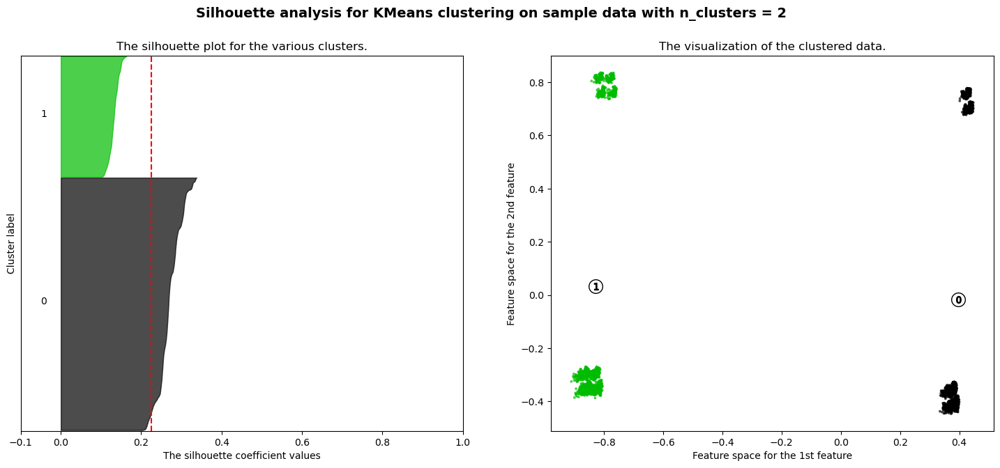

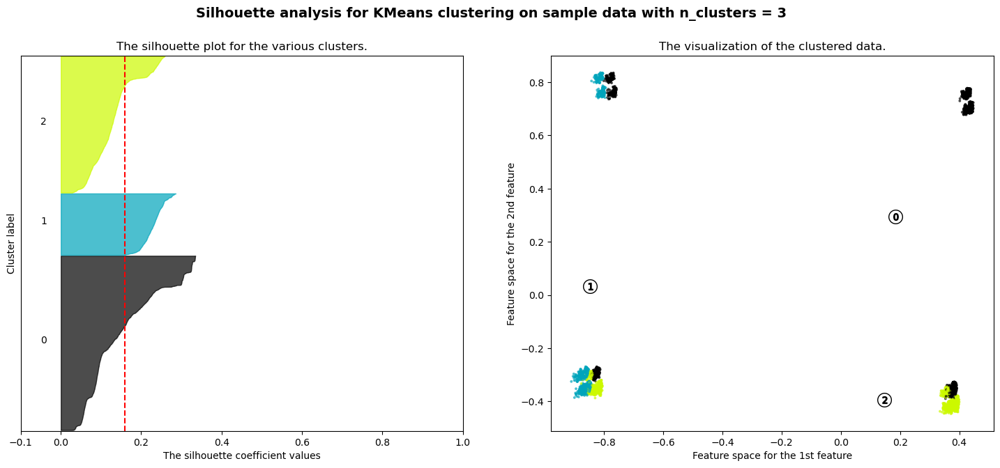

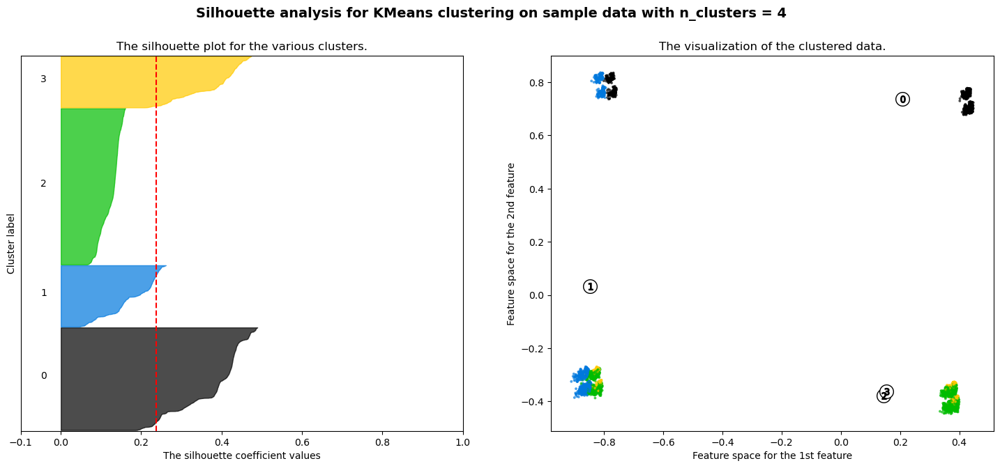

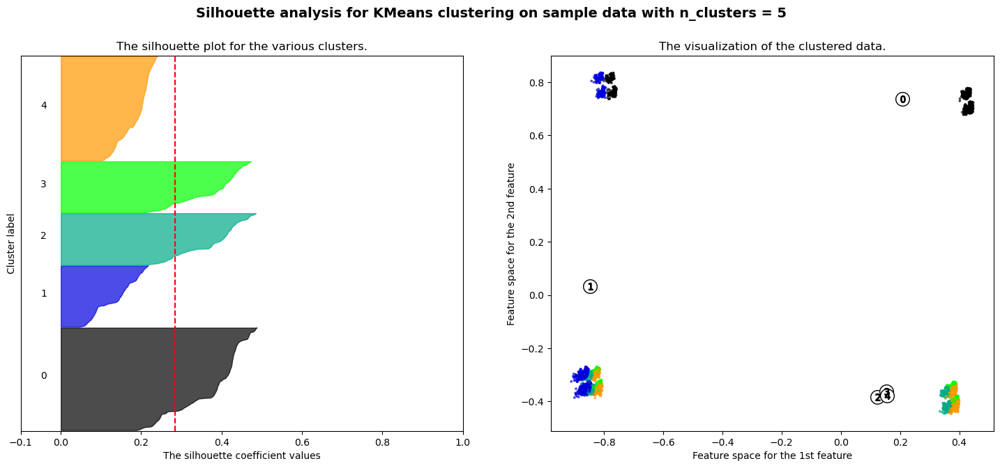

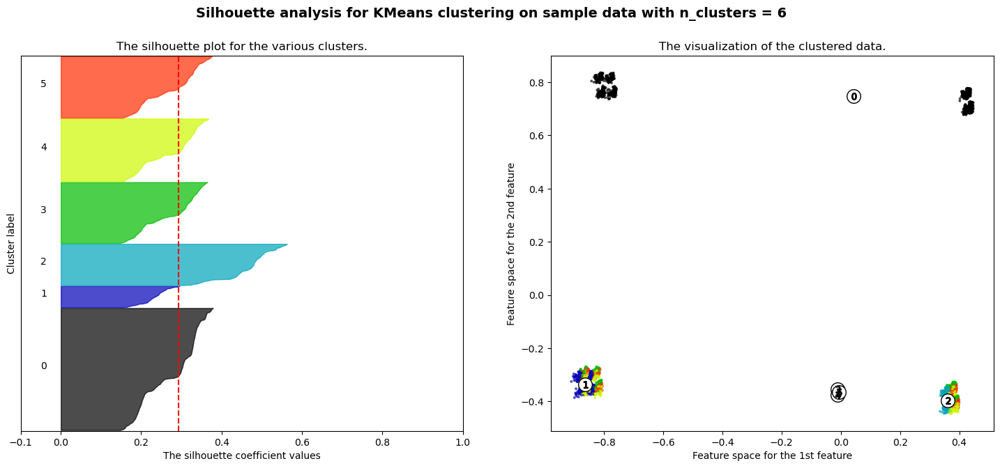

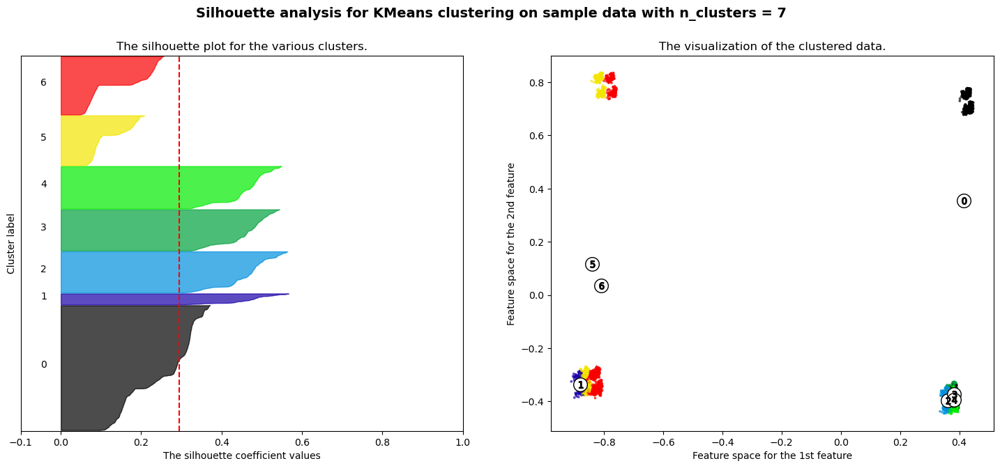

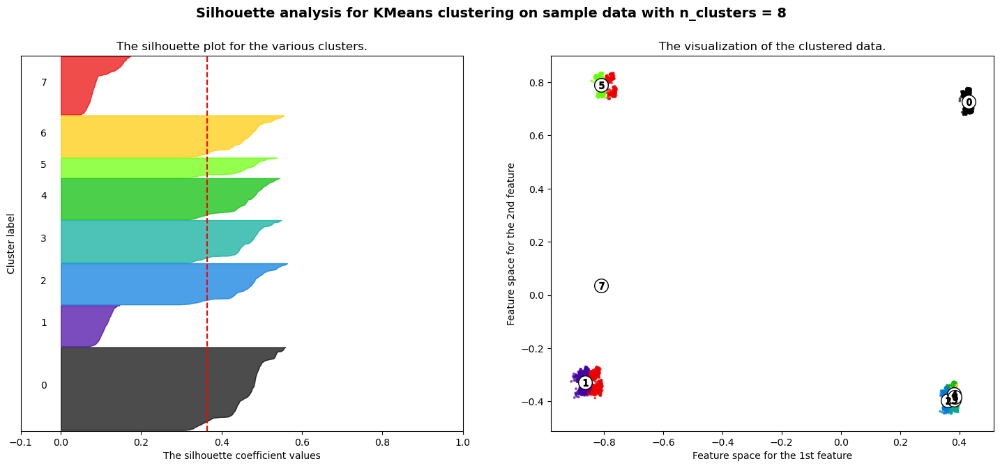

In [95]:
# Visualization of the Silhouette Scores and the respective clusters for cluster counts 2, 3, 4, 5, 6, 7, 8
# We begin with X
# The highest Silhouette Score is observed with 7 clusters

# Note: The visualization is performed in 2D, even though the PCA has higher dimensions
from sklearn.metrics import silhouette_samples

range_n_clusters = [2, 3, 4, 5, 6, 7,8]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    ax1.set_xlim([-0.1, 1])
    
  
    ax1.set_ylim([0, len(Y) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(Y[:, 0], Y[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()

For n_clusters = 2 The average silhouette_score is : 0.5940945189344868
For n_clusters = 3 The average silhouette_score is : 0.8396977796999999
For n_clusters = 4 The average silhouette_score is : 0.9624552222964524
For n_clusters = 5 The average silhouette_score is : 0.8063326185476537
For n_clusters = 6 The average silhouette_score is : 0.7632952526290014
For n_clusters = 7 The average silhouette_score is : 0.7114469566330335
For n_clusters = 8 The average silhouette_score is : 0.608770976757005


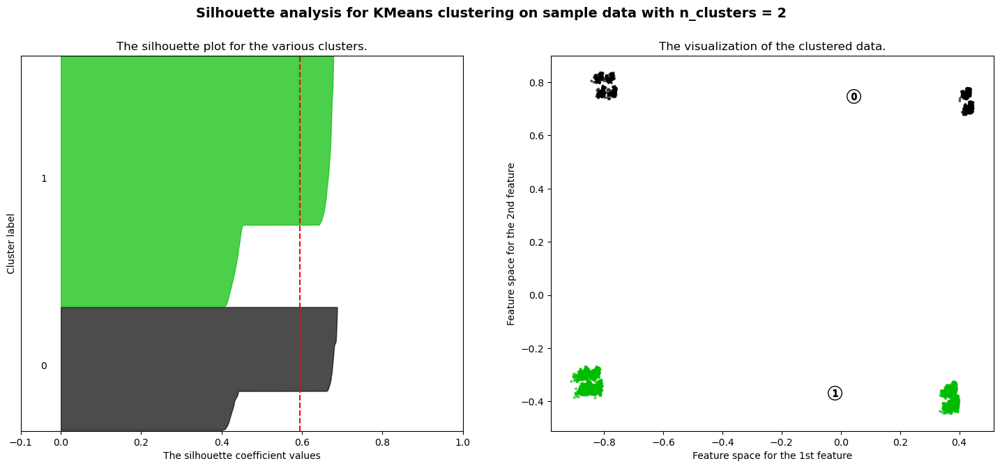

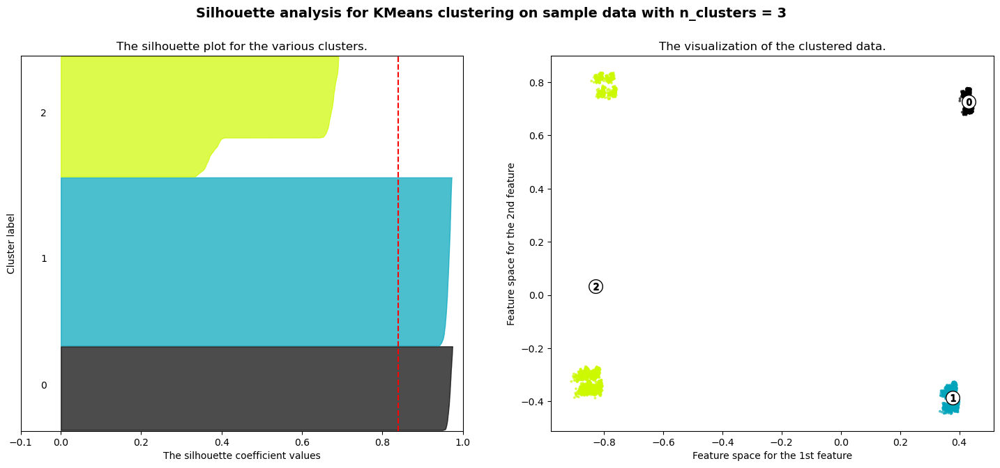

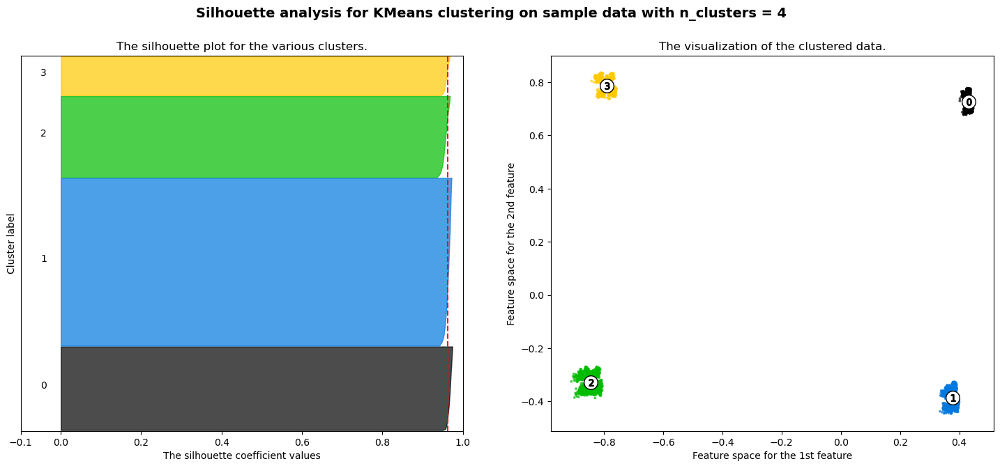

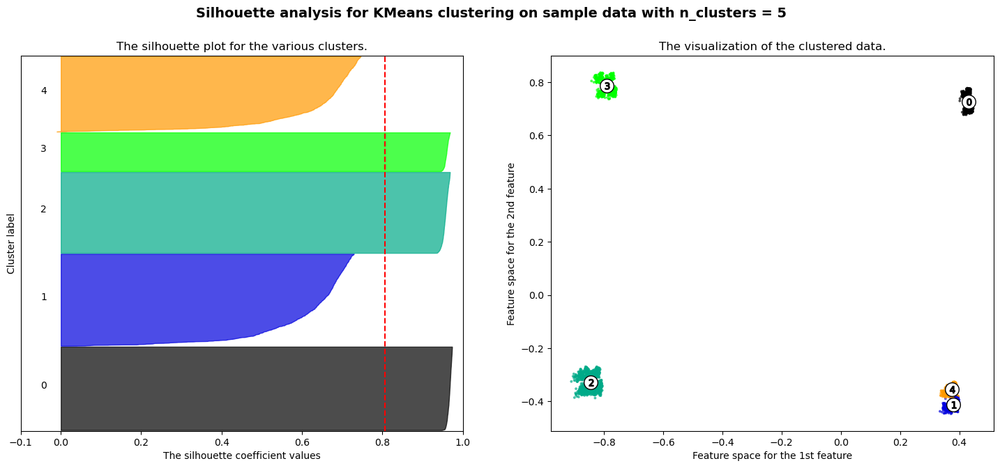

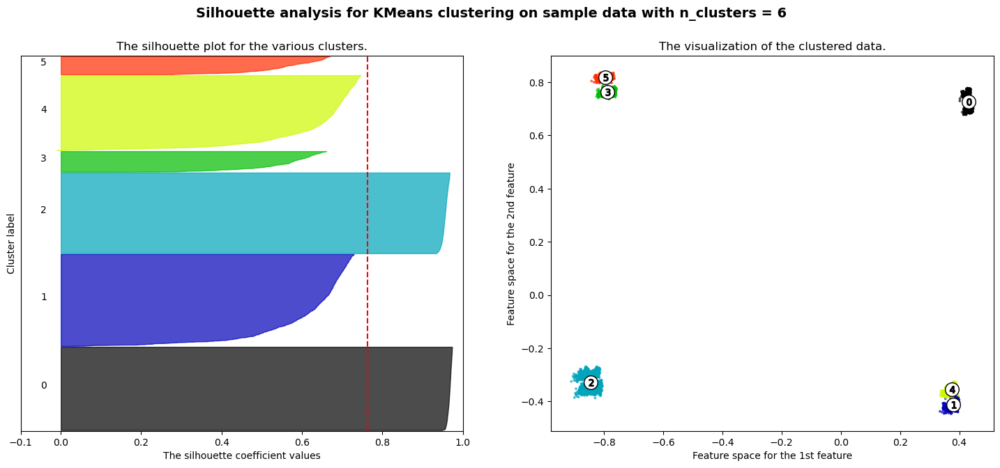

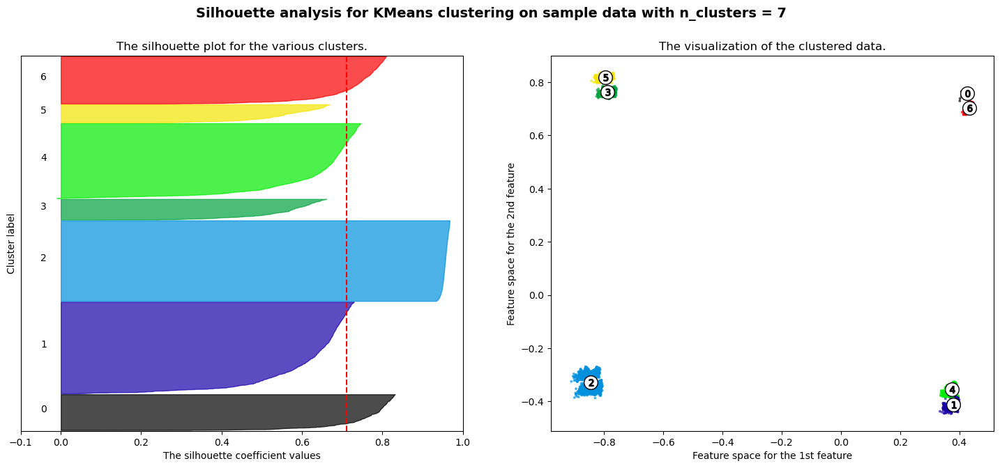

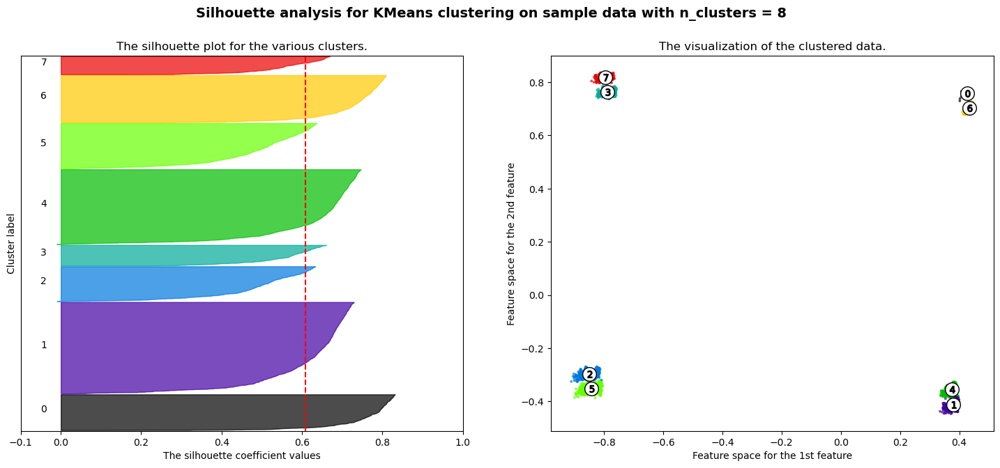

In [96]:
# Visualization of the Silhouette Scores and the respective clusters for cluster counts 2, 3, 4, 5, 6, 7, 8
# Now we analyse Y
# The highest Silhouette Score is observed with 4 clusters

from sklearn.metrics import silhouette_samples

range_n_clusters = [2, 3, 4, 5, 6,7, 8,]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    ax1.set_xlim([-0.1, 1])
    
  
    ax1.set_ylim([0, len(Y) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(Y)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(Y, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(Y, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(Y[:, 0], Y[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()

In [97]:
# Perform k-means clustering with the manually determined optimal number of clusters for X
#km = KMeans(n_clusters=manual_optimal_clusters_X)
#km.fit(X)

# Perform k-means clustering with the manually determined optimal number of clusters for Y
km = KMeans(n_clusters=manual_optimal_clusters_Y)
km.fit(Y)

#We only add Y Clusters of df_categorical_min_max to our DataFrame, beacuse it gave the best results

KMeans(n_clusters=4)

In [98]:
# Save cluster assignments
df_categorical_min_max["Cluster"] = km.labels_  # Assign the cluster labels from k-means to the 'Cluster' column in df_categorical_min_max
df_standard["Cluster"] = km.labels_             # Assign the cluster labels from k-means to the 'Cluster' column in df_standard
df_min_max["Cluster"] = km.labels_              # Assign the cluster labels from k-means to the 'Cluster' column in df_min_max

In [99]:
# Checking df if column was added
df_categorical_min_max.head(10)

,Customer_care_calls,Customer_rating,Cost_of_the_Product,Prior_purchases,Product_importance,Discount_offered,Weight_in_gms,Reached.on.Time_Y.N,Warehouse_block_0,Warehouse_block_1,Warehouse_block_2,Warehouse_block_3,Warehouse_block_4,Mode_of_Shipment_0,Mode_of_Shipment_1,Mode_of_Shipment_2,Cluster
1,0.6,0.25,0.766355,0.000,1,0.343750,0.592318,1,1,0,0,0,0,1,0,0,1
2,0.8,0.25,0.294393,0.375,1,0.328125,0.049210,1,0,1,0,0,0,1,0,0,1
3,0.4,0.00,0.612150,0.125,1,0.828125,0.408482,1,0,0,1,0,0,1,0,0,1
4,0.2,0.50,0.037383,0.375,1,0.625000,0.187037,1,0,0,0,0,1,1,0,0,3
6,0.6,0.50,0.495327,0.125,0,0.625000,0.507101,1,0,0,0,0,1,1,0,0,3
9,0.4,0.75,0.635514,0.125,1,0.937500,0.296659,1,0,0,1,0,0,1,0,0,1
10,0.4,0.50,0.219626,0.000,0,0.593750,0.145229,1,0,0,0,0,1,1,0,0,3
11,0.6,0.00,0.467290,0.125,1,0.359375,0.391278,1,0,0,0,1,0,1,0,0,1
12,0.4,0.00,0.252336,0.500,1,0.640625,0.013803,1,0,0,0,0,1,1,0,0,3
13,0.6,0.00,0.588785,0.125,0,0.312500,0.270054,1,1,0,0,0,0,1,0,0,1


In [100]:
#Decision Tree

In [101]:
# Splitting the data set into characteristics (X) and target variable (y), here Product_importance
X = df_standard.drop(columns=['Product_importance'])
y = df_standard['Product_importance']

In [102]:
X #Output of data without the target variable

,Warehouse_block,Mode_of_Shipment,Customer_care_calls,Customer_rating,Cost_of_the_Product,Prior_purchases,Discount_offered,Weight_in_gms,Reached.on.Time_Y.N,Cluster
1,0,0,0.860059,-0.715568,1.061463,-0.968719,0.758529,0.016280,1,1
2,1,0,1.749452,-0.715568,-1.055830,0.826335,0.691534,-1.726882,1,1
3,2,0,-0.029335,-1.428251,0.369674,-0.370368,2.835380,-0.573763,1,1
4,4,0,-0.918728,-0.002884,-2.208812,0.826335,1.964442,-1.284510,1,3
6,4,0,0.860059,-0.002884,-0.154408,-0.370368,1.964442,-0.257233,1,3
...,...,...,...,...,...,...,...,...,...,...
9524,1,2,0.860059,1.422483,-1.013904,-0.370368,-0.313394,0.899738,1,0
9525,2,2,-0.029335,-1.428251,1.019537,-0.370368,-0.112409,1.270842,0,0
9526,4,2,-0.918728,-0.715568,0.390638,-0.968719,-0.648370,1.093637,0,2
9528,4,2,-0.918728,1.422483,-1.537986,-0.370368,-0.313394,0.135059,0,2


In [103]:
y #Outputting the target variable

1       1
2       1
3       1
4       1
6       0
       ..
9524    0
9525    1
9526    1
9528    1
9532    0
Name: Product_importance, Length: 4942, dtype: int32

In [104]:
# Split the data set into training and test data (split validation 2/3 training data, 1/3 test data)
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size =0.33,random_state=42)

In [105]:
# Checking the split quantity: split 2/3 to 1/3
X_train.shape,X_test.shape

((3311, 10), (1631, 10))

In [106]:
# Training the decision tree classifier with specific hyperparameters
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

# Define the decision tree classifier with the Gini criterion
dt_gini = DecisionTreeClassifier(criterion="gini", splitter="best", max_depth=3,min_samples_split=2, min_samples_leaf=1, random_state=42)
# Adapt the model to the training data
dt_gini.fit(X_train, y_train)


DecisionTreeClassifier(max_depth=3, random_state=42)

In [107]:
# Predictions on the test data with the Gini criterion
y_pred_gini = dt_gini.predict(X_test)

In [108]:
# Predictions on the training data with the Gini criterion
y_pred_train_gini = dt_gini.predict(X_train)

In [109]:
# Calculation of accuracy on the test data and training data
from sklearn.metrics import accuracy_score

# Calculate and output accuracy on the test data
test_accuracy = accuracy_score(y_test, y_pred_gini)
print("Accuracy on test data:", test_accuracy)

# Calculate and output accuracy on the training data
train_accuracy = accuracy_score(y_train, y_pred_train_gini)
print("Accuracy on training data:", train_accuracy)

Accuracy on test data: 0.835683629675046
Accuracy on training data: 0.8360012080942314


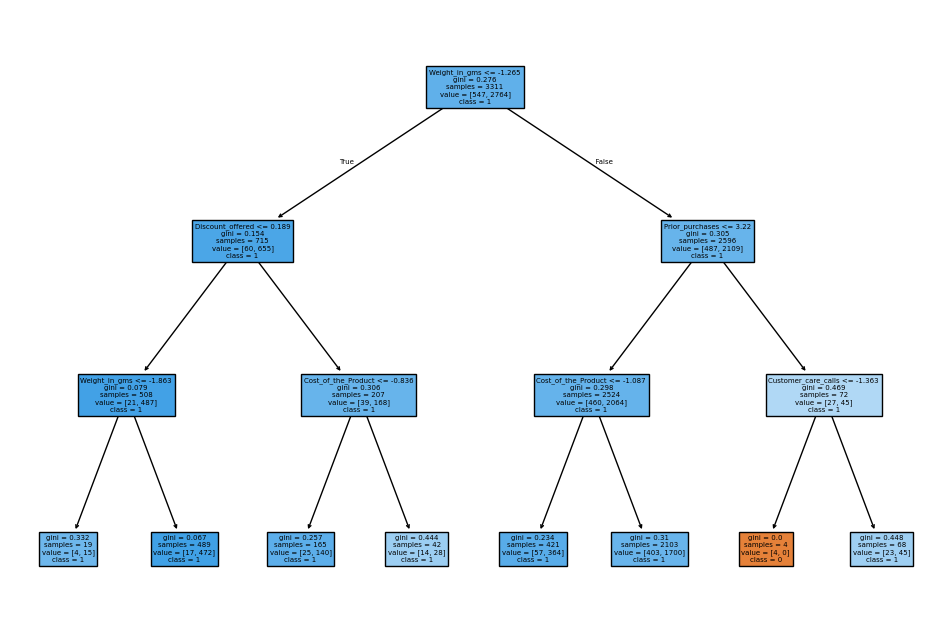

In [110]:
# Visualization of the decision tree based on the Gini criterion and training data
import matplotlib.pyplot as plt
from sklearn import tree

plt.figure(figsize=(12, 8))

tree.plot_tree(dt_gini, 
               feature_names=["Warehouse_block", "Mode_of_Shipment", "Customer_care_calls", "Customer_rating", "Cost_of_the_Product", 
                              "Prior_purchases", "Discount_offered", "Weight_in_gms", "Reached.on.Time_Y.N","Cluster"],
               class_names=["0", "1"],
               filled=True)
plt.savefig('C:/Users/felix/Downloads/Machine Learning/desicion_tree_1.png')
plt.show()


In [111]:
# Textual representation of the decision tree based on the Gini criterion and training data
text_representation= tree.export_text(dt_gini, feature_names=["Warehouse_block", "Mode_of_Shipment", "Customer_care_calls", "Customer_rating", "Cost_of_the_Product", 
                              "Prior_purchases", "Discount_offered", "Weight_in_gms", "Reached.on.Time_Y.N","Cluster"])
print(text_representation)

|--- Weight_in_gms <= -1.26
|   |--- Discount_offered <= 0.19
|   |   |--- Weight_in_gms <= -1.86
|   |   |   |--- class: 1
|   |   |--- Weight_in_gms >  -1.86
|   |   |   |--- class: 1
|   |--- Discount_offered >  0.19
|   |   |--- Cost_of_the_Product <= -0.84
|   |   |   |--- class: 1
|   |   |--- Cost_of_the_Product >  -0.84
|   |   |   |--- class: 1
|--- Weight_in_gms >  -1.26
|   |--- Prior_purchases <= 3.22
|   |   |--- Cost_of_the_Product <= -1.09
|   |   |   |--- class: 1
|   |   |--- Cost_of_the_Product >  -1.09
|   |   |   |--- class: 1
|   |--- Prior_purchases >  3.22
|   |   |--- Customer_care_calls <= -1.36
|   |   |   |--- class: 0
|   |   |--- Customer_care_calls >  -1.36
|   |   |   |--- class: 1



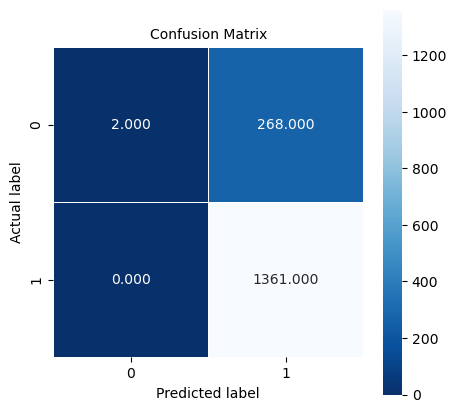

In [112]:
# Display confusion matrix for the test data with the Gini criterion
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import metrics

confusion_matrix = metrics.confusion_matrix(y_test, y_pred_gini)

plt.figure(figsize=(5,5))
sns.heatmap(confusion_matrix, annot=True, fmt=".3f", linewidths=.5, square=True, cmap='Blues_r');
plt.ylabel('Actual label');
plt.xlabel('Predicted label');
plt.title('Confusion Matrix', size=10);

In [113]:
from sklearn.metrics import precision_score, recall_score, f1_score

# Calculate and output additional performance metrics for the test data using the Gini criterion 
precision = precision_score(y_test, y_pred_gini)
recall = recall_score(y_test, y_pred_gini)
f1 = f1_score(y_test, y_pred_gini)

print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1-Score: {f1}")



Precision: 0.8354818907305095
Recall: 1.0
F1-Score: 0.9103678929765886


In [114]:
# Display classification report for the test data with the Gini criterion 
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred_gini))

              precision    recall  f1-score   support

           0       1.00      0.01      0.01       270
           1       0.84      1.00      0.91      1361

    accuracy                           0.84      1631
   macro avg       0.92      0.50      0.46      1631
weighted avg       0.86      0.84      0.76      1631



In [115]:
from sklearn.model_selection import KFold, cross_val_score, GridSearchCV

# Check for overfitting using 10-fold cross-validation
kf = KFold(n_splits=10, shuffle=True, random_state=42)
cv_scores = cross_val_score(dt_gini, X, y, cv=kf)

print("Cross-validation scores:", cv_scores)
print("Mean cross-validation score:", cv_scores.mean())


Cross-validation scores: [0.83838384 0.85050505 0.80566802 0.83805668 0.82591093 0.81781377
 0.83805668 0.85425101 0.83805668 0.8340081 ]
Mean cross-validation score: 0.8340710751237068


In [116]:
# Check for overfitting with increasing tree depth, search for the ideal tree depth -> 1 and 2 with the highest average accuracy score
max_depth = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]

for val in max_depth:
    model = tree.DecisionTreeClassifier(max_depth=val, random_state=42)
    score = cross_val_score(model, X, y, cv=kf, scoring="accuracy")
    print(f"average accuracy score({val}): {'{:.3f}'.format(score.mean())}")

average accuracy score(1): 0.835
average accuracy score(2): 0.835
average accuracy score(3): 0.834
average accuracy score(4): 0.831
average accuracy score(5): 0.828
average accuracy score(6): 0.826
average accuracy score(7): 0.822
average accuracy score(8): 0.817
average accuracy score(9): 0.808
average accuracy score(10): 0.803


In [117]:
#Decision tree without parameters 
dt_noparam = DecisionTreeClassifier(criterion='gini', splitter='best', random_state=0)
dt_noparam.fit(X_train, y_train)
y_pred = dt_noparam.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print('The model accuracy is: {:.4f}'.format(accuracy))

The model accuracy is: 0.7210


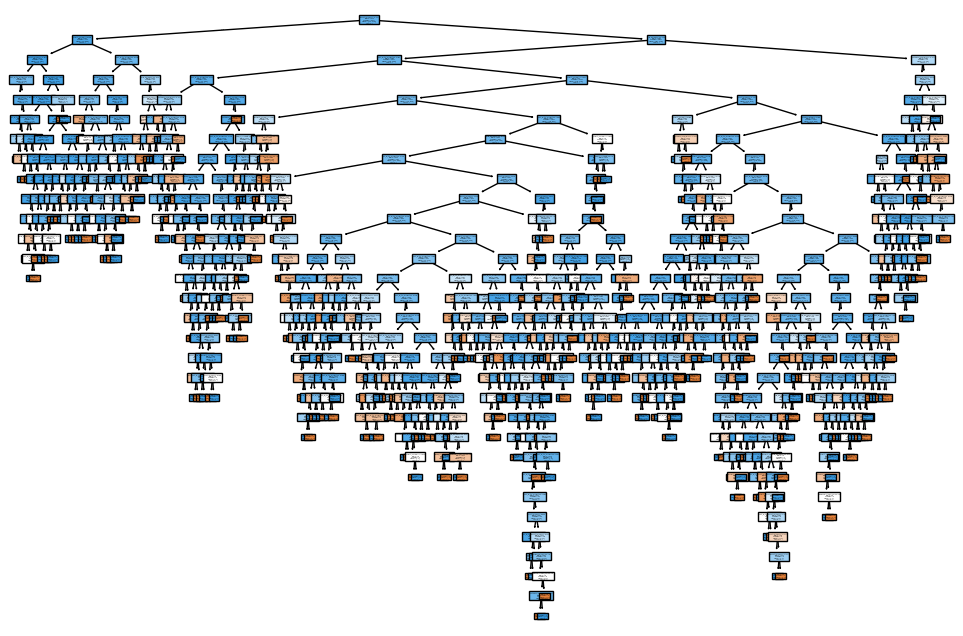

In [118]:
# Visualization of the decision tree without parameters
import matplotlib.pyplot as plt
from sklearn import tree

plt.figure(figsize=(12, 8))

tree.plot_tree(dt_noparam.fit(X_train, y_train), 
               feature_names=["Warehouse_block", "Mode_of_Shipment", "Customer_care_calls", "Customer_rating", "Cost_of_the_Product", 
                              "Prior_purchases", "Discount_offered", "Weight_in_gms", "Reached.on.Time_Y.N","Cluster"],
               class_names=["0", "1"],
               filled=True)

plt.show()

In [119]:
# Parameter-Tuning und Pruning mit GridSearchCV
params = {
    "max_depth": [2,3,4,5,6,7,8,9,10],
    "min_samples_split": [2, 3, 4],
    "min_samples_leaf": [1, 2]
}

clf = DecisionTreeClassifier()
gcv = GridSearchCV(estimator=clf, param_grid=params, cv=10)
gcv.fit(X_train, y_train)

GridSearchCV(cv=10, estimator=DecisionTreeClassifier(),
             param_grid={'max_depth': [2, 3, 4, 5, 6, 7, 8, 9, 10],
                         'min_samples_leaf': [1, 2],
                         'min_samples_split': [2, 3, 4]})

In [120]:
# Get best model according to GridSearchCV
best_model = gcv.best_estimator_
print("Best model parameters:", gcv.best_params_)
model = gcv.best_estimator_
model.fit(X_train,y_train)

Best model parameters: {'max_depth': 2, 'min_samples_leaf': 1, 'min_samples_split': 2}


DecisionTreeClassifier(max_depth=2)

In [121]:
# Predictions with the best model
y_train_pred = best_model.predict(X_train)
y_test_pred = best_model.predict(X_test)

In [122]:
from sklearn.metrics import accuracy_score
# Calculate and output accuracy on the test data with the best model
test_accuracy = accuracy_score(y_test, y_test_pred)
print("Accuracy on test data:", test_accuracy)

# Calculate and output accuracy on the training data with the best model
train_accuracy = accuracy_score(y_train, y_train_pred)
print("Accuracy on training data:", train_accuracy)

Accuracy on test data: 0.8344573881054568
Accuracy on training data: 0.8347931138628814


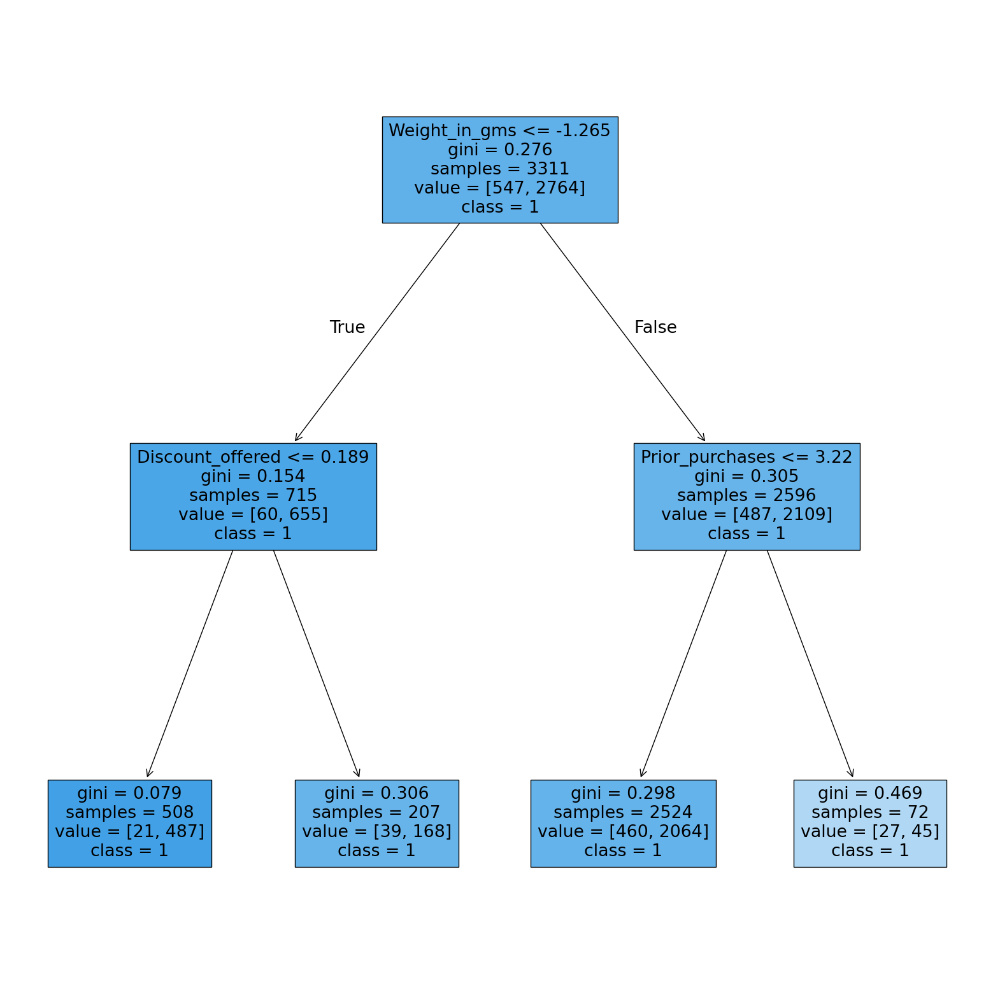

In [123]:
# Visual representation of the decision tree of the best model -> medium is always predicted
from sklearn.tree import DecisionTreeClassifier, plot_tree
plt.figure(figsize=(20,20))

plot_tree(best_model, 
          feature_names=["Warehouse_block", "Mode_of_Shipment", "Customer_care_calls", "Customer_rating", "Cost_of_the_Product", 
                         "Prior_purchases", "Discount_offered", "Weight_in_gms", "Reached.on.Time_Y.N","Cluster"],
               class_names=["0", "1"],
          filled=True)

plt.show()

In [124]:
# Textual representation of the decision tree of the best model -> medium is always predicted
text_representation= tree.export_text(best_model, feature_names=["Warehouse_block", "Mode_of_Shipment", "Customer_care_calls", "Customer_rating", 
                                                                 "Cost_of_the_Product", "Prior_purchases", "Discount_offered", "Weight_in_gms", 
                                                                 "Reached.on.Time_Y.N","Cluster"])
print(text_representation)

|--- Weight_in_gms <= -1.26
|   |--- Discount_offered <= 0.19
|   |   |--- class: 1
|   |--- Discount_offered >  0.19
|   |   |--- class: 1
|--- Weight_in_gms >  -1.26
|   |--- Prior_purchases <= 3.22
|   |   |--- class: 1
|   |--- Prior_purchases >  3.22
|   |   |--- class: 1



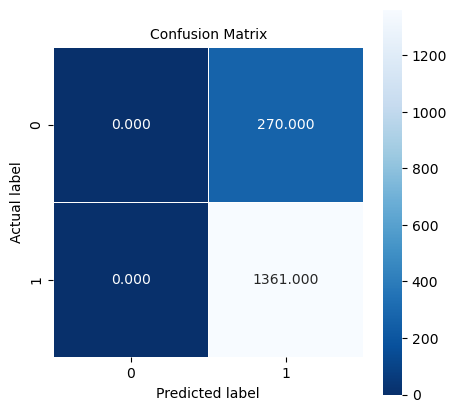

In [125]:
# Confusion matrix for the best model -> medium is always predicted
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import metrics

confusion_matrix = metrics.confusion_matrix(y_test, y_test_pred)

plt.figure(figsize=(5,5))
sns.heatmap(confusion_matrix, annot=True, fmt=".3f", linewidths=.5, square=True, cmap='Blues_r');
plt.ylabel('Actual label');
plt.xlabel('Predicted label');
plt.title('Confusion Matrix', size=10);

In [126]:
# Show classification report for the test data with the best model 
from sklearn.metrics import classification_report
print(classification_report(y_test, y_test_pred))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       270
           1       0.83      1.00      0.91      1361

    accuracy                           0.83      1631
   macro avg       0.42      0.50      0.45      1631
weighted avg       0.70      0.83      0.76      1631



In [127]:
from sklearn.model_selection import KFold, cross_val_score, GridSearchCV

# Check for overfitting using 10-fold cross-validation
kf = KFold(n_splits=10, shuffle=True, random_state=42)
cv_scores = cross_val_score(best_model, X, y, cv=kf)

print("Cross-validation scores:", cv_scores)
print("Mean cross-validation score:", cv_scores.mean())


Cross-validation scores: [0.84242424 0.85050505 0.80161943 0.83805668 0.82995951 0.82388664
 0.83603239 0.85425101 0.83805668 0.83198381]
Mean cross-validation score: 0.8346775446775447


Classification Report for Min Max Scaled Data with RandomOverSampler
              precision    recall  f1-score      support
0              0.812500  0.971599  0.884956  1338.000000
1              0.966162  0.783394  0.865231  1385.000000
accuracy       0.875872  0.875872  0.875872     0.875872
macro avg      0.889331  0.877496  0.875094  2723.000000
weighted avg   0.890657  0.875872  0.874923  2723.000000
Classification Report for Standard Scaled Data with RandomOverSampler
              precision    recall  f1-score      support
0              0.813008  0.971599  0.885257  1338.000000
1              0.966192  0.784116  0.865684  1385.000000
accuracy       0.876239  0.876239  0.876239     0.876239
macro avg      0.889600  0.877857  0.875470  2723.000000
weighted avg   0.890922  0.876239  0.875301  2723.000000


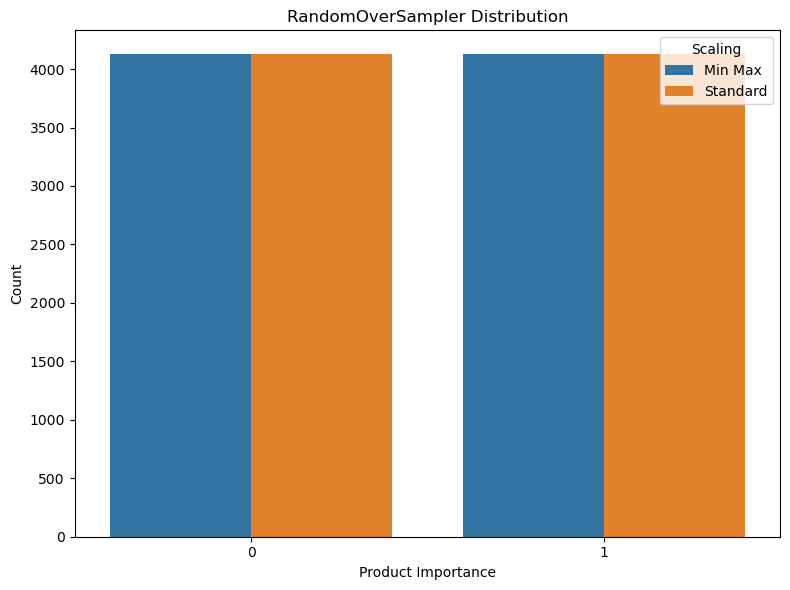

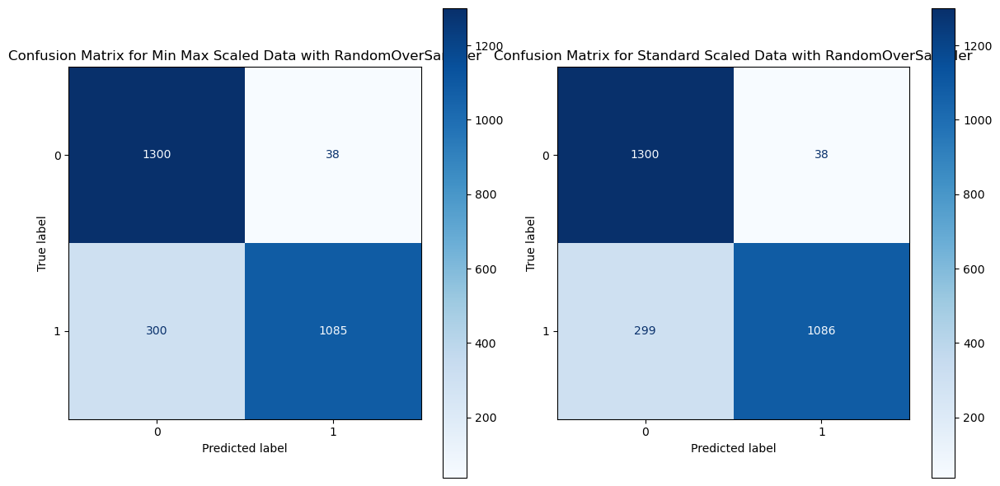

In [128]:
#Model for random oversampler and decision tree

import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
from imblearn.over_sampling import RandomOverSampler
import matplotlib.pyplot as plt
import seaborn as sns

# Over-Sampling using RandomOverSampler for df_min_max
X_min_max_randomoversampler = df_min_max.drop('Product_importance', axis=1)
y_min_max_randomoversampler = df_min_max['Product_importance']
randomoversampler_min_max = RandomOverSampler(random_state=42)
X_min_max_resampled_randomoversampler, y_min_max_resampled_randomoversampler = randomoversampler_min_max.fit_resample(X_min_max_randomoversampler, y_min_max_randomoversampler)

# Over-Sampling using RandomOverSampler for df_standard
X_standard_randomoversampler = df_standard.drop('Product_importance', axis=1)
y_standard_randomoversampler = df_standard['Product_importance']
randomoversampler_standard = RandomOverSampler(random_state=42)
X_standard_resampled_randomoversampler, y_standard_resampled_randomoversampler = randomoversampler_standard.fit_resample(X_standard_randomoversampler, y_standard_randomoversampler)

# Split data into training and test sets (2/3 train, 1/3 test)
X_train_min_max_randomoversampler, X_test_min_max_randomoversampler, y_train_min_max_randomoversampler, y_test_min_max_randomoversampler = train_test_split(X_min_max_resampled_randomoversampler, y_min_max_resampled_randomoversampler, test_size=0.33, random_state=42)
X_train_standard_randomoversampler, X_test_standard_randomoversampler, y_train_standard_randomoversampler, y_test_standard_randomoversampler = train_test_split(X_standard_resampled_randomoversampler, y_standard_resampled_randomoversampler, test_size=0.33, random_state=42)

# Train DecisionTreeClassifier for both datasets
clf_min_max_randomoversampler = DecisionTreeClassifier(random_state=42)
clf_min_max_randomoversampler.fit(X_train_min_max_randomoversampler, y_train_min_max_randomoversampler)
y_pred_min_max_randomoversampler = clf_min_max_randomoversampler.predict(X_test_min_max_randomoversampler)

clf_standard_randomoversampler = DecisionTreeClassifier(random_state=42)
clf_standard_randomoversampler.fit(X_train_standard_randomoversampler, y_train_standard_randomoversampler)
y_pred_standard_randomoversampler = clf_standard_randomoversampler.predict(X_test_standard_randomoversampler)

# Classification reports
report_min_max_randomoversampler = classification_report(y_test_min_max_randomoversampler, y_pred_min_max_randomoversampler, output_dict=True)
report_standard_randomoversampler = classification_report(y_test_standard_randomoversampler, y_pred_standard_randomoversampler, output_dict=True)

# Display classification reports
report_min_max_randomoversampler_df = pd.DataFrame(report_min_max_randomoversampler).transpose()
report_standard_randomoversampler_df = pd.DataFrame(report_standard_randomoversampler).transpose()

print("Classification Report for Min Max Scaled Data with RandomOverSampler")
print(report_min_max_randomoversampler_df)

print("Classification Report for Standard Scaled Data with RandomOverSampler")
print(report_standard_randomoversampler_df)

# Confusion Matrices
cm_min_max_randomoversampler = confusion_matrix(y_test_min_max_randomoversampler, y_pred_min_max_randomoversampler)
cm_standard_randomoversampler = confusion_matrix(y_test_standard_randomoversampler, y_pred_standard_randomoversampler)

# Plotting data distribution to match reference image
fig, ax = plt.subplots(1, 1, figsize=(8, 6))

# Create combined dataframe for better visualization
combined_resampled_randomoversampler_df = pd.concat([
    pd.DataFrame({'Product_importance': y_min_max_resampled_randomoversampler, 'Scaling': 'Min Max'}),
    pd.DataFrame({'Product_importance': y_standard_resampled_randomoversampler, 'Scaling': 'Standard'})
])

sns.countplot(data=combined_resampled_randomoversampler_df, x='Product_importance', hue='Scaling', ax=ax)
ax.set_title('RandomOverSampler Distribution')
ax.set_xlabel('Product Importance')
ax.set_ylabel('Count')

plt.tight_layout()
plt.show()

# Plotting confusion matrices with a different colormap
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

ConfusionMatrixDisplay(confusion_matrix=cm_min_max_randomoversampler).plot(ax=ax[0], cmap="Blues")
ax[0].set_title('Confusion Matrix for Min Max Scaled Data with RandomOverSampler')

ConfusionMatrixDisplay(confusion_matrix=cm_standard_randomoversampler).plot(ax=ax[1], cmap="Blues")
ax[1].set_title('Confusion Matrix for Standard Scaled Data with RandomOverSampler')

plt.tight_layout()
plt.show()

In [129]:
#Model for random oversampler and decision tree

best_model = clf_min_max_randomoversampler  
y_test = y_test_min_max_randomoversampler 
y_test_pred = y_pred_min_max_randomoversampler  
y_train = y_train_min_max_randomoversampler  
y_train_pred = best_model.predict(X_train_min_max_randomoversampler)

# Accuracy on test and training data 
test_accuracy = accuracy_score(y_test_min_max_randomoversampler, y_test_pred)
print("Accuracy on test data:", test_accuracy)

train_accuracy = accuracy_score(y_train_min_max_randomoversampler, y_train_pred)
print("Accuracy on training data:", train_accuracy)

Accuracy on test data: 0.8758721997796548
Accuracy on training data: 1.0


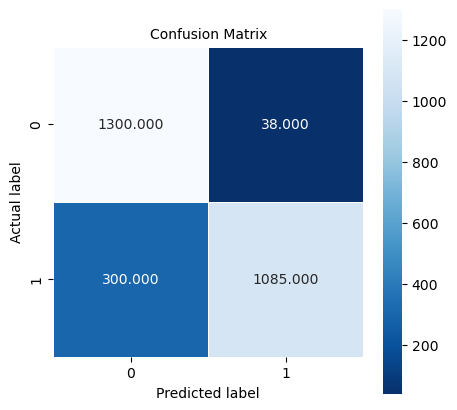

In [130]:
# Confusion Matrix  for random oversampler and decision tree
confusion_matrix = metrics.confusion_matrix(y_test, y_test_pred)

plt.figure(figsize=(5, 5))
sns.heatmap(confusion_matrix, annot=True, fmt=".3f", linewidths=.5, square=True, cmap='Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.title('Confusion Matrix', size=10)
plt.show()

In [131]:
#Cross-validation for random oversampler and decision tree

X = X_min_max_resampled_randomoversampler  
y = y_min_max_resampled_randomoversampler  

kf = KFold(n_splits=10, shuffle=True, random_state=42)
cv_scores = cross_val_score(best_model, X, y, cv=kf)

print("Cross-validation scores:", cv_scores)
print("Mean cross-validation score:", cv_scores.mean())

Cross-validation scores: [0.91515152 0.90181818 0.90181818 0.90666667 0.90787879 0.90545455
 0.90909091 0.91151515 0.90060606 0.92      ]
Mean cross-validation score: 0.908


Classification Report for Min Max Scaled Data with RandomOverSampler
              precision    recall  f1-score      support
0              0.917614  0.965620  0.941005  1338.000000
1              0.965019  0.916245  0.940000  1385.000000
accuracy       0.940507  0.940507  0.940507     0.940507
macro avg      0.941316  0.940933  0.940503  2723.000000
weighted avg   0.941725  0.940507  0.940494  2723.000000
Classification Report for Standard Scaled Data with RandomOverSampler
              precision    recall  f1-score      support
0              0.915663  0.965620  0.939978  1338.000000
1              0.964939  0.914079  0.938821  1385.000000
accuracy       0.939405  0.939405  0.939405     0.939405
macro avg      0.940301  0.939850  0.939400  2723.000000
weighted avg   0.940726  0.939405  0.939390  2723.000000


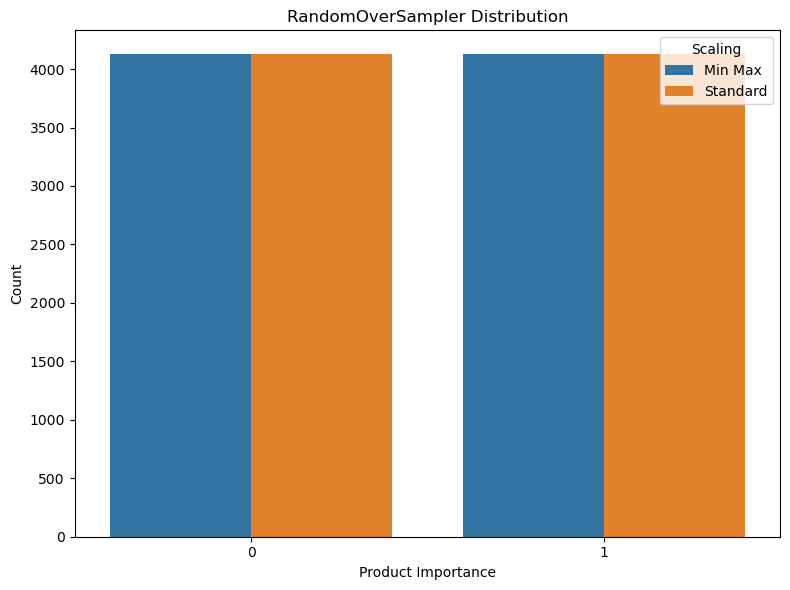

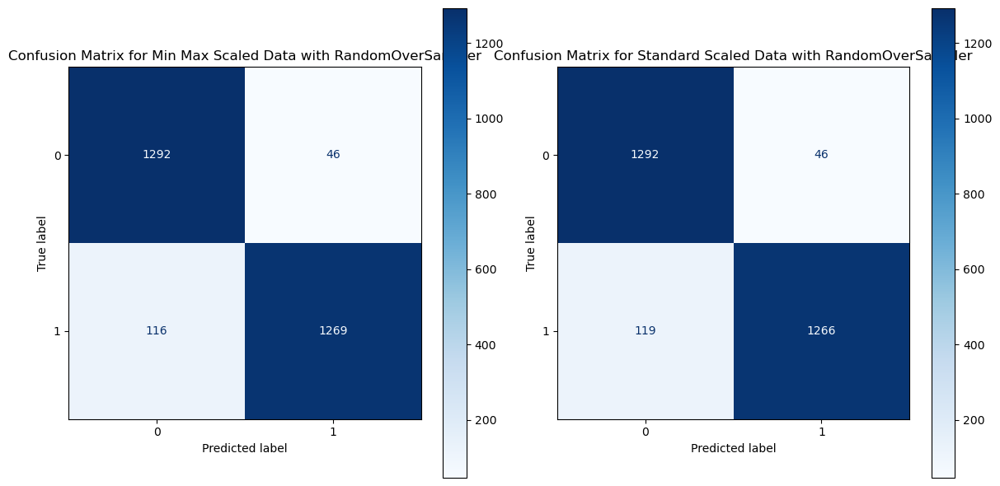

In [132]:
#Model for random oversampler and random forest classification 

import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
from imblearn.over_sampling import RandomOverSampler
import matplotlib.pyplot as plt
import seaborn as sns

# Over-Sampling using RandomOverSampler for df_min_max
X_min_max_randomoversampler = df_min_max.drop('Product_importance', axis=1)
y_min_max_randomoversampler = df_min_max['Product_importance']
randomoversampler_min_max = RandomOverSampler(random_state=42)
X_min_max_resampled_randomoversampler, y_min_max_resampled_randomoversampler = randomoversampler_min_max.fit_resample(X_min_max_randomoversampler, y_min_max_randomoversampler)

# Over-Sampling using RandomOverSampler for df_standard
X_standard_randomoversampler = df_standard.drop('Product_importance', axis=1)
y_standard_randomoversampler = df_standard['Product_importance']
randomoversampler_standard = RandomOverSampler(random_state=42)
X_standard_resampled_randomoversampler, y_standard_resampled_randomoversampler = randomoversampler_standard.fit_resample(X_standard_randomoversampler, y_standard_randomoversampler)

# Split data into training and test sets (2/3 train, 1/3 test)
X_train_min_max_randomoversampler, X_test_min_max_randomoversampler, y_train_min_max_randomoversampler, y_test_min_max_randomoversampler = train_test_split(X_min_max_resampled_randomoversampler, y_min_max_resampled_randomoversampler, test_size=0.33, random_state=42)
X_train_standard_randomoversampler, X_test_standard_randomoversampler, y_train_standard_randomoversampler, y_test_standard_randomoversampler = train_test_split(X_standard_resampled_randomoversampler, y_standard_resampled_randomoversampler, test_size=0.33, random_state=42)

# Train RandomForestClassifier for both datasets
clf_min_max_randomoversampler = RandomForestClassifier(random_state=42)
clf_min_max_randomoversampler.fit(X_train_min_max_randomoversampler, y_train_min_max_randomoversampler)
y_pred_min_max_randomoversampler = clf_min_max_randomoversampler.predict(X_test_min_max_randomoversampler)

clf_standard_randomoversampler = RandomForestClassifier(random_state=42)
clf_standard_randomoversampler.fit(X_train_standard_randomoversampler, y_train_standard_randomoversampler)
y_pred_standard_randomoversampler = clf_standard_randomoversampler.predict(X_test_standard_randomoversampler)

# Classification reports
report_min_max_randomoversampler = classification_report(y_test_min_max_randomoversampler, y_pred_min_max_randomoversampler, output_dict=True)
report_standard_randomoversampler = classification_report(y_test_standard_randomoversampler, y_pred_standard_randomoversampler, output_dict=True)

# Display classification reports
report_min_max_randomoversampler_df = pd.DataFrame(report_min_max_randomoversampler).transpose()
report_standard_randomoversampler_df = pd.DataFrame(report_standard_randomoversampler).transpose()

print("Classification Report for Min Max Scaled Data with RandomOverSampler")
print(report_min_max_randomoversampler_df)

print("Classification Report for Standard Scaled Data with RandomOverSampler")
print(report_standard_randomoversampler_df)

# Confusion Matrices
cm_min_max_randomoversampler = confusion_matrix(y_test_min_max_randomoversampler, y_pred_min_max_randomoversampler)
cm_standard_randomoversampler = confusion_matrix(y_test_standard_randomoversampler, y_pred_standard_randomoversampler)

# Plotting data distribution to match reference image
fig, ax = plt.subplots(1, 1, figsize=(8, 6))

# Create combined dataframe for better visualization
combined_resampled_randomoversampler_df = pd.concat([
    pd.DataFrame({'Product_importance': y_min_max_resampled_randomoversampler, 'Scaling': 'Min Max'}),
    pd.DataFrame({'Product_importance': y_standard_resampled_randomoversampler, 'Scaling': 'Standard'})
])

sns.countplot(data=combined_resampled_randomoversampler_df, x='Product_importance', hue='Scaling', ax=ax)
ax.set_title('RandomOverSampler Distribution')
ax.set_xlabel('Product Importance')
ax.set_ylabel('Count')

plt.tight_layout()
plt.show()

# Plotting confusion matrices with a different colormap
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

ConfusionMatrixDisplay(confusion_matrix=cm_min_max_randomoversampler).plot(ax=ax[0], cmap="Blues")
ax[0].set_title('Confusion Matrix for Min Max Scaled Data with RandomOverSampler')

ConfusionMatrixDisplay(confusion_matrix=cm_standard_randomoversampler).plot(ax=ax[1], cmap="Blues")
ax[1].set_title('Confusion Matrix for Standard Scaled Data with RandomOverSampler')

plt.tight_layout()
plt.show()

In [133]:
# Model for random oversampler and random forest classification -> Random Forest increases the accuracy
best_model = clf_min_max_randomoversampler  
y_test = y_test_min_max_randomoversampler 
y_test_pred = y_pred_min_max_randomoversampler  
y_train = y_train_min_max_randomoversampler  
y_train_pred = best_model.predict(X_train_min_max_randomoversampler)

# Accuracy on test and training data 
test_accuracy = accuracy_score(y_test_min_max_randomoversampler, y_test_pred)
print("Accuracy on test data:", test_accuracy)

train_accuracy = accuracy_score(y_train_min_max_randomoversampler, y_train_pred)
print("Accuracy on training data:", train_accuracy)

Accuracy on test data: 0.940506793977231
Accuracy on training data: 1.0


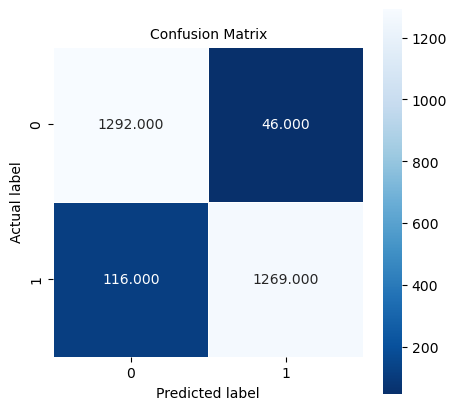

In [134]:
# Confusion matrix für random Oversampler and Random Forest Classification
confusion_matrix = metrics.confusion_matrix(y_test, y_test_pred)

plt.figure(figsize=(5, 5))
sns.heatmap(confusion_matrix, annot=True, fmt=".3f", linewidths=.5, square=True, cmap='Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.title('Confusion Matrix', size=10)
plt.show()

In [135]:
#Cross-validation for Random Oversampler and Random Forest Classification

X = X_min_max_resampled_randomoversampler  
y = y_min_max_resampled_randomoversampler  

kf = KFold(n_splits=10, shuffle=True, random_state=42)
cv_scores = cross_val_score(best_model, X, y, cv=kf)

print("Cross-validation scores:", cv_scores)
print("Mean cross-validation score:", cv_scores.mean())

Cross-validation scores: [0.98181818 0.96363636 0.96242424 0.96969697 0.97454545 0.9769697
 0.97454545 0.96848485 0.97818182 0.98060606]
Mean cross-validation score: 0.973090909090909


In [136]:
print(clf_standard_randomoversampler.get_params()) #cheking the parameters of the random Forest

{'bootstrap': True, 'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': 'sqrt', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'monotonic_cst': None, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': 42, 'verbose': 0, 'warm_start': False}


In [137]:
print(clf_min_max_randomoversampler.get_params()) #cheking the parameters of the random Forest

{'bootstrap': True, 'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': 'sqrt', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'monotonic_cst': None, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': 42, 'verbose': 0, 'warm_start': False}


In [138]:
# Trying other parameters Random Oversampling und Random Forest Classification ->worse results
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay, accuracy_score

# Customized parameters for the RandomForestClassifier
clf_min_max_randomoversampler = RandomForestClassifier(
    n_estimators=600,  
    max_depth=30,  
    min_samples_split=15,  
    min_samples_leaf=4,  
    random_state=42
)

clf_min_max_randomoversampler.fit(X_train_min_max_randomoversampler, y_train_min_max_randomoversampler)
y_pred_min_max_randomoversampler = clf_min_max_randomoversampler.predict(X_test_min_max_randomoversampler)

# Customized parameters for the RandomForestClassifier
clf_standard_randomoversampler = RandomForestClassifier(
    n_estimators=200,  
    max_depth=10,  
    min_samples_split=5,  
    min_samples_leaf=2,  
    random_state=42
)

clf_standard_randomoversampler.fit(X_train_standard_randomoversampler, y_train_standard_randomoversampler)
y_pred_standard_randomoversampler = clf_standard_randomoversampler.predict(X_test_standard_randomoversampler)

# Evaluation of the adapted model
report_min_max_randomoversampler = classification_report(y_test_min_max_randomoversampler, y_pred_min_max_randomoversampler, output_dict=True)
report_standard_randomoversampler = classification_report(y_test_standard_randomoversampler, y_pred_standard_randomoversampler, output_dict=True)

report_min_max_randomoversampler_df = pd.DataFrame(report_min_max_randomoversampler).transpose()
report_standard_randomoversampler_df = pd.DataFrame(report_standard_randomoversampler).transpose()

print("Classification Report for Min Max Scaled Data with Adjusted RandomForestClassifier")
print(report_min_max_randomoversampler_df)

print("Classification Report for Standard Scaled Data with Adjusted RandomForestClassifier")
print(report_standard_randomoversampler_df)

# Accuracy on training and test data
test_accuracy_min_max = accuracy_score(y_test_min_max_randomoversampler, y_pred_min_max_randomoversampler)
train_accuracy_min_max = accuracy_score(y_train_min_max_randomoversampler, clf_min_max_randomoversampler.predict(X_train_min_max_randomoversampler))
print("Min Max Scaled Data - Accuracy on test data:", test_accuracy_min_max)
print("Min Max Scaled Data - Accuracy on training data:", train_accuracy_min_max)

test_accuracy_standard = accuracy_score(y_test_standard_randomoversampler, y_pred_standard_randomoversampler)
train_accuracy_standard = accuracy_score(y_train_standard_randomoversampler, clf_standard_randomoversampler.predict(X_train_standard_randomoversampler))
print("Standard Scaled Data - Accuracy on test data:", test_accuracy_standard)
print("Standard Scaled Data - Accuracy on training data:", train_accuracy_standard)


Classification Report for Min Max Scaled Data with Adjusted RandomForestClassifier
              precision    recall  f1-score      support
0              0.843861  0.888640  0.865672  1338.000000
1              0.886606  0.841155  0.863283  1385.000000
accuracy       0.864488  0.864488  0.864488     0.864488
macro avg      0.865233  0.864897  0.864477  2723.000000
weighted avg   0.865602  0.864488  0.864457  2723.000000
Classification Report for Standard Scaled Data with Adjusted RandomForestClassifier
              precision    recall  f1-score      support
0              0.753788  0.892377  0.817248  1338.000000
1              0.873573  0.718412  0.788431  1385.000000
accuracy       0.803893  0.803893  0.803893     0.803893
macro avg      0.813681  0.805394  0.802840  2723.000000
weighted avg   0.814714  0.803893  0.802591  2723.000000
Min Max Scaled Data - Accuracy on test data: 0.8644876973925817
Min Max Scaled Data - Accuracy on training data: 0.9746698027863216
Standard Scaled D

Classification Report for Min Max Scaled Data with Undersampling
              precision    recall  f1-score     support
0              0.552124  0.518116  0.534579  276.000000
1              0.526690  0.560606  0.543119  264.000000
accuracy       0.538889  0.538889  0.538889    0.538889
macro avg      0.539407  0.539361  0.538849  540.000000
weighted avg   0.539690  0.538889  0.538754  540.000000
Classification Report for Standard Scaled Data with Undersampling
              precision    recall  f1-score     support
0              0.546875  0.507246  0.526316  276.000000
1              0.521127  0.560606  0.540146  264.000000
accuracy       0.533333  0.533333  0.533333    0.533333
macro avg      0.534001  0.533926  0.533231  540.000000
weighted avg   0.534287  0.533333  0.533077  540.000000


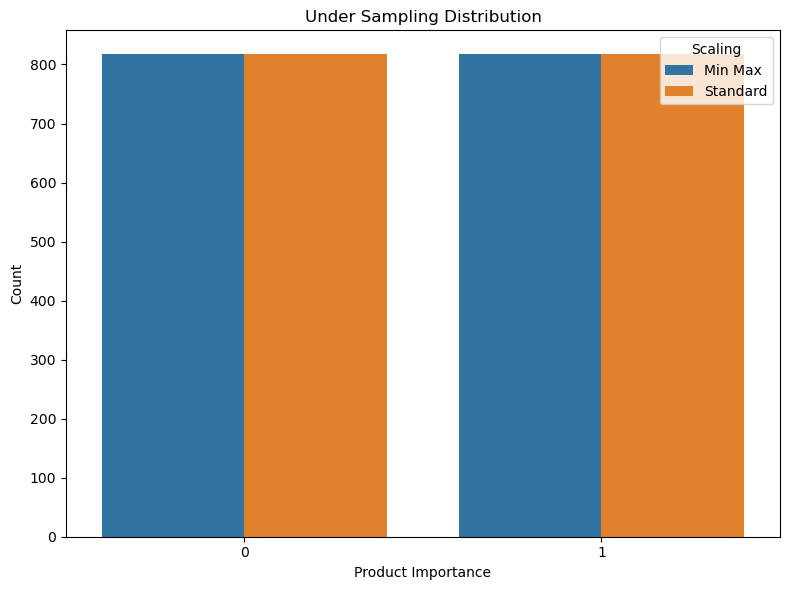

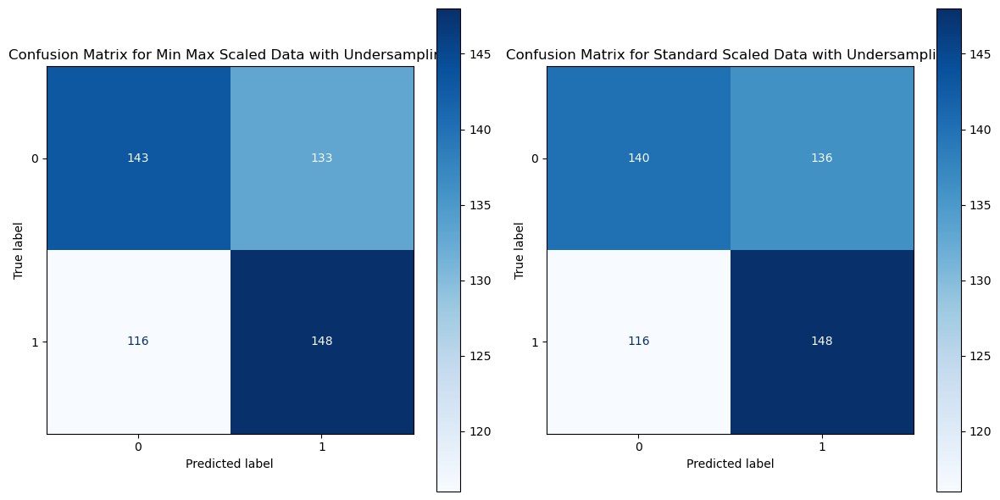

In [139]:
#Model for random Undersampling and Random Forest Classification
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
from imblearn.under_sampling import RandomUnderSampler
import matplotlib.pyplot as plt
import seaborn as sns

# Under-Sampling for df_min_max
X_min_max_undersample = df_min_max.drop('Product_importance', axis=1)
y_min_max_undersample = df_min_max['Product_importance']
rus_min_max = RandomUnderSampler(random_state=42)
X_min_max_resampled_undersample, y_min_max_resampled_undersample = rus_min_max.fit_resample(X_min_max_undersample, y_min_max_undersample)

# Under-Sampling for df_standard
X_standard_undersample = df_standard.drop('Product_importance', axis=1)
y_standard_undersample = df_standard['Product_importance']
rus_standard = RandomUnderSampler(random_state=42)
X_standard_resampled_undersample, y_standard_resampled_undersample = rus_standard.fit_resample(X_standard_undersample, y_standard_undersample)

# Split data into training and test sets (2/3 train, 1/3 test)
X_train_min_max_undersample, X_test_min_max_undersample, y_train_min_max_undersample, y_test_min_max_undersample = train_test_split(X_min_max_resampled_undersample, y_min_max_resampled_undersample, test_size=0.33, random_state=42)
X_train_standard_undersample, X_test_standard_undersample, y_train_standard_undersample, y_test_standard_undersample = train_test_split(X_standard_resampled_undersample, y_standard_resampled_undersample, test_size=0.33, random_state=42)

# Train RandomForestClassifier for both datasets
clf_min_max_undersample = RandomForestClassifier(random_state=42)
clf_min_max_undersample.fit(X_train_min_max_undersample, y_train_min_max_undersample)
y_pred_min_max_undersample = clf_min_max_undersample.predict(X_test_min_max_undersample)

clf_standard_undersample = RandomForestClassifier(random_state=42)
clf_standard_undersample.fit(X_train_standard_undersample, y_train_standard_undersample)
y_pred_standard_undersample = clf_standard_undersample.predict(X_test_standard_undersample)

# Classification reports
report_min_max_undersample = classification_report(y_test_min_max_undersample, y_pred_min_max_undersample, output_dict=True)
report_standard_undersample = classification_report(y_test_standard_undersample, y_pred_standard_undersample, output_dict=True)

# Display classification reports
report_min_max_undersample_df = pd.DataFrame(report_min_max_undersample).transpose()
report_standard_undersample_df = pd.DataFrame(report_standard_undersample).transpose()

print("Classification Report for Min Max Scaled Data with Undersampling")
print(report_min_max_undersample_df)

print("Classification Report for Standard Scaled Data with Undersampling")
print(report_standard_undersample_df)

# Confusion Matrices
cm_min_max_undersample = confusion_matrix(y_test_min_max_undersample, y_pred_min_max_undersample)
cm_standard_undersample = confusion_matrix(y_test_standard_undersample, y_pred_standard_undersample)

# Plotting data distribution to match reference image
fig, ax = plt.subplots(1, 1, figsize=(8, 6))

# Create combined dataframe for better visualization
combined_resampled_undersample = pd.concat([
    pd.DataFrame({'Product_importance': y_min_max_resampled_undersample, 'Scaling': 'Min Max'}),
    pd.DataFrame({'Product_importance': y_standard_resampled_undersample, 'Scaling': 'Standard'})
])

sns.countplot(data=combined_resampled_undersample, x='Product_importance', hue='Scaling', ax=ax)
ax.set_title('Under Sampling Distribution')
ax.set_xlabel('Product Importance')
ax.set_ylabel('Count')

plt.tight_layout()
plt.show()

# Plotting confusion matrices
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

ConfusionMatrixDisplay(confusion_matrix=cm_min_max_undersample).plot(ax=ax[0], cmap="Blues")
ax[0].set_title('Confusion Matrix for Min Max Scaled Data with Undersampling')

ConfusionMatrixDisplay(confusion_matrix=cm_standard_undersample).plot(ax=ax[1], cmap="Blues")
ax[1].set_title('Confusion Matrix for Standard Scaled Data with Undersampling')

plt.tight_layout()
plt.show()


In [140]:
#random Undersampling and Random Forest Classification
best_model = clf_min_max_undersample  
y_test = y_test_min_max_undersample  
y_test_pred = y_pred_min_max_undersample  
y_train = y_train_min_max_undersample  
y_train_pred = best_model.predict(X_train_min_max_undersample)  

# Calculate and output accuracy on the test data with the best model
test_accuracy = accuracy_score(y_test, y_test_pred)
print("Accuracy on test data:", test_accuracy)

# Calculate and output accuracy on the training data with the best model
train_accuracy = accuracy_score(y_train, y_train_pred)
print("Accuracy on training data:", train_accuracy)

Accuracy on test data: 0.5388888888888889
Accuracy on training data: 1.0


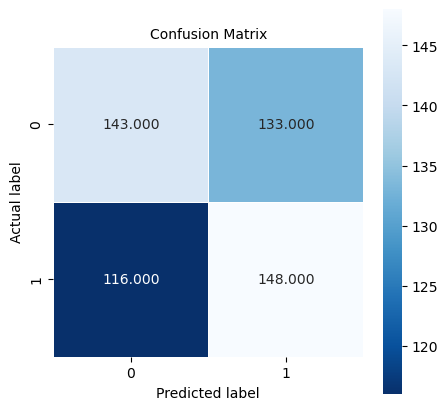

In [141]:
# Confusion Matrix für random Undersampling and Random Forest Classification
confusion_matrix = metrics.confusion_matrix(y_test, y_test_pred)

plt.figure(figsize=(5, 5))
sns.heatmap(confusion_matrix, annot=True, fmt=".3f", linewidths=.5, square=True, cmap='Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.title('Confusion Matrix', size=10)
plt.show()

In [142]:
#Model for random Undersampling and Random Forest Classification

# Check for overfitting using 10-fold cross-validation
X = X_min_max_resampled_undersample  
y = y_min_max_resampled_undersample  

kf = KFold(n_splits=10, shuffle=True, random_state=42)
cv_scores = cross_val_score(best_model, X, y, cv=kf)

print("Cross-validation scores:", cv_scores)
print("Mean cross-validation score:", cv_scores.mean())


Cross-validation scores: [0.50609756 0.52439024 0.56707317 0.5        0.54601227 0.60736196
 0.57668712 0.49693252 0.57055215 0.6196319 ]
Mean cross-validation score: 0.5514738889720185


Classification Report for Min Max Scaled Data with Undersampling
              precision    recall  f1-score     support
0              0.548148  0.536232  0.542125  276.000000
1              0.525926  0.537879  0.531835  264.000000
accuracy       0.537037  0.537037  0.537037    0.537037
macro avg      0.537037  0.537055  0.536980  540.000000
weighted avg   0.537284  0.537037  0.537094  540.000000
Classification Report for Standard Scaled Data with Undersampling
              precision    recall  f1-score     support
0              0.549815  0.539855  0.544790  276.000000
1              0.527881  0.537879  0.532833  264.000000
accuracy       0.538889  0.538889  0.538889    0.538889
macro avg      0.538848  0.538867  0.538811  540.000000
weighted avg   0.539092  0.538889  0.538944  540.000000


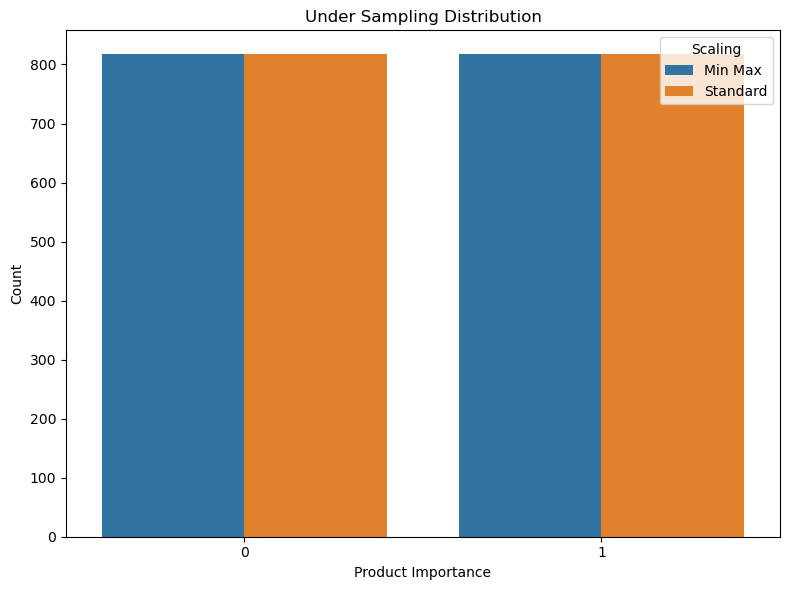

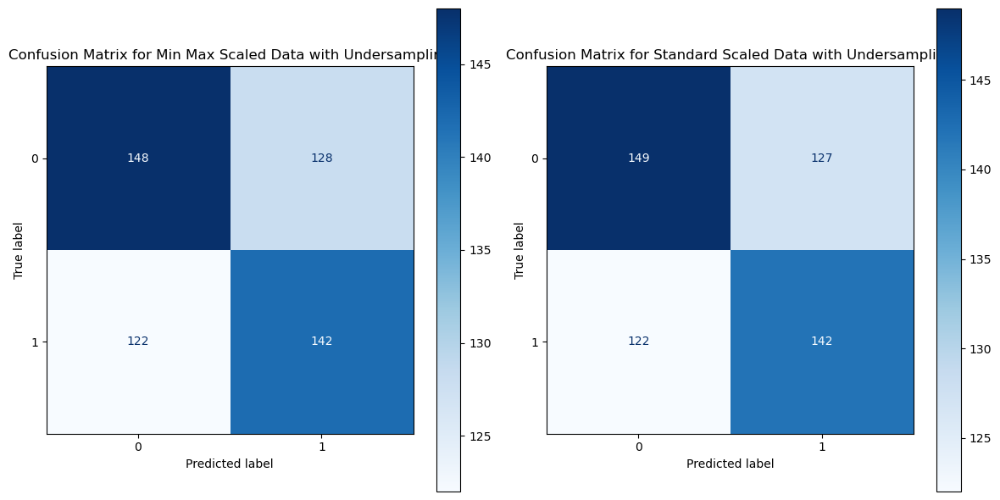

In [143]:
#Model for random Undersampling and Decision Tree Classification
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
from imblearn.under_sampling import RandomUnderSampler
import matplotlib.pyplot as plt
import seaborn as sns

# Under-Sampling for df_min_max
X_min_max_undersample = df_min_max.drop('Product_importance', axis=1)
y_min_max_undersample = df_min_max['Product_importance']
rus_min_max = RandomUnderSampler(random_state=42)
X_min_max_resampled_undersample, y_min_max_resampled_undersample = rus_min_max.fit_resample(X_min_max_undersample, y_min_max_undersample)

# Under-Sampling for df_standard
X_standard_undersample = df_standard.drop('Product_importance', axis=1)
y_standard_undersample = df_standard['Product_importance']
rus_standard = RandomUnderSampler(random_state=42)
X_standard_resampled_undersample, y_standard_resampled_undersample = rus_standard.fit_resample(X_standard_undersample, y_standard_undersample)

# Split data into training and test sets (2/3 train, 1/3 test)
X_train_min_max_undersample, X_test_min_max_undersample, y_train_min_max_undersample, y_test_min_max_undersample = train_test_split(X_min_max_resampled_undersample, y_min_max_resampled_undersample, test_size=0.33, random_state=42)
X_train_standard_undersample, X_test_standard_undersample, y_train_standard_undersample, y_test_standard_undersample = train_test_split(X_standard_resampled_undersample, y_standard_resampled_undersample, test_size=0.33, random_state=42)

# Train DecisionTreeClassifier for both datasets
clf_min_max_undersample = DecisionTreeClassifier(random_state=42)
clf_min_max_undersample.fit(X_train_min_max_undersample, y_train_min_max_undersample)
y_pred_min_max_undersample = clf_min_max_undersample.predict(X_test_min_max_undersample)

clf_standard_undersample = DecisionTreeClassifier(random_state=42)
clf_standard_undersample.fit(X_train_standard_undersample, y_train_standard_undersample)
y_pred_standard_undersample = clf_standard_undersample.predict(X_test_standard_undersample)

# Classification reports
report_min_max_undersample = classification_report(y_test_min_max_undersample, y_pred_min_max_undersample, output_dict=True)
report_standard_undersample = classification_report(y_test_standard_undersample, y_pred_standard_undersample, output_dict=True)

# Display classification reports
report_min_max_undersample_df = pd.DataFrame(report_min_max_undersample).transpose()
report_standard_undersample_df = pd.DataFrame(report_standard_undersample).transpose()

print("Classification Report for Min Max Scaled Data with Undersampling")
print(report_min_max_undersample_df)

print("Classification Report for Standard Scaled Data with Undersampling")
print(report_standard_undersample_df)

# Confusion Matrices
cm_min_max_undersample = confusion_matrix(y_test_min_max_undersample, y_pred_min_max_undersample)
cm_standard_undersample = confusion_matrix(y_test_standard_undersample, y_pred_standard_undersample)

# Plotting data distribution to match reference image
fig, ax = plt.subplots(1, 1, figsize=(8, 6))

# Create combined dataframe for better visualization
combined_resampled_undersample = pd.concat([
    pd.DataFrame({'Product_importance': y_min_max_resampled_undersample, 'Scaling': 'Min Max'}),
    pd.DataFrame({'Product_importance': y_standard_resampled_undersample, 'Scaling': 'Standard'})
])

sns.countplot(data=combined_resampled_undersample, x='Product_importance', hue='Scaling', ax=ax)
ax.set_title('Under Sampling Distribution')
ax.set_xlabel('Product Importance')
ax.set_ylabel('Count')

plt.tight_layout()
plt.show()

# Plotting confusion matrices
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

ConfusionMatrixDisplay(confusion_matrix=cm_min_max_undersample).plot(ax=ax[0], cmap="Blues")
ax[0].set_title('Confusion Matrix for Min Max Scaled Data with Undersampling')

ConfusionMatrixDisplay(confusion_matrix=cm_standard_undersample).plot(ax=ax[1], cmap="Blues")
ax[1].set_title('Confusion Matrix for Standard Scaled Data with Undersampling')

plt.tight_layout()
plt.show()

In [144]:
#for decision tree and undersampling -> poorer accuracy
best_model = clf_min_max_undersample
y_test = y_test_min_max_undersample 
y_test_pred = y_pred_min_max_undersample  
y_train = y_train_min_max_undersample
y_train_pred = best_model.predict(X_train_min_max_undersample)  

# Genauigkeit auf den Testdaten mit dem besten Modell berechnen und ausgeben
test_accuracy = accuracy_score(y_test, y_test_pred)
print("Accuracy on test data:", test_accuracy)

# Genauigkeit auf den Trainingsdaten mit dem besten Modell berechnen und ausgeben
train_accuracy = accuracy_score(y_train, y_train_pred)
print("Accuracy on training data:", train_accuracy)

Accuracy on test data: 0.5370370370370371
Accuracy on training data: 1.0


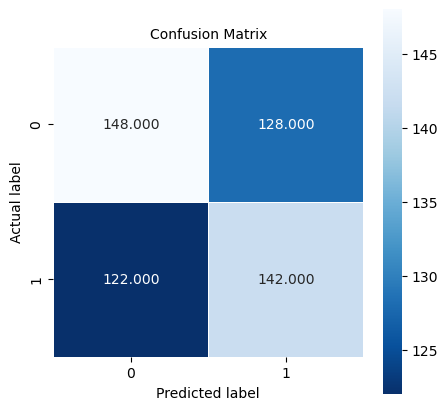

In [145]:
# Confusion Matrix for Decision Tree and Undersampling
confusion_matrix = metrics.confusion_matrix(y_test, y_test_pred)

plt.figure(figsize=(5, 5))
sns.heatmap(confusion_matrix, annot=True, fmt=".3f", linewidths=.5, square=True, cmap='Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.title('Confusion Matrix', size=10)
plt.show()

In [146]:
# Check for overfitting using 10-fold cross-validation for decision tree and undersampling
X = X_min_max_undersample  
y = y_min_max_undersample  

kf = KFold(n_splits=10, shuffle=True, random_state=42)
cv_scores = cross_val_score(best_model, X, y, cv=kf)

print("Cross-validation scores:", cv_scores)
print("Mean cross-validation score:", cv_scores.mean())

Cross-validation scores: [0.73535354 0.72121212 0.70445344 0.71052632 0.70850202 0.68016194
 0.74089069 0.71659919 0.71862348 0.70445344]
Mean cross-validation score: 0.7140776182881445


Classification Report for Min Max Scaled Data
              precision    recall  f1-score      support
0              0.935076  0.828849  0.878764  1338.000000
1              0.851008  0.944404  0.895277  1385.000000
accuracy       0.887624  0.887624  0.887624     0.887624
macro avg      0.893042  0.886627  0.887021  2723.000000
weighted avg   0.892317  0.887624  0.887163  2723.000000
Classification Report for Standard Scaled Data
              precision    recall  f1-score      support
0              0.909968  0.846039  0.876840  1338.000000
1              0.860717  0.919134  0.888966  1385.000000
accuracy       0.883217  0.883217  0.883217     0.883217
macro avg      0.885342  0.882586  0.882903  2723.000000
weighted avg   0.884917  0.883217  0.883008  2723.000000


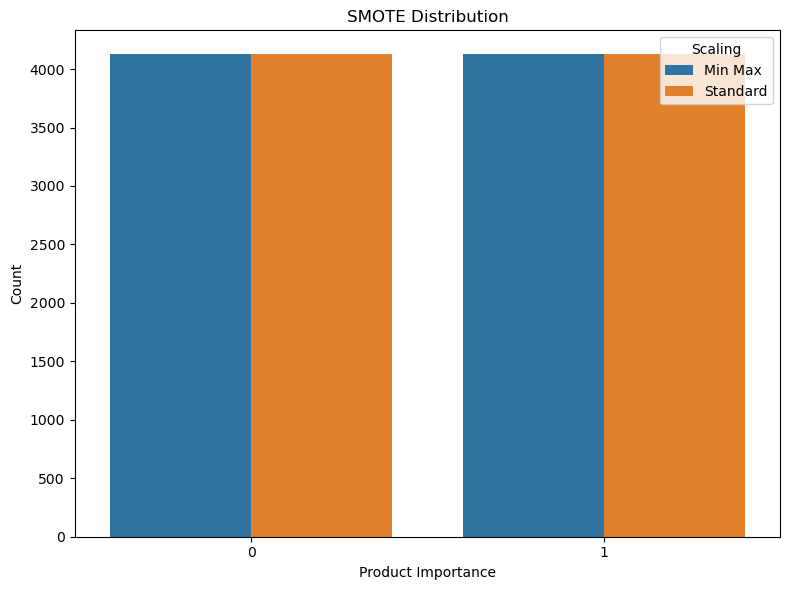

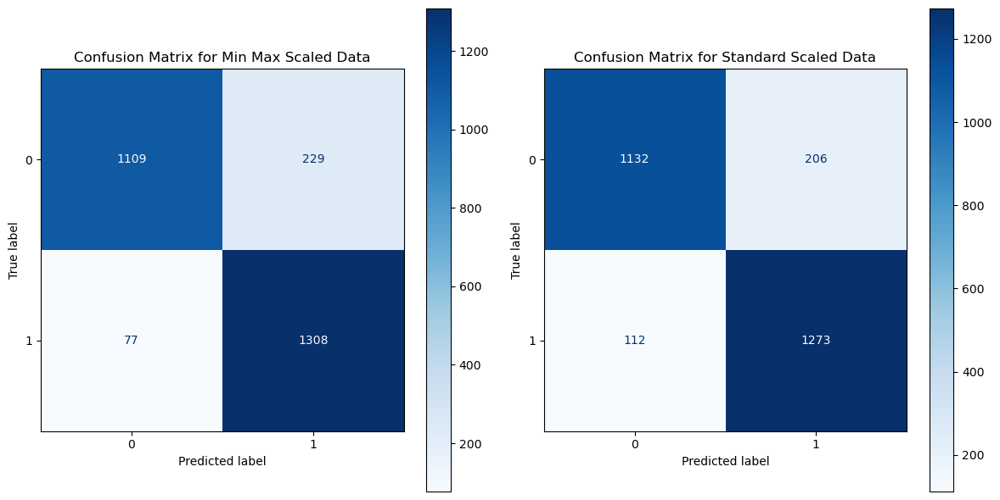

In [147]:
#Model for SMOTE and Random Forest Classifier
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt
import seaborn as sns

# Over-Sampling for df_min_max
X_min_max = df_min_max.drop('Product_importance', axis=1)
y_min_max = df_min_max['Product_importance']
smote_min_max = SMOTE(random_state=42)
X_min_max_resampled, y_min_max_resampled = smote_min_max.fit_resample(X_min_max, y_min_max)

# Over-Sampling for df_standard
X_standard = df_standard.drop('Product_importance', axis=1)
y_standard = df_standard['Product_importance']
smote_standard = SMOTE(random_state=42)
X_standard_resampled, y_standard_resampled = smote_standard.fit_resample(X_standard, y_standard)

# Split data into training and test sets (2/3 train, 1/3 test)
X_train_min_max, X_test_min_max, y_train_min_max, y_test_min_max = train_test_split(X_min_max_resampled, y_min_max_resampled, test_size=0.33, random_state=42)
X_train_standard, X_test_standard, y_train_standard, y_test_standard = train_test_split(X_standard_resampled, y_standard_resampled, test_size=0.33, random_state=42)

# Train RandomForestClassifier for both datasets
clf_min_max = RandomForestClassifier(random_state=42)
clf_min_max.fit(X_train_min_max, y_train_min_max)
y_pred_min_max = clf_min_max.predict(X_test_min_max)

clf_standard = RandomForestClassifier(random_state=42)
clf_standard.fit(X_train_standard, y_train_standard)
y_pred_standard = clf_standard.predict(X_test_standard)

# Classification reports
report_min_max = classification_report(y_test_min_max, y_pred_min_max, output_dict=True)
report_standard = classification_report(y_test_standard, y_pred_standard, output_dict=True)

# Display classification reports
report_min_max_df = pd.DataFrame(report_min_max).transpose()
report_standard_df = pd.DataFrame(report_standard).transpose()

print("Classification Report for Min Max Scaled Data")
print(report_min_max_df)

print("Classification Report for Standard Scaled Data")
print(report_standard_df)

# Confusion Matrices
cm_min_max = confusion_matrix(y_test_min_max, y_pred_min_max)
cm_standard = confusion_matrix(y_test_standard, y_pred_standard)

# Plotting data distribution to match reference image
fig, ax = plt.subplots(1, 1, figsize=(8, 6))

# Create combined dataframe for better visualization
combined_resampled_df = pd.concat([
    pd.DataFrame({'Product_importance': y_min_max_resampled, 'Scaling': 'Min Max'}),
    pd.DataFrame({'Product_importance': y_standard_resampled, 'Scaling': 'Standard'})
])

sns.countplot(data=combined_resampled_df, x='Product_importance', hue='Scaling', ax=ax)
ax.set_title('SMOTE Distribution')
ax.set_xlabel('Product Importance')
ax.set_ylabel('Count')

plt.tight_layout()
plt.show()

# Plotting confusion matrices
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

ConfusionMatrixDisplay(confusion_matrix=cm_min_max).plot(ax=ax[0], cmap="Blues")
ax[0].set_title('Confusion Matrix for Min Max Scaled Data')

ConfusionMatrixDisplay(confusion_matrix=cm_standard).plot(ax=ax[1], cmap="Blues")
ax[1].set_title('Confusion Matrix for Standard Scaled Data')

plt.tight_layout()
plt.show()


In [148]:
#Model SMOTE and Random Forest Classifier
best_model = clf_min_max  
y_test = y_test_min_max  
y_test_pred = y_pred_min_max  
y_train = y_train_min_max  
y_train_pred = best_model.predict(X_train_min_max)  

# Accuracy on test data
test_accuracy = accuracy_score(y_test, y_test_pred)
print("Accuracy on test data:", test_accuracy)

# Accuracy on training data
train_accuracy = accuracy_score(y_train, y_train_pred)
print("Accuracy on training data:", train_accuracy)

Accuracy on test data: 0.8876239441792141
Accuracy on training data: 1.0


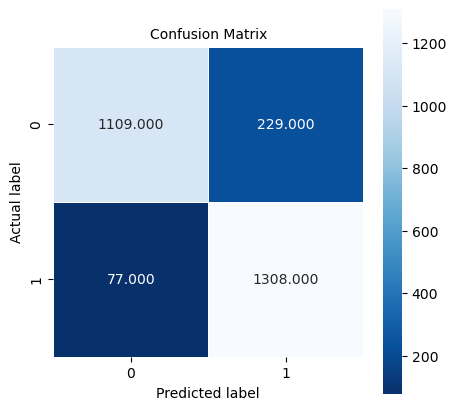

In [149]:
# Confusions Matrix for SMOTE and Random Forest Classifier
confusion_matrix = metrics.confusion_matrix(y_test, y_test_pred)

plt.figure(figsize=(5, 5))
sns.heatmap(confusion_matrix, annot=True, fmt=".3f", linewidths=.5, square=True, cmap='Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.title('Confusion Matrix', size=10)
plt.show()

In [150]:
# Model for SMOTE und random Froest Classification

# Check for overfitting using 10-fold cross-validation
X = X_min_max_resampled  
y = y_min_max_resampled  

kf = KFold(n_splits=10, shuffle=True, random_state=42)
cv_scores = cross_val_score(best_model, X, y, cv=kf)

print("Cross-validation scores:", cv_scores)
print("Mean cross-validation score:", cv_scores.mean())

Cross-validation scores: [0.89818182 0.88969697 0.88848485 0.86787879 0.90545455 0.88848485
 0.89090909 0.88727273 0.89454545 0.90060606]
Mean cross-validation score: 0.8911515151515152


Classification Report for Min Max Scaled Data
              precision    recall  f1-score      support
0              0.799857  0.833333  0.816252  1338.000000
1              0.832205  0.798556  0.815033  1385.000000
accuracy       0.815645  0.815645  0.815645     0.815645
macro avg      0.816031  0.815945  0.815642  2723.000000
weighted avg   0.816310  0.815645  0.815632  2723.000000
Classification Report for Standard Scaled Data
              precision    recall  f1-score      support
0              0.796659  0.819880  0.808103  1338.000000
1              0.820951  0.797834  0.809227  1385.000000
accuracy       0.808667  0.808667  0.808667     0.808667
macro avg      0.808805  0.808857  0.808665  2723.000000
weighted avg   0.809015  0.808667  0.808675  2723.000000


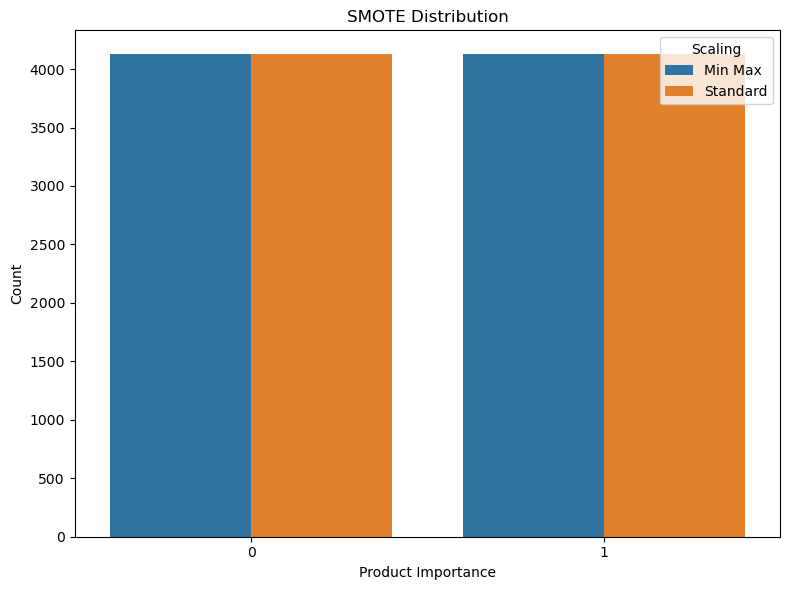

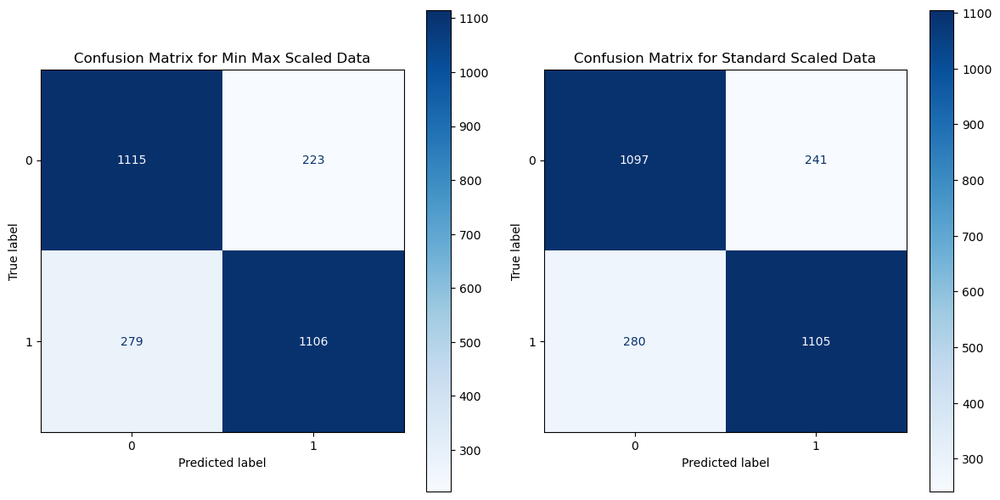

In [151]:
#Model for SMOTE and Decision Tree
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier  
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt
import seaborn as sns


# Over-Sampling for df_min_max
X_min_max = df_min_max.drop('Product_importance', axis=1)
y_min_max = df_min_max['Product_importance']
smote_min_max = SMOTE(random_state=42)
X_min_max_resampled, y_min_max_resampled = smote_min_max.fit_resample(X_min_max, y_min_max)

# Over-Sampling for df_standard
X_standard = df_standard.drop('Product_importance', axis=1)
y_standard = df_standard['Product_importance']
smote_standard = SMOTE(random_state=42)
X_standard_resampled, y_standard_resampled = smote_standard.fit_resample(X_standard, y_standard)

# Split data into training and test sets (2/3 train, 1/3 test)
X_train_min_max, X_test_min_max, y_train_min_max, y_test_min_max = train_test_split(X_min_max_resampled, y_min_max_resampled, test_size=0.33, random_state=42)
X_train_standard, X_test_standard, y_train_standard, y_test_standard = train_test_split(X_standard_resampled, y_standard_resampled, test_size=0.33, random_state=42)

# Train DecisionTreeClassifier for both datasets
clf_min_max = DecisionTreeClassifier(random_state=42)  # Verwendung des Entscheidungsbaum-Modells
clf_min_max.fit(X_train_min_max, y_train_min_max)
y_pred_min_max = clf_min_max.predict(X_test_min_max)

clf_standard = DecisionTreeClassifier(random_state=42)  # Verwendung des Entscheidungsbaum-Modells
clf_standard.fit(X_train_standard, y_train_standard)
y_pred_standard = clf_standard.predict(X_test_standard)

# Classification reports
report_min_max = classification_report(y_test_min_max, y_pred_min_max, output_dict=True)
report_standard = classification_report(y_test_standard, y_pred_standard, output_dict=True)

# Display classification reports
report_min_max_df = pd.DataFrame(report_min_max).transpose()
report_standard_df = pd.DataFrame(report_standard).transpose()

print("Classification Report for Min Max Scaled Data")
print(report_min_max_df)

print("Classification Report for Standard Scaled Data")
print(report_standard_df)

# Confusion Matrices
cm_min_max = confusion_matrix(y_test_min_max, y_pred_min_max)
cm_standard = confusion_matrix(y_test_standard, y_pred_standard)

# Plotting data distribution to match reference image
fig, ax = plt.subplots(1, 1, figsize=(8, 6))

# Create combined dataframe for better visualization
combined_resampled_df = pd.concat([
    pd.DataFrame({'Product_importance': y_min_max_resampled, 'Scaling': 'Min Max'}),
    pd.DataFrame({'Product_importance': y_standard_resampled, 'Scaling': 'Standard'})
])

sns.countplot(data=combined_resampled_df, x='Product_importance', hue='Scaling', ax=ax)
ax.set_title('SMOTE Distribution')
ax.set_xlabel('Product Importance')
ax.set_ylabel('Count')

plt.tight_layout()
plt.show()

# Plotting confusion matrices
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

ConfusionMatrixDisplay(confusion_matrix=cm_min_max).plot(ax=ax[0], cmap="Blues")
ax[0].set_title('Confusion Matrix for Min Max Scaled Data')

ConfusionMatrixDisplay(confusion_matrix=cm_standard).plot(ax=ax[1], cmap="Blues")
ax[1].set_title('Confusion Matrix for Standard Scaled Data')

plt.tight_layout()
plt.show()


In [152]:
#for Decision Tree and SMOTE -> poorer accuracy
best_model = clf_min_max 
y_test = y_test_min_max  
y_test_pred = y_pred_min_max  
y_train = y_train_min_max 
y_train_pred = best_model.predict(X_train_min_max)  

# Calculate and output accuracy on the test data 
test_accuracy = accuracy_score(y_test, y_test_pred)
print("Accuracy on test data:", test_accuracy)

# Calculate and output accuracy on the training data
train_accuracy = accuracy_score(y_train, y_train_pred)
print("Accuracy on training data:", train_accuracy)

Accuracy on test data: 0.8156445097319134
Accuracy on training data: 1.0


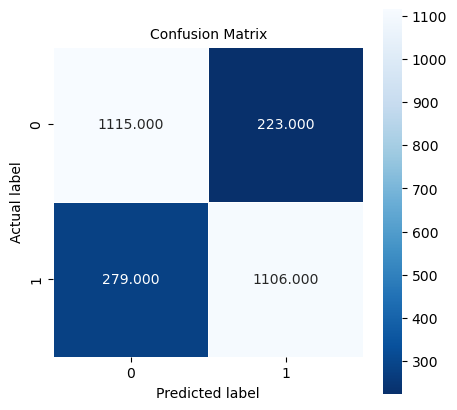

In [153]:
# Confusions Matrix for Decision Tree and SMOTE
confusion_matrix = metrics.confusion_matrix(y_test, y_test_pred)

plt.figure(figsize=(5, 5))
sns.heatmap(confusion_matrix, annot=True, fmt=".3f", linewidths=.5, square=True, cmap='Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.title('Confusion Matrix', size=10)
plt.show()

In [154]:
# Check for overfitting using 10-fold cross-validation for Decision Tree and SMOTE
X = X_min_max_resampled  
y = y_min_max_resampled  

kf = KFold(n_splits=10, shuffle=True, random_state=42)
cv_scores = cross_val_score(best_model, X, y, cv=kf)

print("Cross-validation scores:", cv_scores)
print("Mean cross-validation score:", cv_scores.mean())

Cross-validation scores: [0.82666667 0.79636364 0.81575758 0.80242424 0.80484848 0.81939394
 0.78787879 0.80969697 0.8169697  0.81575758]
Mean cross-validation score: 0.8095757575757576


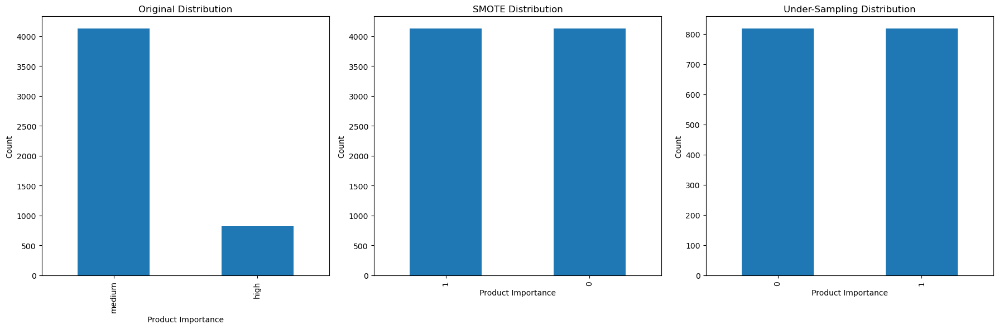

In [155]:
#Comparison of the distribution of the target variable

# Original distribution
fig, ax = plt.subplots(1, 3, figsize=(18, 6))
df_new_ohne_low['Product_importance'].value_counts().plot.bar(ax=ax[0], title='Original Distribution')
ax[0].set_ylabel('Count')
ax[0].set_xlabel('Product Importance')

# Over-Sampling mit SMOTE
smote = SMOTE(random_state=42)
X_min_max_resampled, y_min_max_resampled = smote.fit_resample(X_min_max, y_min_max)
pd.Series(y_min_max_resampled).value_counts().plot.bar(ax=ax[1], title='SMOTE Distribution')
ax[1].set_ylabel('Count')
ax[1].set_xlabel('Product Importance')

# Under-Sampling
rus = RandomUnderSampler(random_state=42)
X_min_max_resampled, y_min_max_resampled = rus.fit_resample(X_min_max, y_min_max)
pd.Series(y_min_max_resampled).value_counts().plot.bar(ax=ax[2], title='Under-Sampling Distribution')
ax[2].set_ylabel('Count')
ax[2].set_xlabel('Product Importance')

plt.tight_layout()
plt.show()


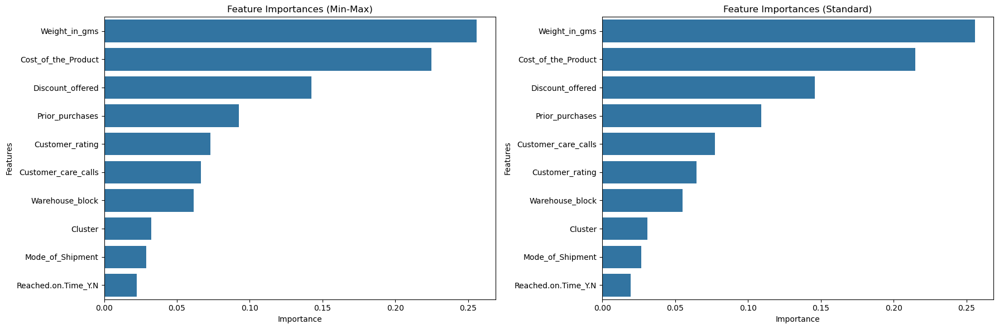

In [156]:
#Feature Importance for Oversampling and Random Forest Classification

import numpy as np

# Extract feature importances from the trained models
importances_min_max = clf_min_max_randomoversampler.feature_importances_
importances_standard = clf_standard_randomoversampler.feature_importances_

# Get feature names (assuming they are the same for both)
features = X_min_max_resampled_randomoversampler.columns

# Sort indices by importance
indices_min_max = np.argsort(importances_min_max)[::-1]
indices_standard = np.argsort(importances_standard)[::-1]

# Plotting
fig, ax = plt.subplots(1, 2, figsize=(18, 6))

# Feature Importances (Min-Max)
sns.barplot(x=importances_min_max[indices_min_max], y=features[indices_min_max], ax=ax[0])
ax[0].set_title('Feature Importances (Min-Max)')
ax[0].set_xlabel('Importance')
ax[0].set_ylabel('Features')

# Feature Importances (Standard)
sns.barplot(x=importances_standard[indices_standard], y=features[indices_standard], ax=ax[1])
ax[1].set_title('Feature Importances (Standard)')
ax[1].set_xlabel('Importance')
ax[1].set_ylabel('Features')

plt.tight_layout()
plt.show()


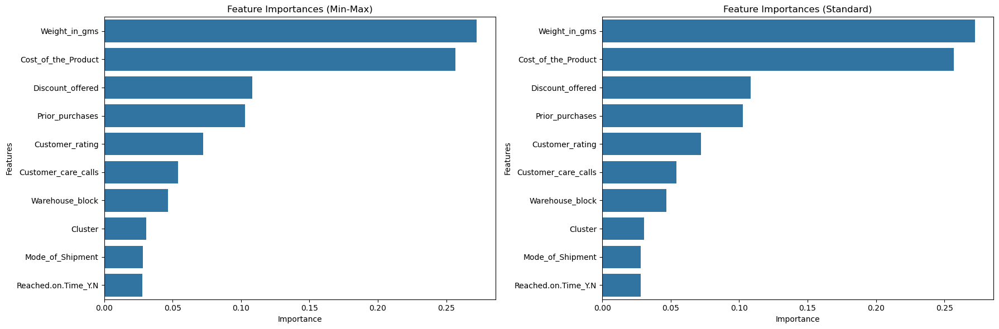

In [157]:
#Feature Importance for Oversampling and Decision Tree

# Over-Sampling using RandomOverSampler for df_min_max
X_min_max_randomoversampler = df_min_max.drop('Product_importance', axis=1)
y_min_max_randomoversampler = df_min_max['Product_importance']
randomoversampler_min_max = RandomOverSampler(random_state=42)
X_min_max_resampled_randomoversampler, y_min_max_resampled_randomoversampler = randomoversampler_min_max.fit_resample(X_min_max_randomoversampler, y_min_max_randomoversampler)

# Over-Sampling using RandomOverSampler for df_standard
X_standard_randomoversampler = df_standard.drop('Product_importance', axis=1)
y_standard_randomoversampler = df_standard['Product_importance']
randomoversampler_standard = RandomOverSampler(random_state=42)
X_standard_resampled_randomoversampler, y_standard_resampled_randomoversampler = randomoversampler_standard.fit_resample(X_standard_randomoversampler, y_standard_randomoversampler)

# Split data into training and test sets (2/3 train, 1/3 test)
X_train_min_max_randomoversampler, X_test_min_max_randomoversampler, y_train_min_max_randomoversampler, y_test_min_max_randomoversampler = train_test_split(X_min_max_resampled_randomoversampler, y_min_max_resampled_randomoversampler, test_size=0.33, random_state=42)
X_train_standard_randomoversampler, X_test_standard_randomoversampler, y_train_standard_randomoversampler, y_test_standard_randomoversampler = train_test_split(X_standard_resampled_randomoversampler, y_standard_resampled_randomoversampler, test_size=0.33, random_state=42)

# Train DecisionTreeClassifier for both datasets
dt_min_max_randomoversampler = DecisionTreeClassifier(random_state=42)
dt_min_max_randomoversampler.fit(X_train_min_max_randomoversampler, y_train_min_max_randomoversampler)

dt_standard_randomoversampler = DecisionTreeClassifier(random_state=42)
dt_standard_randomoversampler.fit(X_train_standard_randomoversampler, y_train_standard_randomoversampler)

# Extract feature importances
importances_min_max = dt_min_max_randomoversampler.feature_importances_
importances_standard = dt_standard_randomoversampler.feature_importances_

# Get feature names (assuming they are the same for both)
features = X_min_max_resampled_randomoversampler.columns

# Sort indices by importance
indices_min_max = np.argsort(importances_min_max)[::-1]
indices_standard = np.argsort(importances_standard)[::-1]

# Plotting
fig, ax = plt.subplots(1, 2, figsize=(18, 6))

# Feature Importances (Min-Max)
sns.barplot(x=importances_min_max[indices_min_max], y=features[indices_min_max], ax=ax[0])
ax[0].set_title('Feature Importances (Min-Max)')
ax[0].set_xlabel('Importance')
ax[0].set_ylabel('Features')

# Feature Importances (Standard)
sns.barplot(x=importances_standard[indices_standard], y=features[indices_standard], ax=ax[1])
ax[1].set_title('Feature Importances (Standard)')
ax[1].set_xlabel('Importance')
ax[1].set_ylabel('Features')

plt.tight_layout()
plt.show()


In [158]:
#Delete Attributes with the lowest feature importance
df_min_max_new =df_min_max.copy()
df_min_max_new =df_min_max.drop(columns=["Reached.on.Time_Y.N","Mode_of_Shipment",])

df_standard_new =df_standard.copy()
df_standard_new =df_standard.drop(columns=["Reached.on.Time_Y.N","Mode_of_Shipment"])



Classification Report for Min Max Scaled Data with RandomOverSampler
              precision    recall  f1-score      support
0              0.915954  0.961136  0.938001  1338.000000
1              0.960576  0.914801  0.937130  1385.000000
accuracy       0.937569  0.937569  0.937569     0.937569
macro avg      0.938265  0.937969  0.937566  2723.000000
weighted avg   0.938650  0.937569  0.937558  2723.000000
Classification Report for Standard Scaled Data with RandomOverSampler
              precision    recall  f1-score      support
0              0.916607  0.961136  0.938344  1338.000000
1              0.960606  0.915523  0.937523  1385.000000
accuracy       0.937936  0.937936  0.937936     0.937936
macro avg      0.938607  0.938330  0.937933  2723.000000
weighted avg   0.938986  0.937936  0.937926  2723.000000


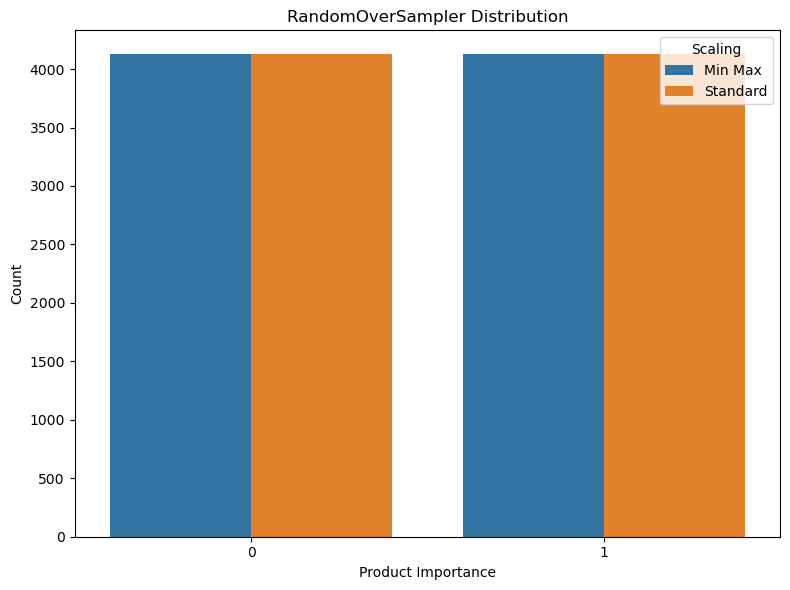

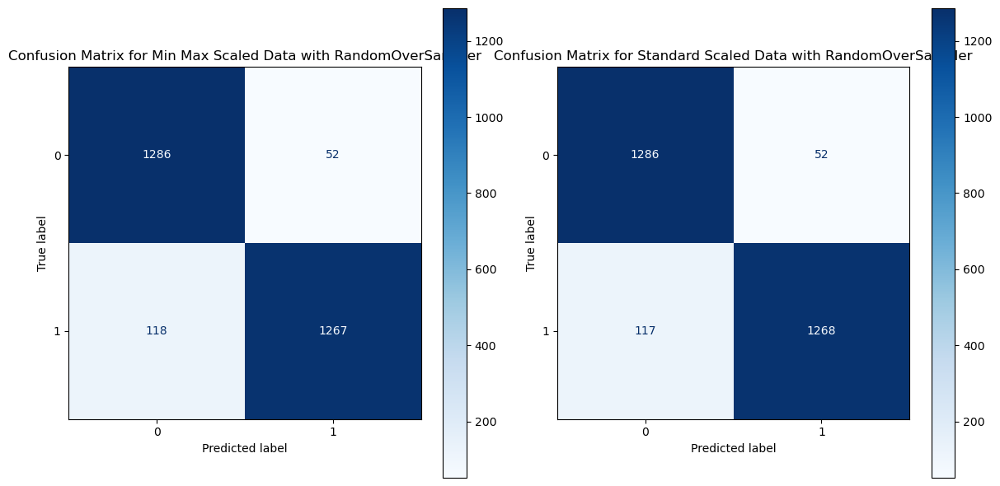

In [159]:
#Model for random Oversampler and Random Forest Classification without Cluster and Reached on Time

import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
from imblearn.over_sampling import RandomOverSampler
import matplotlib.pyplot as plt
import seaborn as sns

# Over-Sampling using RandomOverSampler for df_min_max
X_min_max_randomoversampler = df_min_max_new.drop('Product_importance', axis=1)
y_min_max_randomoversampler = df_min_max_new['Product_importance']
randomoversampler_min_max = RandomOverSampler(random_state=42)
X_min_max_resampled_randomoversampler, y_min_max_resampled_randomoversampler = randomoversampler_min_max.fit_resample(X_min_max_randomoversampler, y_min_max_randomoversampler)

# Over-Sampling using RandomOverSampler for df_standard
X_standard_randomoversampler = df_standard_new.drop('Product_importance', axis=1)
y_standard_randomoversampler = df_standard_new['Product_importance']
randomoversampler_standard = RandomOverSampler(random_state=42)
X_standard_resampled_randomoversampler, y_standard_resampled_randomoversampler = randomoversampler_standard.fit_resample(X_standard_randomoversampler, y_standard_randomoversampler)

# Split data into training and test sets (2/3 train, 1/3 test)
X_train_min_max_randomoversampler, X_test_min_max_randomoversampler, y_train_min_max_randomoversampler, y_test_min_max_randomoversampler = train_test_split(X_min_max_resampled_randomoversampler, y_min_max_resampled_randomoversampler, test_size=0.33, random_state=42)
X_train_standard_randomoversampler, X_test_standard_randomoversampler, y_train_standard_randomoversampler, y_test_standard_randomoversampler = train_test_split(X_standard_resampled_randomoversampler, y_standard_resampled_randomoversampler, test_size=0.33, random_state=42)

# Train RandomForestClassifier for both datasets
clf_min_max_randomoversampler = RandomForestClassifier(random_state=42)
clf_min_max_randomoversampler.fit(X_train_min_max_randomoversampler, y_train_min_max_randomoversampler)
y_pred_min_max_randomoversampler = clf_min_max_randomoversampler.predict(X_test_min_max_randomoversampler)

clf_standard_randomoversampler = RandomForestClassifier(random_state=42)
clf_standard_randomoversampler.fit(X_train_standard_randomoversampler, y_train_standard_randomoversampler)
y_pred_standard_randomoversampler = clf_standard_randomoversampler.predict(X_test_standard_randomoversampler)

# Classification reports
report_min_max_randomoversampler = classification_report(y_test_min_max_randomoversampler, y_pred_min_max_randomoversampler, output_dict=True)
report_standard_randomoversampler = classification_report(y_test_standard_randomoversampler, y_pred_standard_randomoversampler, output_dict=True)

# Display classification reports
report_min_max_randomoversampler_df = pd.DataFrame(report_min_max_randomoversampler).transpose()
report_standard_randomoversampler_df = pd.DataFrame(report_standard_randomoversampler).transpose()

print("Classification Report for Min Max Scaled Data with RandomOverSampler")
print(report_min_max_randomoversampler_df)

print("Classification Report for Standard Scaled Data with RandomOverSampler")
print(report_standard_randomoversampler_df)

# Confusion Matrices
cm_min_max_randomoversampler = confusion_matrix(y_test_min_max_randomoversampler, y_pred_min_max_randomoversampler)
cm_standard_randomoversampler = confusion_matrix(y_test_standard_randomoversampler, y_pred_standard_randomoversampler)

# Plotting data distribution to match reference image
fig, ax = plt.subplots(1, 1, figsize=(8, 6))

# Create combined dataframe for better visualization
combined_resampled_randomoversampler_df = pd.concat([
    pd.DataFrame({'Product_importance': y_min_max_resampled_randomoversampler, 'Scaling': 'Min Max'}),
    pd.DataFrame({'Product_importance': y_standard_resampled_randomoversampler, 'Scaling': 'Standard'})
])

sns.countplot(data=combined_resampled_randomoversampler_df, x='Product_importance', hue='Scaling', ax=ax)
ax.set_title('RandomOverSampler Distribution')
ax.set_xlabel('Product Importance')
ax.set_ylabel('Count')

plt.tight_layout()
plt.show()

# Plotting confusion matrices with a different colormap
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

ConfusionMatrixDisplay(confusion_matrix=cm_min_max_randomoversampler).plot(ax=ax[0], cmap="Blues")
ax[0].set_title('Confusion Matrix for Min Max Scaled Data with RandomOverSampler')

ConfusionMatrixDisplay(confusion_matrix=cm_standard_randomoversampler).plot(ax=ax[1], cmap="Blues")
ax[1].set_title('Confusion Matrix for Standard Scaled Data with RandomOverSampler')

plt.tight_layout()
plt.show()

In [160]:
#Model for random Oversampler und Random Forest Classification without Cluster und Reached on Time
best_model = clf_min_max_randomoversampler  
y_test = y_test_min_max_randomoversampler 
y_test_pred = y_pred_min_max_randomoversampler  
y_train = y_train_min_max_randomoversampler  
y_train_pred = best_model.predict(X_train_min_max_randomoversampler)

# Accuracy on test and training data 
test_accuracy = accuracy_score(y_test_min_max_randomoversampler, y_test_pred)
print("Accuracy on test data:", test_accuracy)

train_accuracy = accuracy_score(y_train_min_max_randomoversampler, y_train_pred)
print("Accuracy on training data:", train_accuracy)

Accuracy on test data: 0.9375688578773411
Accuracy on training data: 1.0


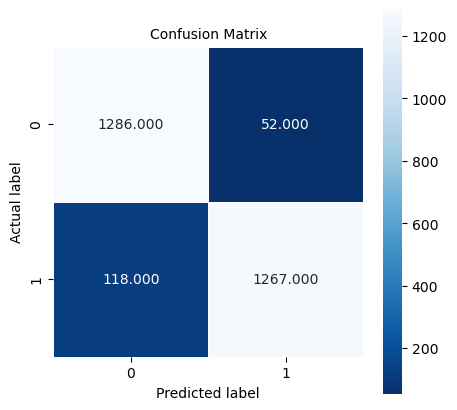

In [161]:
# Confusion matrix for random Oversampler und Random Forest Classification without Cluster und Reached on Time
confusion_matrix = metrics.confusion_matrix(y_test, y_test_pred)

plt.figure(figsize=(5, 5))
sns.heatmap(confusion_matrix, annot=True, fmt=".3f", linewidths=.5, square=True, cmap='Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.title('Confusion Matrix', size=10)
plt.show()

In [162]:
#Cross-validation for Random Oversampler and Random Forest Classification with data set without cluster and Reached on Time -> worse result

X = X_min_max_resampled_randomoversampler  
y = y_min_max_resampled_randomoversampler  

kf = KFold(n_splits=10, shuffle=True, random_state=42)
cv_scores = cross_val_score(best_model, X, y, cv=kf)

print("Cross-validation scores:", cv_scores)
print("Mean cross-validation score:", cv_scores.mean())

Cross-validation scores: [0.97818182 0.95878788 0.96484848 0.97090909 0.97212121 0.97333333
 0.96848485 0.96727273 0.97575758 0.98181818]
Mean cross-validation score: 0.9711515151515153
